# Fit of the new trPL DATA, measured with the APD. 

In [ ]:
# Import necessary libraries
import warnings, os, sys, shutil
# remove warnings from the output
os.environ["PYTHONWARNINGS"] = "ignore"
warnings.filterwarnings(action='ignore', category=FutureWarning)
warnings.filterwarnings(action='ignore', category=UserWarning)
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from numpy.random import default_rng
import torch, copy, uuid
import pySIMsalabim as sim
from pySIMsalabim.experiments.JV_steady_state import *
import ax, logging
from ax.utils.notebook.plotting import init_notebook_plotting, render
init_notebook_plotting() # for Jupyter notebooks

# try:
#     from optimpv import *
#     from optimpv.RateEqfits.RateEqAgent import RateEqAgent
#     from optimpv.RateEqfits.RateEqModel import *
#     from optimpv.RateEqfits.Pumps import *
# except Exception as e:
sys.path.append('../') # add the path to the optimpv module
from optimpv_github import *
from optimpv_github.RateEqfits.RateEqAgent import RateEqAgent
from optimpv_github.RateEqfits.RateEqModel import *
from optimpv_github.RateEqfits.Pumps import *

import pickle

from optimpv_github.axBOtorch.axBOtorchOptimizer import axBOtorchOptimizer
from botorch.acquisition.logei import qLogNoisyExpectedImprovement 
from ax.adapter.transforms.standardize_y import StandardizeY
from ax.adapter.transforms.unit_x import UnitX
from ax.adapter.transforms.remove_fixed import RemoveFixed
from ax.adapter.transforms.log import Log
from ax.generators.torch.botorch_modular.utils import ModelConfig
from ax.generators.torch.botorch_modular.surrogate import SurrogateSpec
from gpytorch.kernels import MaternKernel

from gpytorch.kernels import ScaleKernel
from botorch.models import SingleTaskGP

import copy
import pickle
from optimpv.general.general import *
from optimpv.scipyOpti.scipyOptimizer import ScipyOptimizer
import time

In [2]:
# Check that it is the right optimPV imported
import importlib
spec = importlib.util.find_spec('optimpv_github')
print(spec)

ModuleSpec(name='optimpv_github', loader=<_frozen_importlib_external.SourceFileLoader object at 0x7efa350f8830>, origin='/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/OptimPV-Github/optimPV/Notebooks/../optimpv_github/__init__.py', submodule_search_locations=['/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/OptimPV-Github/optimPV/Notebooks/../optimpv_github'])


In [3]:
## Define the parameters for the simulation

In [5]:
import httpimport
import sys
with httpimport.github_repo('MimaxSimm', 'trPL_Analysis', ref='master'):
    import trPL_importClass

<string>:497: SyntaxWarning:

invalid escape sequence '\m'

<string>:502: SyntaxWarning:

invalid escape sequence '\m'

<string>:555: SyntaxWarning:

invalid escape sequence '\m'



In [6]:
# Define the parameters to be fitted
params_3Traps = []

Eg = FitParam(name = 'Eg', value = 1.553, bounds = [0.5,2.0], log_scale = False, rescale = True, value_type = 'float', type='fixed', display_name=r'$E_g$', unit='eV', axis_type = 'linear')
params_3Traps.append(Eg)

L = FitParam(name = 'L', value = 800e-9, bounds = [400e-9,1e-6], log_scale = True, rescale = True, value_type = 'float', type='fixed', display_name=r'$L$', unit='m', axis_type = 'linear',force_log=True)
params_3Traps.append(L)

alpha = FitParam(name = 'alpha', value = 36300*1e2, bounds = [1e6,1e8], log_scale = True, rescale = True, value_type = 'float', type='fixed', display_name=r'$\alpha$', unit='m$^{-1}$', axis_type = 'log',)
params_3Traps.append(alpha)

N_cv = FitParam(name = 'N_cv', value = 2e24, bounds = [1e19,1e25], log_scale = True, rescale = True, value_type = 'float', type='fixed', display_name=r'$N_{cv}$', unit='m$^{-3}$', axis_type = 'log',force_log=True)
params_3Traps.append(N_cv)

k_direct = FitParam(name = 'k_direct', value = 1.96e-17, bounds = [5e-18,5e-17], log_scale = True, rescale = True, value_type = 'float', type='range', display_name=r'$k_{\text{direct}}$', unit='m$^{3}$ s$^{-1}$', axis_type = 'log',force_log=True)
params_3Traps.append(k_direct)

mu_n = FitParam(name = 'mu_n', value = 1.2e-4, bounds = [1e-6,1e-3], log_scale = True, rescale = True, value_type = 'float', type='range', display_name=r'$\mu_n$', unit='m$^{2}$ V$^{-1}$ s$^{-1}$', axis_type = 'log',force_log=True)
params_3Traps.append(mu_n) # 4e-1*1e-4

mu_p = FitParam(name = 'mu_p', value = 4e-5, bounds = [1e-6,1e-3], log_scale = True, rescale = True, value_type = 'float', type='range', display_name=r'$\mu_p$', unit='m$^{2}$ V$^{-1}$ s$^{-1}$', axis_type = 'log',force_log=True)
params_3Traps.append(mu_p) # 4e-1*1e-4

N_t_bulk_1 = FitParam(name = 'N_t_bulk_1', value = 1.85e23, bounds = [1e19,1e26], log_scale = True, rescale = True, value_type = 'float', type='range', display_name=r'$N_{t,\text{bulk}}$', unit='m$^{-3}$', axis_type = 'log',force_log=True)
params_3Traps.append(N_t_bulk_1)

C_n_1 = FitParam(name = 'C_n_1', value = 4.24e-15, bounds = [1e-22,1e-12], log_scale = True, rescale = True, value_type = 'float', type='range', display_name=r'$C_{n,1}$', unit='m$^{3}$ s$^{-1}$', axis_type = 'log',force_log=True)
params_3Traps.append(C_n_1)

C_p_1 = FitParam(name = 'C_p_1', value = 8.85e-19, bounds = [1e-22,1e-12], log_scale = True, rescale = True, value_type = 'float', type='range', display_name=r'$C_{p,1}$', unit='m$^{3}$ s$^{-1}$', axis_type = 'log',force_log=True)
params_3Traps.append(C_p_1)

E_t_bulk_1 = FitParam(name = 'E_t_bulk_1', value = 0.2, bounds = [0.02,Eg.value-0.02], log_scale = True, rescale = True, value_type = 'float', type='range', display_name=r'$E_{t,\text{bulk}}$', unit='m$^{3}$ s$^{-1}$', axis_type = 'log',force_log=False)
params_3Traps.append(E_t_bulk_1)

N_t_bulk_2 = FitParam(name = 'N_t_bulk_2', value = 1.36e21, bounds = [1e19,1e26], log_scale = True, rescale = True, value_type = 'float', type='range', display_name=r'$N_{t,\text{bulk}}$', unit='m$^{-3}$', axis_type = 'log',force_log=True)
params_3Traps.append(N_t_bulk_2)

C_n_2 = FitParam(name = 'C_n_2', value = 1e-14, bounds = [1e-22,1e-12], log_scale = True, rescale = True, value_type = 'float', type='range', display_name=r'$C_{n,2}$', unit='m$^{3}$ s$^{-1}$', axis_type = 'log',force_log=True)
params_3Traps.append(C_n_2)

C_p_2 = FitParam(name = 'C_p_2', value = 1.13e-16, bounds = [1e-22,1e-12], log_scale = True, rescale = True, value_type = 'float', type='range', display_name=r'$C_{p,2}$', unit='m$^{3}$ s$^{-1}$', axis_type = 'log',force_log=True)
params_3Traps.append(C_p_2)

E_t_bulk_2 = FitParam(name = 'E_t_bulk_2', value = 1.34, bounds = [0.02,Eg.value-0.02], log_scale = True, rescale = True, value_type = 'float', type='range', display_name=r'$E_{t,\text{bulk}}$', unit='m$^{3}$ s$^{-1}$', axis_type = 'log',force_log=False)
params_3Traps.append(E_t_bulk_2)

# N_t_bulk_3 = FitParam(name = 'N_t_bulk_3', value = 1.36e21, bounds = [1e19,1e26], log_scale = True, rescale = True, value_type = 'float', type='range', display_name=r'$N_{t,\text{bulk}}$', unit='m$^{-3}$', axis_type = 'log',force_log=True)
# params_3Traps.append(N_t_bulk_3)

# C_n_3 = FitParam(name = 'C_n_3', value = 1e-14, bounds = [1e-22,1e-12], log_scale = True, rescale = True, value_type = 'float', type='range', display_name=r'$C_{n,2}$', unit='m$^{3}$ s$^{-1}$', axis_type = 'log',force_log=True)
# params_3Traps.append(C_n_3)

# C_p_3 = FitParam(name = 'C_p_3', value = 1.13e-16, bounds = [1e-22,1e-12], log_scale = True, rescale = True, value_type = 'float', type='range', display_name=r'$C_{p,2}$', unit='m$^{3}$ s$^{-1}$', axis_type = 'log',force_log=True)
# params_3Traps.append(C_p_3)

# E_t_bulk_3 = FitParam(name = 'E_t_bulk_3', value = 1.34, bounds = [0.02,Eg.value-0.02], log_scale = True, rescale = True, value_type = 'float', type='range', display_name=r'$E_{t,\text{bulk}}$', unit='m$^{3}$ s$^{-1}$', axis_type = 'log',force_log=False)
# params_3Traps.append(E_t_bulk_3)

I_factor_PL = FitParam(name = 'I_factor_PL', value = 1.275e-22, bounds = [1e-27,1e-20], log_scale = True, rescale = True, value_type = 'float', type='fixed', display_name=r'$I_{\text{PL}}$', unit='-', axis_type = 'log', force_log=True)
params_3Traps.append(I_factor_PL) # in the following we weill fit the PL with the normalized log transformation so this factor is not useful and can be fixed to any value

# original values
params3Traps_orig = copy.deepcopy(params_3Traps)
num_free_params = 0
dum_dic = {}
for i in range(len(params_3Traps)):
    if params_3Traps[i].force_log:
        dum_dic[params_3Traps[i].name] = np.log10(params_3Traps[i].value)
    else:
        dum_dic[params_3Traps[i].name] = params_3Traps[i].value/params_3Traps[i].fscale
   # we need this just to run the model to generate some fake data

    if params_3Traps[i].type != 'fixed'    :
        num_free_params += 1

In [7]:
# import Data
path2data = os.path.abspath('/home/qrb/Documents/PhD/Experimental/chapter1: LongPulses/20251028-ReviewsFAPI/trPL/PowerDep-Before/Fits') # path to the parent directory if not in Notebooks use os.getcwd()
#path2data  = os.path.join(parent_dir,'Fitted')

trPLs = trPL_importClass.trPL_measurement_series(path2data, BG = params_3Traps[0].value, thickness = params_3Traps[1].value, TRPL_denoise = 50, mode = "auto", retime = True, importPL=True, importSPV=False)

Lambda Laser set to: 7.050000e-07
Spot diameter set to: 2.720000e-04
Film thickness set to: 8.000000e-07
Beam dump ratio set to: 2.100000e-01
BG, Nc and Nv set to:1.553 2e+18 2e+18
['M0-FAPI2Q3-Spot1_6200s_10kHz_ND2_300cps_0.0217967uW.dat', 'M1-FAPI2Q3-Spot1_6200s_10kHz_ND3_750cps_0.0739642uW.dat', 'M2-FAPI2Q3-Spot1_6200s_10kHz_ND4_1580cps_0.27076799999999995uW.dat', 'M3-FAPI2Q3-Spot1_6200s_10kHz_ND6_260cps_1.22053uW.dat']


In [8]:
# import Data
parent_dir = os.path.abspath('/home/qrb/Documents/PhD/Experimental/chapter1: LongPulses/20251028-ReviewsFAPI/trPL/PowerDep-After20Hours1SUN') # path to the parent directory if not in Notebooks use os.getcwd()

trPLs_after21H = trPL_importClass.trPL_measurement_series(parent_dir, BG = params_3Traps[0].value, thickness = params_3Traps[1].value, TRPL_denoise = 50, mode = "auto", retime = True, importPL=True, importSPV=False)

Lambda Laser set to: 7.050000e-07
Spot diameter set to: 2.720000e-04
Film thickness set to: 8.000000e-07
Beam dump ratio set to: 2.100000e-01
BG, Nc and Nv set to:1.553 2e+18 2e+18
['M0-FAPI2Q3-Spot1_5400s_10kHz_ND1_170cps_0.0222443uW.dat', 'M1-FAPI2Q3-Spot1_5400s_10kHz_ND1_850cps_0.0732926uW.dat', 'M2-FAPI2Q3-Spot1_3600s_10kHz_ND3_540cps_0.268529uW.dat', 'M3-FAPI2Q3-Spot1_3600s_10kHz_ND4_1750cps_1.2124700000000002uW.dat']


In [9]:
# import Data
parent_dir = os.path.abspath('/home/qrb/Documents/PhD/Experimental/chapter1: LongPulses/20251028-ReviewsFAPI/trPL/3Q2/Before') # path to the parent directory if not in Notebooks use os.getcwd()

trPLs3Q2_before = trPL_importClass.trPL_measurement_series(parent_dir, BG = params_3Traps[0].value, thickness = params_3Traps[1].value, TRPL_denoise = 50, mode = "auto", retime = True, importPL=True, importSPV=False)

Lambda Laser set to: 7.050000e-07
Spot diameter set to: 2.720000e-04
Film thickness set to: 8.000000e-07
Beam dump ratio set to: 2.100000e-01
BG, Nc and Nv set to:1.553 2e+18 2e+18
['M0-FAPI3Q2-Spot1_5400s_10kHz_ND1_570cps_0.021124999999999998uW.dat', 'M1-FAPI3Q2-Spot1_5400s_10kHz_ND2_530cps_0.07262089999999999uW.dat', 'M2-FAPI3Q2-Spot1_3600s_10kHz_ND3_750cps_0.33637uW.dat', 'M3-FAPI3Q2-Spot1_3600s_10kHz_ND4_700cps_1.1990399999999999uW.dat', 'M4-FAPI3Q2-Spot1_1800s_10kHz_ND1_510cps_0.0213489uW.dat']


In [10]:
trPLs3Q2_before.TRPLs_noise

[np.float64(3.98),
 np.float64(3.44),
 np.float64(2.06),
 np.float64(2.04),
 np.float64(1.3)]

In [11]:
# import Data
parent_dir = os.path.abspath('/home/qrb/Documents/PhD/Experimental/chapter1: LongPulses/20251028-ReviewsFAPI/trPL/3Q2/After21H') # path to the parent directory if not in Notebooks use os.getcwd()

trPLs3Q2_after = trPL_importClass.trPL_measurement_series(parent_dir, BG = params_3Traps[0].value, thickness = params_3Traps[1].value, TRPL_denoise = 50, mode = "auto", retime = True, importPL=True, importSPV=False)

Lambda Laser set to: 7.050000e-07
Spot diameter set to: 2.720000e-04
Film thickness set to: 8.000000e-07
Beam dump ratio set to: 2.100000e-01
BG, Nc and Nv set to:1.553 2e+18 2e+18
['M0-FAPI3Q2-Spot3_5400s_10kHz_ND1_110cps_0.0220206uW.dat', 'M1-FAPI3Q2-Spot3_5400s_10kHz_ND1_670cps_0.07351640000000001uW.dat', 'M2-FAPI3Q2-Spot3_3600s_10kHz_ND2_1140cps_0.27032uW.dat', 'M3-FAPI3Q2-Spot3_3600s_10kHz_ND4_310cps_1.21471uW.dat', 'M4-FAPI3Q2-Spot3_1800s_10kHz_ND1_50cps_0.022916100000000002uW.dat']


In [12]:
trPLs3Q2_after.TRPLs_noise

[np.float64(2.38),
 np.float64(2.58),
 np.float64(1.94),
 np.float64(1.82),
 np.float64(0.9)]

# Differential Decay Times

Number of exponentials for fit used is = [5, 5, 5, 5]

3.49e+13
1.19e+14
4.34e+14
1.96e+15


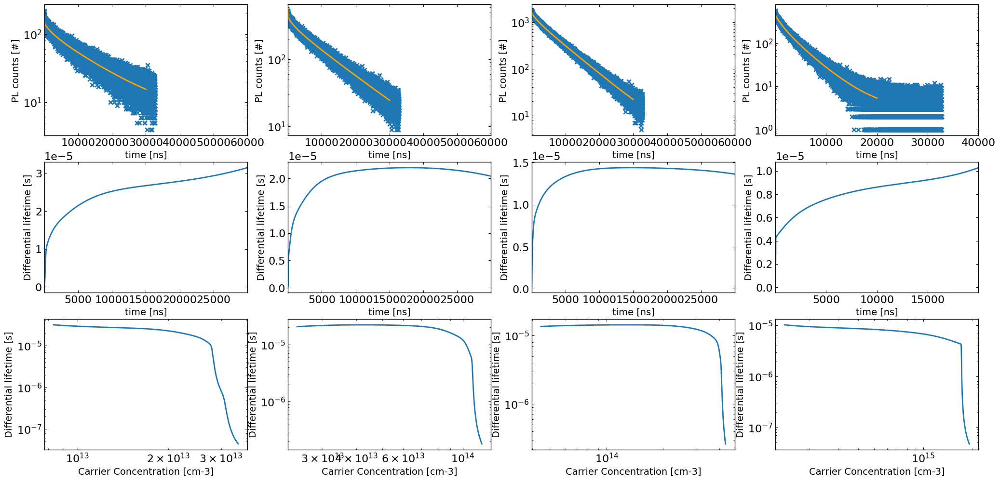

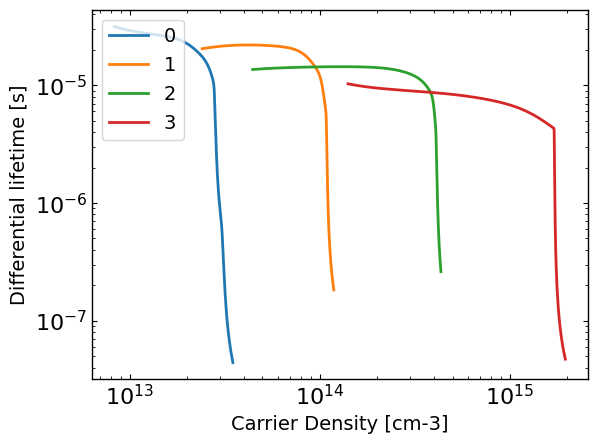

In [350]:
#Differential lifetimes
l = [30000,30000,30000,20000, 30000]
n_exp = [5 for i in trPLs.n0s]

times_TwoQThree, densities_TwoQThree, taudiffs_TwoQThree = trPLs.fit_difflifetimes(n_exp=n_exp, l2=l)

Number of exponentials for fit used is = [5, 5, 5, 5]

3.57e+13
1.18e+14
4.31e+14
1.94e+15


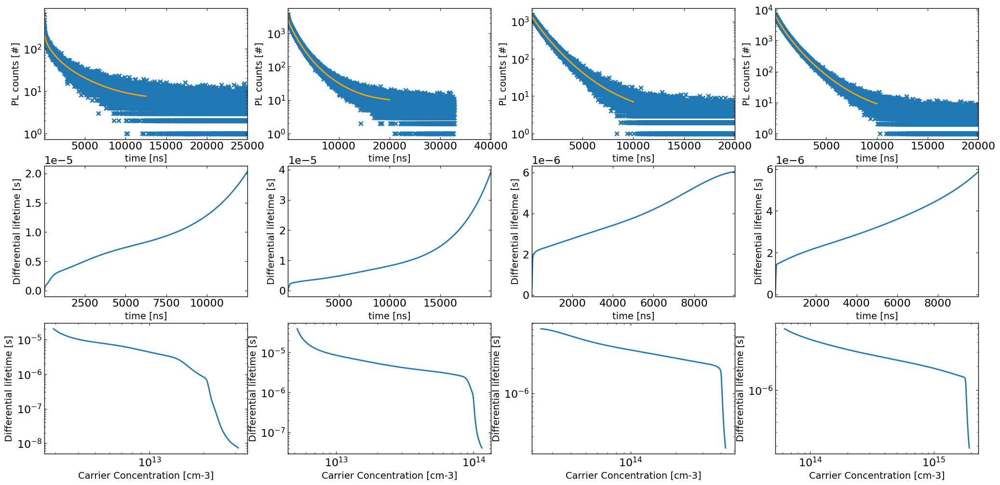

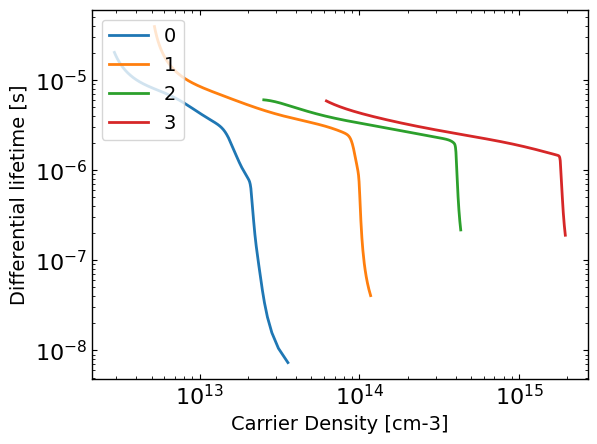

In [351]:
#Differential lifetimes
l = [12500,20000,10000, 10000,30000]
n_exp = [5 for i in trPLs_after21H.n0s]

times_TwoQThree, densities_TwoQThree, taudiffs_TwoQThree = trPLs_after21H.fit_difflifetimes(n_exp=n_exp, l2=l)

Number of exponentials for fit used is = [5, 5, 5, 5, 5]

3.39e+13
1.16e+14
5.39e+14
1.92e+15
3.42e+13


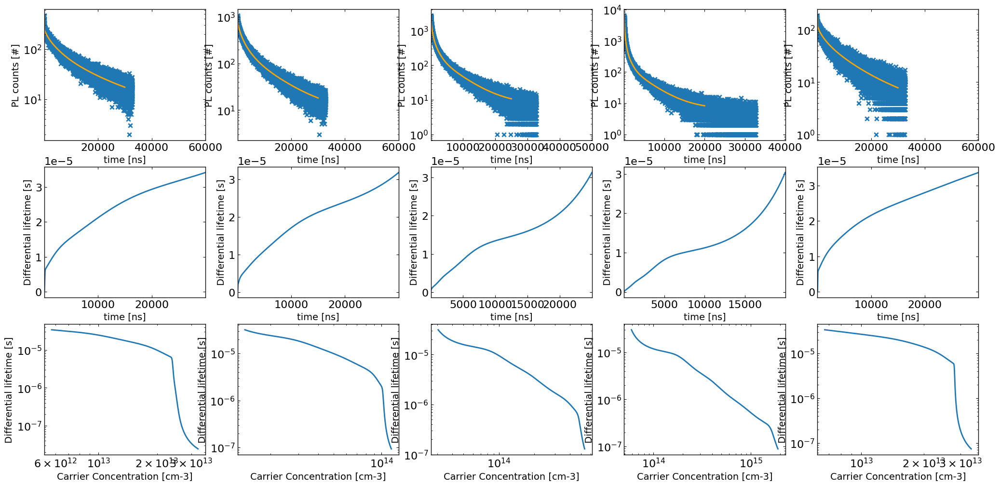

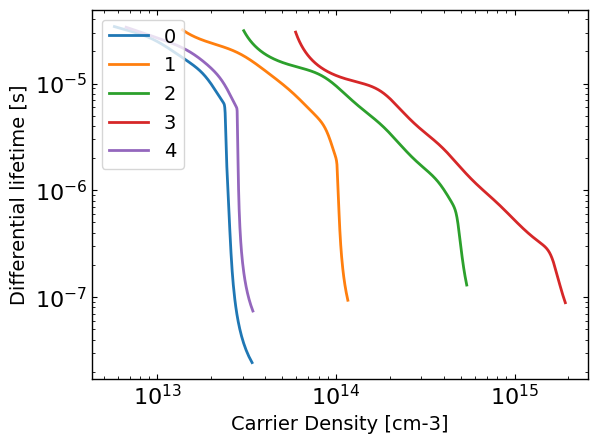

In [352]:
#Differential lifetimes
l = [30000,30000,25000, 20000, 30000]
n_exp = [5 for i in trPLs3Q2_before.n0s]

times_TwoQThree, densities_TwoQThree, taudiffs_TwoQThree = trPLs3Q2_before.fit_difflifetimes(n_exp=n_exp, l2=l)

Number of exponentials for fit used is = [5, 5, 5, 5, 5]

3.53e+13
1.18e+14
4.33e+14
1.95e+15
3.67e+13


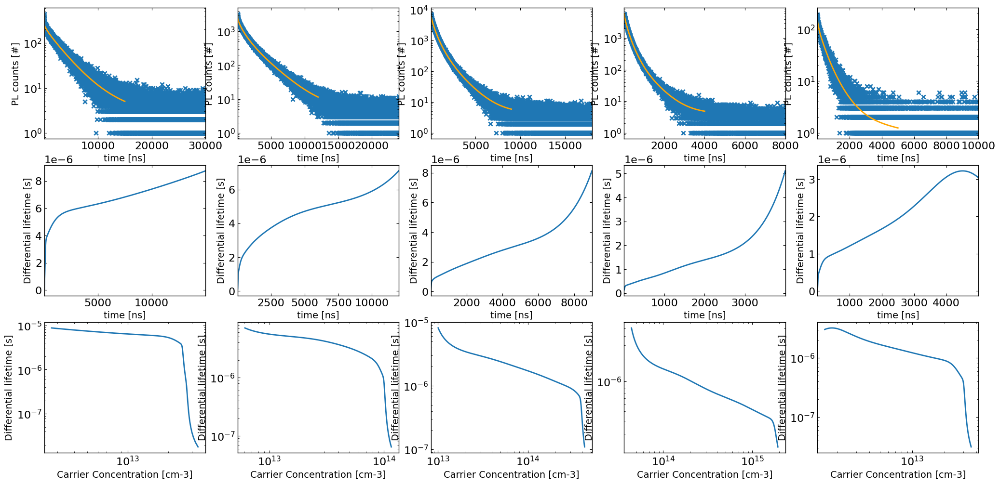

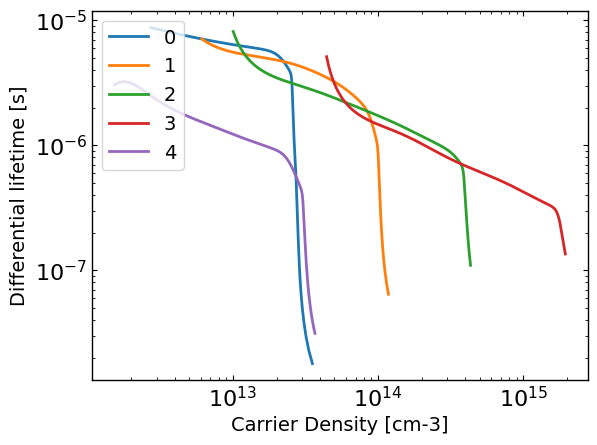

In [353]:
#Differential lifetimes
l = [15000,12000, 9000, 4000, 5000]
n_exp = [5 for i in trPLs3Q2_after.n0s]

times_TwoQThree, densities_TwoQThree, taudiffs_TwoQThree = trPLs3Q2_after.fit_difflifetimes(n_exp=n_exp, l2=l)

# Results of fitting

In [13]:
A4_width = 8.27
A4_height = 11.69

In [14]:
import pickle
import ax.core.map_data as map_data

# 1. Dummy class to stand in for the missing MapKeyInfo
class MapKeyInfo:
    def __init__(self, *args, **kwargs):
        # Ignore constructor args
        pass

    def __setstate__(self, state):
        # Completely ignore whatever was pickled for this object.
        # Or selectively keep what you need, e.g.:
        # self.some_attr = state.get("some_attr")
        pass

    def __getstate__(self):
        # If the object is re-pickled later, decide what to save.
        return {}

# 2. Monkey-patch it into the module so pickle can find it
map_data.MapKeyInfo = MapKeyInfo
# # 3. Now unpickle your file
# with open(os.path.join(folder2Q3After_3Free, result_files_optimizers[0]), "rb") as f:
#     opti = pickle.load(f)

In [14]:
# Plot of the best fits. 
from optimpv.general.general import *
import math

def import_results(folderpath, n_traps = 3, eqtime = 120, solve_type = 'BDF'):

    result_files = [f for f in os.listdir(folderpath) if "RateEq" in f]
    result_files.sort()

    result_files_optimizers = [f for f in os.listdir(folderpath) if "optimizer" in f]
    result_files_optimizers.sort()

    fig, ax = plt.subplots(len(result_files),4, figsize=(20,30))
    exp_format = 'trPL' # experiment format
    model = partial(DBTD_multi_trap, method=solve_type, dimensionless=True, timeout=eqtime, timeout_solve=eqtime)

    Cns = np.zeros((len(result_files),n_traps))
    Cps = np.zeros((len(result_files),n_traps))
    Ets = np.zeros((len(result_files),n_traps))
    Nts = np.zeros((len(result_files),n_traps))
    nrmses = np.zeros((len(result_files),))
    mask = []

    for i, file in enumerate(result_files):

        filepath = os.path.join(folderpath, file)
        print(file)
        with open(filepath, 'rb') as file:
            RateEq = pickle.load(file)
        filepath_opti = os.path.join(folderpath, result_files_optimizers[i])
        with open(filepath_opti, 'rb') as file:
            opti = pickle.load(file)

        cancel = False
        for p, pB in zip(RateEq.params, opti.params):
            if (p.name == pB.name):
                if not(pB.value == p.value):
                    print(f"Params {p.name:s}, are not the same")
                    cancel = True
                    break
        if (cancel):      
            RateEq.params = opti.params 

        if not(i):
            Eg = RateEq.params[0].value
            L = RateEq.params[1].value
            alpha = RateEq.params[2].value
            k_bimol = RateEq.params[4].value
            mun = RateEq.params[5].value
            mup = RateEq.params[6].value
        elif not((Eg, L, alpha) == (RateEq.params[0].value, RateEq.params[1].value, RateEq.params[2].value)):
            print("error")
            print((Eg, L, alpha), (RateEq.params[0].value, RateEq.params[1].value, RateEq.params[2].value))
            #continue
        
        Nts[i, :] = [RateEq.params[7+4*i].value for i in range(n_traps)]
        Cns[i, :] = [RateEq.params[8+4*i].value for i in range(n_traps)]
        Cps[i, :] = [RateEq.params[9+4*i].value for i in range(n_traps)]
        Ets[i, :] = [RateEq.params[10+4*i].value for i in range(n_traps)]

        
        RateEq.model = model
        y_test = RateEq.run({},exp_format=exp_format) # get the initial prediction with the original parameters
        if not(type(y_test) == np.ndarray):
            print("     Error for ", i, file, "Trying with LSODA")
            model = partial(DBTD_multi_trap, method="LSODA", dimensionless=True, timeout=eqtime, timeout_solve=eqtime)
            RateEq.model = model
            y_test = RateEq.run({},exp_format=exp_format) # get the initial prediction with the original parameters

            if not(type(y_test) == np.ndarray):
                print("     Error for ", i, file)
                continue
        
        y_transformed, y_pred_transformed = transform_data(np.array(RateEq.y[0]),y_test, transform_type='normalized_log', do_G_frac_transform=True, X=np.array(RateEq.X[0]))
        #y_transformed2, y_pred_transformed2 = transform_data(np.asarray(RateEq.y)[0],y_test, transform_type='normalized_log', do_G_frac_transform=True, X=np.asarray(RateEq.y)[0])

        #print(calc_metric(y_transformed, y_pred_transformed, metric_name='nrmse'))
        nrmses[i] = calc_metric(y_transformed, y_pred_transformed, metric_name='nrmse')
        print(calc_metric(y_transformed, y_pred_transformed, metric_name='nrmse'))

        X = np.array(RateEq.X[0])
        viridis = plt.get_cmap('viridis', len(np.unique(X[:, 1])))

        for j, G in enumerate(np.unique(X[:, 1])):
            ax[i,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_transformed[X[:, 1] == G],'o',color=viridis(j),alpha=0.1)
            ax[i,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_pred_transformed[X[:, 1] == G], color=viridis(j), linestyle='-', label=f'{G:.2f}')

    for b in ax:
        for a in b:
            a.set_ylim([1e-3, 1.3])
            a.set_xscale('log')
            a.set_yscale('log')
            a.set_xlabel('Time [s]')
            a.set_ylabel(exp_format + ' [a.u.]')
            a.legend(title='Intensity fraction:')

    return Nts, Cns, Cps, Ets, mun, mup, nrmses

In [15]:
def reorderall_values(Nts, Cns, Cps, Ets):
    def reorderValues_fromRatios(ratios, values):
        newvalues = np.zeros_like(values)
        for j in range(len(ratios)):
            sorted = np.argsort(ratios[j])
            newvalues[j] = values[j, sorted]
        return newvalues
    
    ratios = Cns/Cps

    Nts_r = reorderValues_fromRatios(ratios, Nts)
    Cns_r = reorderValues_fromRatios(ratios, Cns)
    Cps_r = reorderValues_fromRatios(ratios, Cps)
    Ets_r = reorderValues_fromRatios(ratios, Ets)

    return Nts_r, Cns_r, Cps_r, Ets_r

In [16]:
def reorderall_values(Nts, Cns, Cps, Ets):
    def reorderValues_fromRatios(ratios, values):
        newvalues = np.zeros_like(values)
        for j in range(len(ratios)):
            sorted = np.argsort(ratios[j])
            newvalues[j] = values[j, sorted]
        return newvalues
    
    ratios = Cns/Cps

    Nts_r = reorderValues_fromRatios(ratios, Nts)
    Cns_r = reorderValues_fromRatios(ratios, Cns)
    Cps_r = reorderValues_fromRatios(ratios, Cps)
    Ets_r = reorderValues_fromRatios(ratios, Ets)

    return Nts_r, Cns_r, Cps_r, Ets_r

In [17]:
def import_mus(folderpath):
    result_files = [f for f in os.listdir(folderpath) if "RateEq" in f]
    result_files.sort()

    muns = np.zeros((len(result_files),))
    mups = np.zeros((len(result_files),))

    for i, file in enumerate(result_files):
        filepath = os.path.join(folderpath, file)
        with open(filepath, 'rb') as file:
            RateEq = pickle.load(file)

        muns[i] = RateEq.params[5].value
        mups[i] = RateEq.params[6].value

    return muns, mups

0.01735011628413716
0.027617395783227208
0.021300788458803045
0.023876890736164252
[0.02328498 0.01735012 0.02354306 0.01973965]
[0.0276174  0.02987702 0.02975315]
[0.02130079 0.02662108]
[0.02441837 0.02496916 0.02455057 0.02418228 0.02387689 0.02405834]


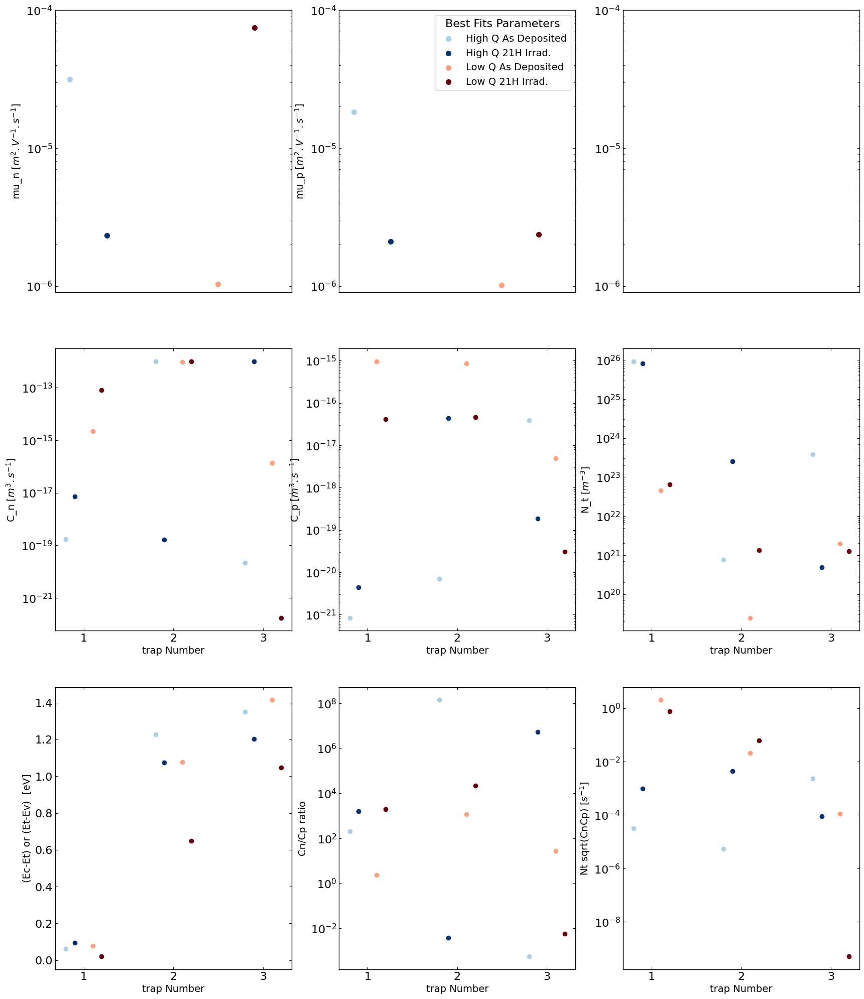

In [ ]:
fig, ax = plt.subplots(3,3, figsize = (2.5*A4_width, 3*A4_width))

blues = plt.get_cmap('Blues', 4)
reds = plt.get_cmap('Reds', 4)

filter = 2 #<0.027) & (nrmses2Q3Before_3Free>0.0)
print(nrmses2Q3Before_3Free[filter])
Nts_r, Cns_r, Cps_r, Ets_r =  Nts2Q3Before_3Free, Cns2Q3Before_3Free, Cps2Q3Before_3Free, Ets2Q3Before_3Free#reorderall_values(Nts2Q3Before_3Free, Cns2Q3Before_3Free, Cps2Q3Before_3Free, Ets2Q3Before_3Free)

filter2 = 0 #<0.03) & (nrmses2Q3After_3Free>0.0)
print(nrmses2Q3After_3Free[filter2])
Nts_r2, Cns_r2, Cps_r2, Ets_r2 =  Nts2Q3After_3Free, Cns2Q3After_3Free, Cps2Q3After_3Free, Ets2Q3After_3Free#reorderall_values(Nts2Q3After_3Free, Cns2Q3After_3Free, Cps2Q3After_3Free, Ets2Q3After_3Free)

filter3 = 0 #np.argmin(nrmses3Q2Before_3Free[nrmses3Q2Before_3Free>0]) #<0.03) & (nrmses3Q2Before_3Free>0.0)
print(nrmses3Q2Before_3Free[filter3])
Nts_r3, Cns_r3, Cps_r3, Ets_r3 =  Nts3Q2Before_3Free, Cns3Q2Before_3Free, Cps3Q2Before_3Free, Ets3Q2Before_3Free#reorderall_values(Nts3Q2Before_3Free, Cns3Q2Before_3Free, Cps3Q2Before_3Free, Ets3Q2Before_3Free)

filter4 = 7 #<0.03) & (nrmses3Q2After_3Free>0.0)
print(nrmses3Q2After_3Free[filter4])
Nts_r4, Cns_r4, Cps_r4, Ets_r4 =  Nts3Q2After_3Free, Cns3Q2After_3Free, Cps3Q2After_3Free, Ets3Q2After_3Free#reorderall_values(Nts3Q2After_3Free, Cns3Q2After_3Free, Cps3Q2After_3Free, Ets3Q2After_3Free)
ax[0,0].scatter(0,      np.array(muns_2Q3Before[filter]), s=50,color = blues(1), label = "High Q As Deposited")
ax[0,1].scatter(0,      np.array(mups_2Q3Before[filter]), s=50,color = blues(1), label = "High Q As Deposited")
ax[0,0].scatter(0.25,   np.array(muns_2Q3After[filter2]), s=50,color = blues(3), label = "High Q 21H Irrad.")
ax[0,1].scatter(0.25,   np.array(mups_2Q3After[filter2]), s=50,color = blues(3), label = "High Q 21H Irrad.")
ax[0,0].scatter(1,      np.array(muns_3Q2Before[filter3]), s=50,color=reds(1), label = "Low Q As Deposited")
ax[0,1].scatter(1,      np.array(mups_3Q2Before[filter3]), s=50,color=reds(1), label = "Low Q As Deposited")
ax[0,0].scatter(1.25,   np.array(muns_3Q2After[filter4]), s=50,color=reds(3), label = "Low Q 21H Irrad.")
ax[0,1].scatter(1.25,   np.array(mups_3Q2After[filter4]), s=50,color=reds(3), label = "Low Q 21H Irrad.")

for j in range(3):
    ax[1,0].scatter(0.8+j,np.array(Cns_r[filter,j]),color = blues(1))
    ax[1,1].scatter(0.8+j,np.array(Cps_r[filter,j]),color = blues(1))
    ax[1,2].scatter(0.8+j,np.array(Nts_r[filter,j]),color = blues(1))
    ax[2,0].scatter(0.8+j,np.amin([Ets_r[filter,j]]),color = blues(1))
    ax[2,1].scatter(0.8+j,np.array(Cns_r[filter,j])/Cps_r[filter,j],color = blues(1))
    ax[2,2].scatter(0.8+j,np.array(Nts_r[filter,j]*np.sqrt(Cns_r[filter,j])*Cps_r[filter,j]),color=blues(1))

    ax[1,0].scatter(0.9+j,np.array(Cns_r2[filter2,j]),color = blues(3))
    ax[1,1].scatter(0.9+j,np.array(Cps_r2[filter2,j]),color = blues(3))
    ax[1,2].scatter(0.9+j,np.array(Nts_r2[filter2,j]),color = blues(3))
    ax[2,0].scatter(0.9+j,np.amin([Ets_r2[filter2,j]]),color = blues(3))
    ax[2,1].scatter(0.9+j,np.array(Cns_r2[filter2,j])/Cps_r2[filter2,j],color = blues(3))
    ax[2,2].scatter(0.9+j,np.array(Nts_r2[filter2,j]*np.sqrt(Cns_r2[filter2,j])*Cps_r2[filter2,j]),color=blues(3))

    ax[1,0].scatter(1.1+j,np.array(Cns_r3[filter3,j]),color=reds(1))
    ax[1,1].scatter(1.1+j,np.array(Cps_r3[filter3,j]),color=reds(1))
    ax[1,2].scatter(1.1+j,np.array(Nts_r3[filter3,j]),color=reds(1))
    ax[2,0].scatter(1.1+j,np.amin([Ets_r3[filter3,j]]),color=reds(1))
    ax[2,1].scatter(1.1+j,np.array(Cns_r3[filter3,j])/Cps_r3[filter3,j],color=reds(1))
    ax[2,2].scatter(1.1+j,np.array(Nts_r3[filter3,j]*np.sqrt(Cns_r3[filter3,j])*Cps_r3[filter3,j]),color=reds(1))
    
    ax[1,0].scatter(1.2+j, np.array(Cns_r4[filter4,j]),color=reds(3))
    ax[1,1].scatter(1.2+j, np.array(Cps_r4[filter4,j]),color=reds(3))
    ax[1,2].scatter(1.2+j, np.array(Nts_r4[filter4,j]),color=reds(3))
    ax[2,0].scatter(1.2+j, np.amin([Ets_r4[filter4,j]]),color=reds(3))
    ax[2,1].scatter(1.2+j, np.array(Cns_r4[filter4,j])/Cps_r4[filter4,j],color=reds(3))
    ax[2,2].scatter(1.2+j, np.array(Nts_r4[filter4,j]*np.sqrt(Cns_r4[filter4,j])*Cps_r4[filter4,j]),color=reds(3))

filter = (nrmses2Q3Before_3Free<0.027) & (nrmses2Q3Before_3Free>0.0)
print(nrmses2Q3Before_3Free[filter])
Nts_r, Cns_r, Cps_r, Ets_r =  reorderall_values(Nts2Q3Before_3Free, Cns2Q3Before_3Free, Cps2Q3Before_3Free, Ets2Q3Before_3Free)

filter2 = (nrmses2Q3After_3Free<0.03) & (nrmses2Q3After_3Free>0.0)
print(nrmses2Q3After_3Free[filter2])
Nts_r2, Cns_r2, Cps_r2, Ets_r2 =  reorderall_values(Nts2Q3After_3Free, Cns2Q3After_3Free, Cps2Q3After_3Free, Ets2Q3After_3Free)

filter3 =(nrmses3Q2Before_3Free<0.027) & (nrmses3Q2Before_3Free>0.0)
print(nrmses3Q2Before_3Free[filter3])
Nts_r3, Cns_r3, Cps_r3, Ets_r3 =  reorderall_values(Nts3Q2Before_3Free, Cns3Q2Before_3Free, Cps3Q2Before_3Free, Ets3Q2Before_3Free)

filter4 = (nrmses3Q2After_3Free<0.027) & (nrmses3Q2After_3Free>0.0)
print(nrmses3Q2After_3Free[filter4])
Nts_r4, Cns_r4, Cps_r4, Ets_r4 =  reorderall_values(Nts3Q2After_3Free, Cns3Q2After_3Free, Cps3Q2After_3Free, Ets3Q2After_3Free)

boxprops1 = {'facecolor': blues(1)}
boxprops2 = {'facecolor': blues(3)}
boxprops3 = {'facecolor': reds(1)}
boxprops4 = {'facecolor': reds(3)}

# for j in range(3):
#     ax[0,0].boxplot(np.array(muns_2Q3Before[filter]), positions  = [3*j], patch_artist=True, boxprops = boxprops1)
#     ax[0,1].boxplot(np.array(mups_2Q3Before[filter]), positions  = [3*j], patch_artist=True, boxprops = boxprops1)
#     ax[1,0].boxplot(np.array(Cns_r[filter,j]),positions  = [3*j], patch_artist=True, boxprops = boxprops1)
#     ax[1,1].boxplot(np.array(Cps_r[filter,j]),positions  = [3*j], patch_artist=True, boxprops = boxprops1)
#     ax[1,2].boxplot(np.array(Nts_r[filter,j]),positions  = [3*j], patch_artist=True, boxprops = boxprops1)
#     ax[2,0].boxplot(np.array(Ets_r[filter,j]),positions  = [3*j], patch_artist=True, boxprops = boxprops1)
#     ax[2,1].boxplot(np.array(Cns_r[filter,j])/Cps_r[filter,j],positions  = [3*j], patch_artist=True, boxprops = boxprops1)


#     ax[0,0].boxplot(np.array(muns_2Q3After[filter2]), positions  = [3*j+0.25], patch_artist=True, boxprops = boxprops2)
#     ax[0,1].boxplot(np.array(mups_2Q3After[filter2]), positions  = [3*j+0.25], patch_artist=True, boxprops = boxprops2)
#     ax[1,0].boxplot(np.array(Cns_r2[filter2,j]),positions  = [3*j+0.25], patch_artist=True, boxprops = boxprops2)
#     ax[1,1].boxplot(np.array(Cps_r2[filter2,j]),positions  = [3*j+0.25], patch_artist=True, boxprops = boxprops2)
#     ax[1,2].boxplot(np.array(Nts_r2[filter2,j]),positions  = [3*j+0.25], patch_artist=True, boxprops = boxprops2)
#     ax[2,0].boxplot(np.array(Ets_r2[filter2,j]),positions  = [3*j+0.25], patch_artist=True, boxprops = boxprops2)
#     ax[2,1].boxplot(np.array(Cns_r2[filter2,j])/Cps_r2[filter2,j],positions  = [3*j+0.25], patch_artist=True, boxprops = boxprops2)

#     ax[0,0].boxplot(np.array(muns_3Q2Before[filter3]), positions  = [3*j+1], patch_artist=True, boxprops = boxprops3)
#     ax[0,1].boxplot(np.array(mups_3Q2Before[filter3]), positions  = [3*j+1], patch_artist=True, boxprops = boxprops3)
#     ax[1,0].boxplot(np.array(Cns_r3[filter3,j]),positions  = [3*j+1], patch_artist=True, boxprops = boxprops3)
#     ax[1,1].boxplot(np.array(Cps_r3[filter3,j]),positions  = [3*j+1], patch_artist=True, boxprops = boxprops3)
#     ax[1,2].boxplot(np.array(Nts_r3[filter3,j]),positions  = [3*j+1], patch_artist=True, boxprops = boxprops3)
#     ax[2,0].boxplot(np.array(Ets_r3[filter3,j]),positions  = [3*j+1], patch_artist=True, boxprops = boxprops3)
#     ax[2,1].boxplot(np.array(Cns_r3[filter3,j])/Cps_r3[filter3,j],positions  = [3*j+1], patch_artist=True, boxprops = boxprops3)

#     ax[0,0].boxplot(np.array(muns_3Q2After[filter4]), positions  = [3*j+1.25], patch_artist=True, boxprops = boxprops4)
#     ax[0,1].boxplot(np.array(mups_3Q2After[filter4]), positions  = [3*j+1.25], patch_artist=True, boxprops = boxprops4)
#     ax[1,0].boxplot(np.array(Cns_r4[filter4,j]),positions  = [3*j+1.25], patch_artist=True, boxprops = boxprops4)
#     ax[1,1].boxplot(np.array(Cps_r4[filter4,j]),positions  = [3*j+1.25], patch_artist=True, boxprops = boxprops4)
#     ax[1,2].boxplot(np.array(Nts_r4[filter4,j]),positions  = [3*j+1.25], patch_artist=True, boxprops = boxprops4)
#     ax[2,0].boxplot(np.array(Ets_r4[filter4,j]),positions  = [3*j+1.25], patch_artist=True, boxprops = boxprops4)
#     ax[2,1].boxplot(np.array(Cns_r4[filter4,j])/Cps_r4[filter4,j],positions  = [3*j+1.25], patch_artist=True, boxprops = boxprops4)
#labels = ["Nt [m-3]", "Cn [m3 s-1]", "Cp [m3 s-1]", "(Et - Ev), (Ec - Et) [eV]", "Cn [m3 s-1]/ Cp [m3 s-1]"]

ax[0,0].set_ylabel(r"mu_n $[m^2.V^{-1}.s^{-1}$]")
ax[0,1].set_ylabel(r"mu_p $[m^2.V^{-1}.s^{-1}$]")

ax[1,0].set_ylabel(r"C_n $[m^3.s^{-1}$]")
ax[1,1].set_ylabel(r"C_p $[m^3.s^{-1}$]")
ax[1,2].set_ylabel(r"N_t $[m^{-3}$]")

ax[2,0].set_ylabel(r"(Ec-Et) or (Et-Ev)  [eV]")
ax[2,1].set_ylabel(r"Cn/Cp ratio")
ax[2,2].set_ylabel(r"Nt sqrt(CnCp) $[s^{-1}]$")

for j, b in enumerate(ax):
    for i, a in enumerate(b):
        #a.set_ylim([1e-3, 1.3])
        a.set_yscale("log")
        if (j == 2 and i==0):
            a.set_yscale("linear")
        a.set_xscale('linear')
        #a.set_yscale('log')
        if (j):
            a.set_xlabel('trap Number')
            a.set_xticks([1,2,3])
        else:
            a.set_xticks([])
            a.set_ylim([9e-7, 1e-4])
            if (i==1):
                a.legend(title = "Best Fits Parameters")
            a.set_xlim([-0.1,1.5])
            
        #a.set_ylabel(labels[i])
        #a.set_ylabel(exp_format + ' [a.u.]')
        #ax[i, j].boxplot(Cns)

In [89]:
RateEqtion = analysis_run2traps.best_runs_dict["2Q3Before"][2]
X = np.array(RateEqtion.X[0])
np.unique(X[:, 1])

array([0.01785839, 0.06060007, 0.22184461, 1.        ])

0.018180246480379757
Simulated slope is  2.007653658023016


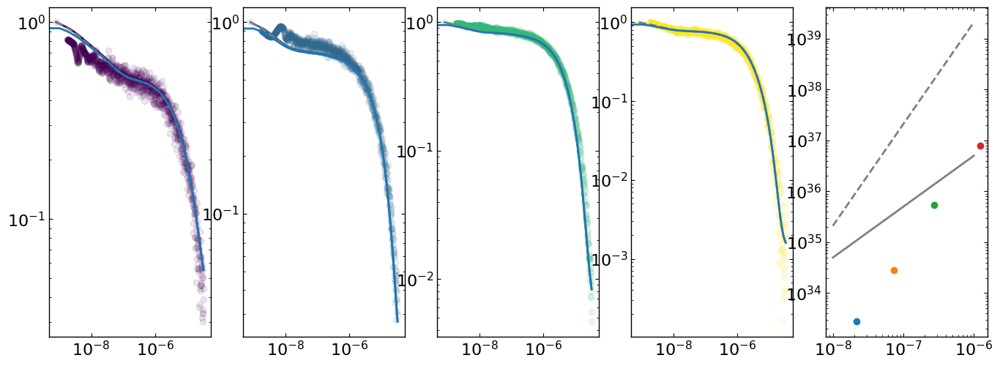

In [119]:
model = partial(DBTD_multi_trap, method='BDF', dimensionless=False, timeout=60, timeout_solve=60, use_jacobian = True)
RateEq.model = model
y_test = RateEq.run({},exp_format=exp_format)

parameters_rescaled = RateEq.params_rescale({}, RateEq.params)
parameters_rescaled

y_transformed, y_pred_transformed = transform_data(np.array(RateEq.y[0]),y_test, transform_type='normalized_log', do_G_frac_transform=True, X=np.array(RateEq.X[0]))
print(calc_metric(y_transformed, y_pred_transformed, metric_name='nrmse'))

X = np.array(RateEq.X[0])
viridis = plt.get_cmap('viridis', len(np.unique(X[:, 1])))

fig, ax = plt.subplots(1,5, figsize = (A4_width*2, A4_height/2))

ns = []
ps = []
nts_all = []
PL_pdep = []

for j, G in enumerate(np.unique(X[:, 1])):
    t = X[:, 0][X[:, 1] == G]
    ax[j].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_transformed[X[:, 1] == G],'o',color=viridis(j),alpha=0.1)
    ax[j].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_pred_transformed[X[:, 1] == G], color=viridis(j), linestyle='-', label=f'{G:.2f}')

    t = RateEq.X[0][RateEq.X[0][:,1] == G,0]
    tmax = 0.99999*1/RateEq.pump_args['fpu']
    t_span = t
    
    if t_span[-1] < tmax:
        dum = np.linspace(t[-1],tmax,100)
        dum = dum[1:]
        t_span = np.hstack((t,dum))

    parameters_rescaled = RateEq.params_rescale({}, RateEq.params)

    n,p, nts = DBTD_multi_trap(parameters_rescaled, t = t, t_span = t_span, Gpulse = np.ones_like(t_span), N0=RateEq.pump_args["N0"], G_frac = G, output_integrated_values=False, dimensionless=False)
    PL = np.trapezoid(n*p, axis = 1)
    ax[j].plot(t+8e-10, PL/np.amax(PL), color="grey", linestyle='--')


    #n,p, nts = DBTD_multi_trap(parameters_rescaled, t = t_span, t_span = t_span, Gpulse = np.ones_like(t_span), N0=RateEq.pump_args["N0"], G_frac = G, output_integrated_values=False, dimensionless=False, ConstantGen = 5.9e20, use_jacobian = False, equilibrate=False)
    n,p, nts = DBTD_multi_trap(parameters_rescaled, t = t, t_span = t_span, Gpulse = np.ones_like(t_span), N0=RateEq.pump_args["N0"], G_frac = G, output_integrated_values=False, dimensionless=False, equilibrate= True)
    ns.append(n)
    ps.append(p)
    nts_all.append(nts.T)
    L = 800e-9
    x = np.linspace(0, L, num = 100)
    PL = np.trapezoid(ns[j]*ps[j], x = x, axis = 1)
    ax[j].loglog(t, PL/np.amax(PL))
   
    ax[4].scatter(trPLs.TRPL_powers[j], PL[np.argmax(PL)])
    PL_pdep.append(PL[np.argmax(PL)])


powers = np.logspace(-8, -6)
ax[4].plot(powers, 0.21*(1e26*powers)**2, linestyle="--", color = "grey")
ax[4].plot(powers, 5*(1e42*powers), linestyle="-", color = "grey")

print("Simulated slope is ", np.polyfit(np.log(trPLs.TRPL_powers), np.log(np.array(PL_pdep)), deg = 1)[0])

for a in ax:
    a.set_yscale("log")
    a.set_xscale("log")

In [325]:
a = []

(a == [])

True

In [30]:
import optimpv_github.RateEqfits.RateEqModel as RateEqModel_module
importlib.reload(RateEqModel_module)

<module 'optimpv_github.RateEqfits.RateEqModel' from '/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/OptimPV-Github/optimPV/Notebooks/../optimpv_github/RateEqfits/RateEqModel.py'>

In [60]:
import importlib
import optimpv_github.RateEqfits.RateEqModel as RateEqModel_module
importlib.reload(RateEqModel_module)
DBTD_multi_trap = RateEqModel_module.DBTD_multi_trap
from collections import defaultdict
import matplotlib as mpl

class analyse_full_Run:
    def __init__(self, folderpath, samples_order, N_RUNS, traps_sel = None, pat = None):
        self.A4_width =  8.27
        self.A4_height = 11.69
        self.folderpath = folderpath
        self.samples_order = samples_order
        self.runs, self.E, self.P, self.best_runs_dict = self.import_runs_andreturnBests(folderpath, samples_order, N_RUNS, traps_sel=traps_sel, pat = pat)

        self.bestDecays_run = []

    def export_svg(self, fig, path, *,
               width_in, height_in,
               margin_mm=(22, 5, 5, 5),  # L, T, R, B in mm
               wspace=0.05, hspace=0.05):
        """
        Export fig to SVG with a fixed canvas size and physical margins.
        margin_mm = (left, top, right, bottom)
        """
        mm_per_in = 25.4
        L, T, R, B = [m / mm_per_in for m in margin_mm]  # inches
        fig.set_constrained_layout(False)
        fig.set_size_inches(width_in, height_in, forward=True)

        left   = L / width_in
        right  = 1 - (R / width_in)
        bottom = B / height_in
        top    = 1 - (T / height_in)

        fig.subplots_adjust(left=left, right=right, bottom=bottom, top=top, wspace=wspace, hspace=hspace)
        fig.canvas.draw()
        fig.savefig(path, format="svg", dpi =300)  # no bbox_inches="tight"
        
    def import_runs_andreturnBests(self, folderpath, samples, N_RUNS, traps_sel = None, pat = None):
        
        if (pat == None):
            pat = re.compile(
                r'^(?P<run>\d+)-(?P<sample>.+?)-(?P<ntraps>\d+)\s*(?:Traps|traps)-nrmse(?P<nrmse>\d+)-RateEqAgent\.pickle$',
                re.IGNORECASE
            )

        TRAP_KEYS = ["C_n", "C_p", "E_t_bulk", "N_t_bulk"]   # 4 per trap
        
        def get_params_list_todict(obj):
            param_list = obj.params
            return {d.name: d.value for d in param_list}

        def extract_trap_matrix(params, ntraps, trap_keys=TRAP_KEYS):
            """
            Returns shape (ntraps, 4): rows=trap index (0..ntraps-1), cols=trap_keys order.
            """
            M = np.empty((ntraps, len(trap_keys)), dtype=float)
            for t in range(1, ntraps + 1):
                for k, base in enumerate(trap_keys):
                    key = f"{base}_{t:d}"
                    M[t-1, k] = float(params[key])
            return M

        # 1) index all runs first
        
        result_files = [f for f in os.listdir(folderpath) if "RateEq" in f]
        runs = defaultdict(dict)  # run[(sample, ntraps)][run] = (nrmse, path)

        for fn in result_files:
            m = pat.match(fn)
            if not m:
                continue

            run    = int(m.group("run"))
            sample = m.group("sample")
            ntraps = int(m.group("ntraps"))
            nrmse  = int(m.group("nrmse")) / 10000

            path = os.path.join(folderpath, fn)
            with open(path, "rb") as f:
                RateEq = pickle.load(f)

            runs[(sample, ntraps)][run] = (nrmse, path, RateEq)
        # 2) axes
        self.trap_levels = sorted({t for (_, t) in runs.keys()})
        max_traps   = max(self.trap_levels)

        Ns, Nt = len(samples), len(self.trap_levels)

        # 3) allocate outputs
        E = np.full((Ns, Nt, N_RUNS), np.nan, dtype=float)                 # nrmse
        P = np.full((Ns, Nt, N_RUNS, max_traps, len(TRAP_KEYS)), np.nan)   # padded params

        # 4) fill
        for si, s in enumerate(samples):
            for tj, tlev in enumerate(self.trap_levels):
                for r in range(N_RUNS):
                    if r not in runs.get((s, tlev), {}):
                        print('Failed for', s, tlev, r)
                        continue
                
                    nrmse, path, RateEq = runs[(s, tlev)][r]
                    E[si, tj, r] = nrmse

                    with open(path, "rb") as f:
                        obj = pickle.load(f)
                    params = get_params_list_todict(obj)

                    trap_mat = extract_trap_matrix(params, ntraps=tlev)  # (tlev, 4)
                    P[si, tj, r, :tlev, :] = trap_mat

        best_run_list = {}

        for si, s in enumerate(samples):
            best_nrmse = float("inf")
            best = None

            # iterate over all (sample, n_traps) conditions that exist in `runs`
            for (s_i, n_tr), reps in runs.items():
                if s_i != s:
                    continue
                # if traps_sel is provided, only consider that trap level for this sample
                if traps_sel is not None and n_tr != traps_sel[si]:
                    continue
                for r_rep, (nrmse, path, RateEq) in reps.items():
                    if nrmse < best_nrmse:
                        best_nrmse = nrmse
                        best = (nrmse, path, RateEq, n_tr)
            if best is not None:
                best_run_list[s] = best

        return runs, E, P, best_run_list
    
    def plot_resultingFits(self, trPLs, leg = None, savepath = None, 
                                  margin_mm = None, wspace = 0.05, loc = "lower left"):
        fig, ax = plt.subplots(2, 4, figsize = (self.A4_width, self.A4_height/2))
        if (leg == None):
            leg = self.samples_order
        Fs = 1e9*1e-4*trPLs.fluences #nJ/cm2

        blues = plt.get_cmap("Blues", 4)
        reds = plt.get_cmap("Reds", 4)
        colors = [blues(1), blues(3), reds(1), reds(3)]
        colors_fits = ["black","grey", "black","grey"]

        bestruns = []

        for i, (c) in enumerate(self.samples_order):

            nrsme, path, RateEq, n_traps = self.best_runs_dict[c]

            exp_format = 'trPL' # experiment format
            model = partial(DBTD_multi_trap, method="BDF", dimensionless=True, timeout=90, timeout_solve=90)
            RateEq.model = model

            if (self.bestDecays_run == []):
                y_test = RateEq.run({},exp_format=exp_format)
                bestruns.append(y_test)
            else:
                y_test = self.bestDecays_run[i]

            y_transformed, y_pred_transformed = transform_data(np.array(RateEq.y[0]),y_test, transform_type='normalized_log', do_G_frac_transform=True, X=np.array(RateEq.X[0]))
            print(calc_metric(y_transformed, y_pred_transformed, metric_name='nrmse'))

            X = np.array(RateEq.X[0])
            for j, G in enumerate(np.unique(X[:, 1])):
                if (i<2):
                    if (i%2):
                        ax[0,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_transformed[X[:, 1] == G],'o',color=colors[i],alpha=0.05, label = leg[i])
                        ax[0,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_pred_transformed[X[:, 1] == G], color=colors_fits[i], linestyle='-', label=f'fit nrmse={100*nrsme:.2f}%')
                    else:
                        ax[0,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 1.5*(10**y_transformed[X[:, 1] == G]),'o',color=colors[i],alpha=0.05, label = leg[i])
                        ax[0,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 1.5*(10**y_pred_transformed[X[:, 1] == G]), color=colors_fits[i], linestyle='-', label=f'fit nrmse={100*nrsme:.2f}%')
                else:
                    if (i%2):
                        ax[1,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_transformed[X[:, 1] == G],'o',color=colors[i],alpha=0.05, label = leg[i])
                        ax[1,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_pred_transformed[X[:, 1] == G], color=colors_fits[i], linestyle='-', label=f'fit nrmse={100*nrsme:.2f}%')
                    else:
                        ax[1,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 1.5*(10**y_transformed[X[:, 1] == G]),'o',color=colors[i],alpha=0.05, label = leg[i])
                        ax[1,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 1.5*(10**y_pred_transformed[X[:, 1] == G]), color=colors_fits[i], linestyle='-', label=f'fit nrmse={100*nrsme:.2f}%')

        if (self.bestDecays_run == []):
            self.bestDecays_run = bestruns

        axisTicks_fontsize = 12
        legend_fontsize = 10
        for i, b in enumerate(ax):
            for j, (a, f) in enumerate(zip(b, Fs)):
                a.set_ylim([1e-3, 2])
                a.set_xlim([3e-10, 3e-5])
                a.set_xscale('log')
                a.set_yscale('log')

                if (i == 1):
                    a.set_xlabel('Time [s]')
                else:
                    a.tick_params(axis="x", labelbottom=False)
                if (j == 0):
                    a.set_ylabel(exp_format + ' shifted [a.u.]')
                    leg = a.legend(borderpad=0.25, labelspacing=0.0, handletextpad=0.5, loc = 'lower left', 
                            prop={'family': 'monospace', "size": legend_fontsize}, frameon=True, framealpha=1, handlelength=0.8,)
                    for h in leg.legend_handles:
                        if hasattr(h, "set_markerfacecoloralpha"):
                            h.set_markerfacecoloralpha(1.0)
                            h.set_markeredgecolor(h.get_color())
                            h.set_markersize(6)
                        else:
                            # fallback
                            h.set_alpha(1.0)
                            h.set_markersize(6)
                
                else:
                    a.tick_params(axis="y", labelleft=False)

                axisTicks_fontsize = 12
                if(i == 0):
                    a.set_title(f'F: {f:.2f}'+' nJ.cm$^{-2}$', size = 12)
                a.tick_params(axis='x', labelsize=axisTicks_fontsize)
                a.tick_params(axis='y', labelsize=axisTicks_fontsize)
                #a.minorticks_on()
                a.grid(visible = True, which = 'both', linestyle = '--')
                w_frame = 1.
                a.spines["bottom"].set_linewidth(w_frame)
                a.spines["top"].set_linewidth(w_frame)
                a.spines["left"].set_linewidth(w_frame)
                a.spines["right"].set_linewidth(w_frame)
        
        if not(savepath == None):
            if margin_mm == None:
                margin_mm = (20, 5, 5, 5)
            self.export_svg(fig, savepath, margin_mm = margin_mm, width_in = fig.get_figwidth(), height_in=fig.get_figheight(), wspace = wspace)#
        #export_svg(fig, "/media/qrb/0726-A615/LastVersion/Reviews/Graphs/Fig3_trPLfits_New.svg", margin_mm = (20, 6, 5, 5), width_in = fig.get_figwidth(), height_in=fig.get_figheight(), wspace=0.025)
    
    def run_paramVars(self, save_folderpath, num_points = 20):

        def range_params(RateEq_init, params_to_range, X, y, num_points = 10):
            fig, ax = plt.subplots(1,len(params_to_range), figsize =(len(params_to_range)*4, 5))

            nrmse_array = np.zeros((len(params_to_range), num_points))
            vals_array = np.zeros((len(params_to_range), num_points))

            for i, p in enumerate(params_to_range):
                RateEq = copy.deepcopy(RateEq_init)
                if (('E_t') in p.name):
                    low = p.bounds[0]
                    high = p.bounds[1]
                    if (p.value - 0.3 > low):
                        low = p.value - 0.3
                    if (p.value + 0.3 < high):
                        high = p.value + 0.3
                    vals = np.linspace(low, high, num =num_points)
                    ax[i].set_xscale('linear')
                    ax[i].set_yscale('log')
                else:
                    ax[i].set_xscale('log')
                    ax[i].set_yscale('log')
                    vals = p.value*np.logspace(-2, 2, num =num_points)
                
                print('Param variation:', p.name, 'Range:', vals[0], vals[-1])
                vals_array[i, :] = vals
                
                nrmses = np.zeros_like(vals)
                for p_R in RateEq.params:
                    if(p.name == p_R.name):
                        break
                
                print(p_R.name)
                for j, val in enumerate(vals):
                    p_R.value = val
                    exp_format = 'trPL' # experiment format
                    try:
                        y_test = RateEq.run({},exp_format=exp_format) # get the initial prediction with the original parameters
                        # Plot the data to be fitted and the initial guess
                        y_transformed, y_pred_transformed = transform_data(y,y_test, transform_type='normalized_log', do_G_frac_transform=True, X=X)
                        nrmses[j] = calc_metric(y_transformed, y_pred_transformed, metric_name="nrmse")
                        print('Calc', j, ' :', val, '; nrmse:', nrmses[j])
                        if (nrmses[j] > 2*nrmses[0]):
                            nrmses[j+1:] = np.nan
                            break

                    except KeyboardInterrupt:
                        print("KeyboardInterrupt — stopping loops.")
                        raise 

                    except Exception as e:
                        nrmses[j] = np.nan
                        print('Failed Calc', j, ' :', val, '; nrmse:', nrmses[j], '| error:', repr(e))   

                nrmse_array[i, :] = nrmses
                
                ax[i].plot(vals, nrmses)

            #for a in ax:
                
                #a.set_xlabel('Time [s]')
                #a.set_ylabel(exp_format + ' [a.u.]')
                #a.legend(title='Intensity fraction:')

            return nrmse_array, vals_array
            
        for i, (c) in enumerate(self.samples_order):
            nrsme, path, RateEq, n_traps = self.best_runs_dict[c]
            model = partial(DBTD_multi_trap, method="BDF", dimensionless=True, timeout=60, timeout_solve=60, use_jacobian = True)    
            RateEq.model = model
            pRange = RateEq.params[4:7+n_traps*4]

            try:
                nrmses, vals = range_params(RateEq, pRange, np.asarray(RateEq.X)[0], np.asarray(RateEq.y)[0], num_points=num_points)
                filepath = os.path.join(save_folderpath, f"nrmses_vals_{c}_{num_points}points.pickle")
                with open(filepath, "wb") as file:
                    pickle.dump([nrmses, vals], file)
            except Exception as e:
                print("Failed for", path, e)
                continue

    def import_paramVars_andPlot(self, folderpath, filenames_list, samplename_list, main_titles = None):
        
        def darken_hex(hex_color, factor=0.8):
            """
            factor < 1 makes it darker (e.g. 0.8 = 20% darker)
            factor > 1 makes it lighter
            """
            h = hex_color.lstrip("#")
            r, g, b = (int(h[i:i+2], 16) for i in (0, 2, 4))
            r = max(0, min(255, int(r * factor)))
            g = max(0, min(255, int(g * factor)))
            b = max(0, min(255, int(b * factor)))
            return f"#{r:02X}{g:02X}{b:02X}"
        
        def plot_for_two_comps(nrmses, vars, samplename_list, main_title = None):

            import matplotlib.ticker as mticker

            fig, ax = plt.subplots(3,3, figsize=(self.A4_width, self.A4_height))
            color = ["#009E73", "#CC79A7","#E69F00","#A42F54",]

            # replace the middle one with a spanning axis (optional)
            ax = ax.flatten()
            gone = ax[5]
            fig.delaxes(gone)
            ax = np.array([a for a in ax if a is not gone])
            print(len(ax))

            RateEq = self.best_runs_dict[samplename_list[0]][2]
            RateEq2 = self.best_runs_dict[samplename_list[1]][2]

            # Convert the indices to plot in the convenient order and factor to put everything in cm.
            idx = np.array(range(len(vars[0])))
            factors = np.ones_like(idx, dtype=np.float64)
            for i in range(int((len(vars[0])-3)/4)):
                if not(i):
                    idx[:3] = np.array([1,2,0])
                    factors[:3] = np.array([1e4, 1e4, 1e6])
                idx[4*i+3:4*i+7] = 4*i + np.array([3,6,4,5])
                factors[4*i+3:4*i+7] = np.array([1e-6, 1, 1e6, 1e6])
    
            for i, (vb, nb) in enumerate(zip(vars[0][idx], nrmses[0][idx])):
                print(RateEq.params[idx[i]+4].name)

                if (i<3):
                    ax[(i)].plot(factors[i]*vb, 100*nb, color="0.3")
                    ax[(i)].axvline(factors[i]*RateEq.params[idx[i]+4].value, color="0.3")
                    continue
                else:
                    ax[(i-3)%4 + 3].plot(factors[i]*vb, 100*nb, color=(color[int((i-3)/4)]))
                    ax[(i-3)%4 + 3].axvline(factors[i]*RateEq.params[idx[i]+4].value, color=(color[int((i-3)/4)]))

                if ((i-3)%4 == 2 and i > 2):
                    print(RateEq.params[idx[i]+4].name, RateEq.params[idx[i]+5].name)
                    print(RateEq2.params[idx[i]+4].name, RateEq2.params[idx[i]+5].name)
                    cns = vb
                    #cps = vars[0][idx[i]+1]
                    nb_cns = nb
                    #nb_cps = nrmses[0][idx[i]+1]
                    ax[7].axvline(RateEq.params[idx[i]+4].value/RateEq.params[idx[i]+5].value, color=(color[int((i-3)/4)]))
                    ax[7].plot(cns/RateEq.params[idx[i]+5].value, 100*(nb_cns), color=(color[int((i-3)/4)]))
                    #ax[4].plot(RateEq.params[i+4].value/cps, 10*(nb_cps), color=(color[int((i-3)/4)]), linestyle = "--")

            # Convert the indices to plot in the convenient order and factor to put everything in cm.
            idx = np.array(range(len(vars[1])))
            factors = np.ones_like(idx, dtype=np.float64)
            for i in range(int((len(vars[1])-3)/4)):
                if not(i):
                    idx[:3] = np.array([1,2,0])
                    factors[:3] = np.array([1e4, 1e4, 1e6])
                idx[4*i+3:4*i+7] = 4*i + np.array([3,6,4,5])
                factors[4*i+3:4*i+7] = np.array([1e-6, 1, 1e6, 1e6])
    
            for i, (va, na) in enumerate(zip(vars[1][idx], nrmses[1][idx])):
                if(i<3):
                    ax[(i)].plot(factors[i]*va, 100*na, color="0.3", linestyle = "--")
                    ax[(i)].axvline(factors[i]*RateEq2.params[idx[i]+4].value, color="0.3", linestyle = "--")
                    continue
                else:
                    ax[(i-3)%4 + 3].plot(factors[i]*va, 100*na, color=darken_hex(color[int((i-3)/4)], factor=0.7), linestyle = "--")
                    ax[(i-3)%4 + 3].axvline(factors[i]*RateEq2.params[idx[i]+4].value, color=darken_hex(color[int((i-3)/4)], factor=0.7), linestyle = "--")

                if ((i-3)%4 == 2 and i > 2):
                    print(RateEq.params[idx[i]+4].name, RateEq.params[idx[i]+5].name)
                    print(RateEq2.params[idx[i]+4].name, RateEq2.params[idx[i]+5].name)
                    cns = va
                    #cps = vars[1][idx[i]+1]
                    nb_cns = na
                    #nb_cps = nrmses[1][idx[i]+1]
                    ax[7].axvline(RateEq2.params[idx[i]+4].value/RateEq2.params[idx[i]+5].value, color=darken_hex(color[int((i-3)/4)], factor = 0.7), linestyle = "--")
                    ax[7].plot(cns/RateEq2.params[idx[i]+5].value, 100*(nb_cns), color=darken_hex(color[int((i-3)/4)], factor = 0.7), linestyle = "--")

                    # ax[5].axvline(RateEq2.params[i+4].value/RateEq2.params[i+5].value, color=darken_hex(color[int((i-3)/4)], factor = 0.7))
                    # ax[5].plot(cns/RateEq2.params[i+5].value, 10*(nb_cns), color=darken_hex(color[int((i-3)/4)], factor = 0.7))
                    # ax[5].plot(RateEq2.params[i+4].value/cps, 10*(nb_cps), color=darken_hex(color[int((i-3)/4)], factor = 0.7), linestyle = "--")

            ticks = 10*np.array([0.2, 0.3, 0.4, 0.6,1.0])
            x_labs = [r'$\mu_{n}$ [cm$^{2}/(V.s)]$', r'$\mu_{p}$ [cm$^{2}/(V.s)]$',  r'k$_{rad}$ [cm$^{3}$.s$^{-1}$]', r'N$_{t}$ [cm$^{-3}]$', r'E$_t$ [eV]', r'$\beta_n$ [cm$^{3}$.s$^{-1}$]', r'$\beta_p$ [cm$^{3}$.s$^{-1}$]', r'$\beta_n$/$\beta_p$']

            #Legends Custom
            from matplotlib.lines import Line2D
            handles = [
                Line2D([0], [0], color="grey", lw=2, ls="-",  label="Before"),
                Line2D([0], [0], color="grey", lw=2, ls="--", label="After"),
            ]
            leg = ax[0].legend(handles = handles, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'upper right', borderaxespad = 0.5, 
                                    prop={'family': 'monospace', "size": 11})
            handles = [
                Line2D([0], [0], color=color[0], lw=2, ls="-",  label="Trap 1"),
                Line2D([0], [0], color=color[1], lw=2, ls="-", label="Trap 2"),
            ]
            ax[4].legend(handles = handles, fontsize = 11, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'lower right', borderaxespad = 0.5, 
                            prop={'family': 'monospace', "size": 11})

            axisTicks_fontsize = 12
            for i, a in enumerate(ax):
                a.set_xlabel(x_labs[i], fontsize = axisTicks_fontsize)
                if not(i==4):
                    a.set_xscale("log")
                
                if (i == 0 or i == 3 or i == 5):
                    a.set_ylabel("NRMSE (%)", fontsize = axisTicks_fontsize)
                else:
                    #a.set_yticks([])
                    a.tick_params(axis="y", which="both", labelleft=False)
                
                a.set_yscale("log")    
                
                a.set_ylim([1.5, 10.0])
                
                a.set_yticks(ticks)
                a.yaxis.set_major_formatter(
                    mticker.FuncFormatter(lambda y, _: f"{y:.0f}")
                )
                a.yaxis.set_minor_formatter(mticker.NullFormatter())
            
            if not(main_title == None):
                fig.suptitle(main_title, size = axisTicks_fontsize, y=1.0)

            return fig, ax
        
        nrmses = []
        vars = []

        figs, axs = [], []
        for i, f in enumerate(filenames_list):
            path = os.path.join(folderpath, f)
            with open(path, "rb") as file:
                nrmse, var = pickle.load(file)
                nrmses.append(nrmse)
                vars.append(var)

            if not((i+1)%2):
                print("yea")
                if not(main_titles == None):
                    fig, ax = plot_for_two_comps(nrmses[(i-1):(i+1)], vars[(i-1):(i+1)], samplename_list[(i-1):(i+1)], main_titles[int(i/2)])
                else:
                    fig, ax = plot_for_two_comps(nrmses[(i-1):(i+1)], vars[(i-1):(i+1)], samplename_list[(i-1):(i+1)])

                figs.append(fig)
                axs.append(ax)

        return figs, axs 

    def plot_statistics_fromallruns(self, labels = None, ylim = None, savepath = None, margin_mm = None):
        fig,ax = plt.subplots(1,4, figsize = (self.A4_width, self.A4_height/4))

        axisTicks_fontsize = 12
        for si, s in enumerate(self.samples_order):
            if (labels == None):
                ax[si].set_title(s, size=axisTicks_fontsize)
            else:
                ax[si].set_title(labels[si], size=axisTicks_fontsize)

            

            for tj, tlev in enumerate(self.trap_levels):
                e = 100*self.E[si, tj, ~np.isnan(self.E[si, tj, :])]
                ax[si].boxplot(e, positions = [tj+1])
                ax[si].scatter((tj+1)*np.ones_like(e), e)

        for i, a in enumerate(ax):
            axisTicks_fontsize = 12
            legend_fontsize = 10

            a.tick_params(axis='x', labelsize=axisTicks_fontsize)
            a.tick_params(axis='y', labelsize=axisTicks_fontsize)

            a.grid(visible = True, which = 'both',axis = 'y', linestyle = '--')
            # a.set_xticklabels([])
            # a.set_xticks([])
            a.set_yscale("linear")

            if not(ylim == None):
                a.set_ylim(ylim)
            
            #a.set_yticks(a.get_yticks()[::2]) 
            a.set_xlabel(r"Number of Traps", size=axisTicks_fontsize)
            if not(i):
                a.set_ylabel(r"Fit NRMSE (%)", size=axisTicks_fontsize)
            else:
                a.set_yticklabels([])

            w_frame = 1.2
            a.spines["bottom"].set_linewidth(w_frame)
            a.spines["top"].set_linewidth(w_frame)
            a.spines["left"].set_linewidth(w_frame)
            a.spines["right"].set_linewidth(w_frame)

            a.set_axisbelow(True)

        if not(savepath == None):
            if margin_mm == None:
                margin_mm = (20, 5, 5, 5)
            self.export_svg(fig, savepath, margin_mm = margin_mm, width_in = fig.get_figwidth(), height_in=fig.get_figheight())#
    
    def calc_densities_fromParams(self, steadyStateG = None, labels = None, plot = True, G = 1.0, Auger = None, savepath = None, 
                                  margin_mm = None, xlim = [8e-10, 1e-2], ylim = [1e14, 2e23], wspace = 0.05, loc = "lower left", cmap_name="RdBu_r"):
        
        ns = []
        ps = []
        QFLSs = []
        nts_all = []
        params = []
        if (plot):
            fig, ax = plt.subplots(1,4, figsize = (self.A4_width, self.A4_height/2))

        for i, (c) in enumerate(self.samples_order):

            nrsme, path, RateEq, n_traps = self.best_runs_dict[c]
            model = partial(DBTD_multi_trap, method="BDF", dimensionless=True, timeout=120, timeout_solve=120)
            RateEq.model = model

            parameters_rescaled = RateEq.params_rescale({}, RateEq.params)
                
            t_span = np.logspace(-9,0, num = 1000)

            if (steadyStateG == None):
                if not (Auger == None):
                    parameters_rescaled["C_auger"] = Auger
                n,p, nts = DBTD_multi_trap(parameters_rescaled, t = t_span, t_span = t_span, Gpulse = np.ones_like(t_span), N0=RateEq.pump_args["N0"], G_frac = G, output_integrated_values=False, dimensionless=False, use_jacobian = True, equilibrate= False)
            else:
                n,p, nts = DBTD_multi_trap(parameters_rescaled, t = t_span, t_span = t_span, Gpulse = np.ones_like(t_span), N0=RateEq.pump_args["N0"], G_frac = G, output_integrated_values=False, dimensionless=False, ConstantGen = steadyStateG, use_jacobian = False, equilibrate=False)
            
            ns.append(n)
            ps.append(p)
            nts_all.append(nts.T)
            params.append(parameters_rescaled)
            
            L = parameters_rescaled["L"]
            x = np.linspace(0, L, num = 100)
            Nc = Nv = parameters_rescaled["N_cv"]
            kT = 0.0257
            Eg = parameters_rescaled["Eg"] #FAPI
            ni2 = Nc*Nv*np.exp(-Eg/kT)

            if (plot):
                nav = np.trapezoid(ns[i], x = x, axis =1)/L
                pav = np.trapezoid(ps[i], x = x, axis =1)/L
                PL = np.trapezoid(ns[i]*ps[i], x = x, axis =1)
                ax[i].loglog(t_span, np.amax(1e-6*nav)*PL/np.amax(PL), label = "PL", color = "0.1", linestyle = "--")
                ax[i].loglog(t_span, 1e-6*nav, label = "n")
                ax[i].loglog(t_span, 1e-6*pav, label = "p")

                for j, nt in enumerate(nts_all[i]):
                    ax[i].loglog(t_span, 1e-6*np.trapezoid(nt, x = x, axis =0)/L, label = f"nt_{j+1:d}")

            n_av = np.trapezoid(n[-1], x = x)/L
            p_av = np.trapezoid(p[-1], x = x)/L
            qfls = kT*np.log(n_av*p_av/ni2)
            QFLSs.append(qfls)

        self.ns = ns
        self.ps = ps
        self.QFLSs = QFLSs
        self.nts_all = nts_all
        self.params = params

        def cncp_from_params(params):
            # find all indices that have BOTH C_n_i and C_p_i
            idxs = []
            for k in params.keys():
                m = re.fullmatch(r"C_n_(\d+)", k)
                if m and (f"C_p_{m.group(1)}" in params):
                    idxs.append(int(m.group(1)))
            idxs = sorted(idxs)

            cncp = np.array([params[f"C_n_{i}"] / params[f"C_p_{i}"] for i in idxs], dtype=float)
            return cncp, idxs  # idxs are 1-based trap IDs from your params

        def build_global_cncp_norm(params_list):
            all_vals = []
            for p in params_list:
                cncp, _ = cncp_from_params(p)
                all_vals.append(cncp)

            all_cncp = np.concatenate(all_vals) if all_vals else np.array([], dtype=float)
            all_cncp = all_cncp[all_cncp > 0]

            log_all = np.log10(all_cncp)
            L = np.nanmax(np.abs(log_all))
            return mpl.colors.TwoSlopeNorm(vmin=-L, vcenter=0.0, vmax=L)  # center at log10=0 => ratio=1

        def cncp_to_colors(cncp, norm, cmap_name="RdBu_r"):
            cmap = plt.get_cmap(cmap_name)
            log_cncp = np.log10(np.asarray(cncp, dtype=float))
            return cmap(norm(log_cncp))
                
        def get_cncp(params, n_traps): 
            r = np.empty(n_traps, dtype=float) 
            for k in range(n_traps): 
                r[k] = params[f"C_n_{k+1}"] / params[f"C_p_{k+1}"]
                
            return r 

        if (plot):        
            norm = build_global_cncp_norm(self.params)
            axisTicks_fontsize = 12
            for i, (a) in enumerate(ax):
                n_traps = int(len(list(self.params[i].keys())[7:-1])/4)
                cncp = get_cncp(self.params[i], n_traps)
                colors = cncp_to_colors(cncp, norm, cmap_name=cmap_name)
                lines = a.get_lines()  # list of Line2D in this Axes
                for line, c in zip(lines[-2:], colors):
                    line.set_color(c)

                if not(labels == None):
                    a.set_title(labels[i])
                else:
                    a.set_title(self.samples_order[i])
                a.set_ylim(ylim)
                a.set_xlim(xlim)
                a.set_xscale('log')
                a.set_yscale('log')
                #a.set_xticks([1e-9, 1e-8, 1e-7, 1e-6, 1e-5])
                a.set_xlabel('Time [s]')
                if (i == 0):
                    a.set_ylabel('Carrier Densities [cm$^{-3}$]')
                elif not(ylim == None):
                    a.set_yticklabels([])
                
                leg = a.legend(borderpad=0.25, labelspacing=0.0, handletextpad=0.5, loc = loc, 
                    prop={'family': 'monospace', "size": 11}, frameon=True, framealpha=1, handlelength=0.8,)
                
                if (i == 3):
                    sm = mpl.cm.ScalarMappable(norm=norm, cmap=plt.get_cmap(cmap_name))
                    sm.set_array([])
                    cbar = plt.colorbar(sm, ax=ax)
                    cbar.set_label(r'log$_{10}$($\beta_n$/$\beta_p$)', fontsize=axisTicks_fontsize)
                    cbar.ax.tick_params(labelsize=axisTicks_fontsize)
                # leg.get_title().set_ha("left")
                # leg._legend_box.align = "left"
                
                #a.set_title(f'F: {f:.2f}'+' nJ.cm$^{-2}$', size = 12)
                a.tick_params(axis='x', labelsize=axisTicks_fontsize)
                a.tick_params(axis='y', labelsize=axisTicks_fontsize)
                #a.minorticks_on()
                a.grid(visible = True, which = 'both', linestyle = '--')
                w_frame = 1.
                a.spines["bottom"].set_linewidth(w_frame)
                a.spines["top"].set_linewidth(w_frame)
                a.spines["left"].set_linewidth(w_frame)
                a.spines["right"].set_linewidth(w_frame)

                fig.tight_layout(pad=0., w_pad=0., h_pad=0.)

            if not(savepath == None):
                if margin_mm == None:
                    margin_mm = (20, 5, 5, 5)
                self.export_svg(fig, savepath, margin_mm = margin_mm, width_in = fig.get_figwidth(), height_in=fig.get_figheight(), wspace = wspace)#
    
    def plot_rates(self, which_arg = None, cmap_name = "viridis"):

        fig, ax = plt.subplots(1,2, figsize = (self.A4_width*2, self.A4_width))

        import matplotlib as mpl
        def cncp_from_params(params):
            # find all indices that have BOTH C_n_i and C_p_i
            idxs = []
            for k in params.keys():
                m = re.fullmatch(r"C_n_(\d+)", k)
                if m and (f"C_p_{m.group(1)}" in params):
                    idxs.append(int(m.group(1)))
            idxs = sorted(idxs)

            cncp = np.array([params[f"C_n_{i}"] / params[f"C_p_{i}"] for i in idxs], dtype=float)
            return cncp, idxs  # idxs are 1-based trap IDs from your params

        def build_global_cncp_norm(params_list):
            all_vals = []
            for p in params_list:
                cncp, _ = cncp_from_params(p)
                all_vals.append(cncp)

            all_cncp = np.concatenate(all_vals) if all_vals else np.array([], dtype=float)
            all_cncp = all_cncp[all_cncp > 0]

            log_all = np.log10(all_cncp)
            L = np.nanmax(np.abs(log_all))
            return mpl.colors.TwoSlopeNorm(vmin=-L, vcenter=0.0, vmax=L)  # center at log10=0 => ratio=1

        def cncp_to_colors(cncp, norm, cmap_name="RdBu_r"):
            cmap = plt.get_cmap(cmap_name)
            log_cncp = np.log10(np.asarray(cncp, dtype=float))
            return cmap(norm(log_cncp))
                
        def get_cncp(params, n_traps): 
            r = np.empty(n_traps, dtype=float) 
            for k in range(n_traps): 
                r[k] = params[f"C_n_{k+1}"] / params[f"C_p_{k+1}"]
            return r 
        
        def get_et(params, n_traps): 
            r = np.empty(n_traps, dtype=float) 
            for k in range(n_traps): 
                r[k] = params[f"E_t_bulk_{k+1}"]
            return r 
        
        def get_nt(params, n_traps): 
            r = np.empty(n_traps, dtype=float) 
            for k in range(n_traps): 
                r[k] = params[f"N_t_bulk_{k+1}"]
            return r 

                
        norm = build_global_cncp_norm(self.params)
        #norm = build_global_cncp_norm(self.params)

        all_rates = []
        all_colors = []
        all_cncp = []
        all_Ets = []
        all_Nts = []

        for i, (n, p, nts, param) in enumerate(zip(self.ns, self.ps, self.nts_all, self.params)):

            if not(which_arg == None):
                arg = which_arg
            else:
                arg = -1

            L = param["L"]
            x = np.linspace(0, L, num = 100)
            Nc = Nv = param["N_cv"]
            kT = 0.0257
            Eg = param["Eg"] #FAPI
            ni2 = Nc*Nv*np.exp(-Eg/kT)

            n_ave = np.trapezoid(n, x = x, axis =1)/L
            p_ave = np.trapezoid(p, x = x, axis =1)/L
            nts_ave = np.trapezoid(nts, x = x, axis =1)/L

            n_end = n_ave[arg] 
            p_end = p_ave[arg] 
            nts_end = nts_ave[:, arg]

            ncaps_end = np.zeros_like(nts_end)
            nemis_end = np.zeros_like(nts_end)
            pcaps_end = np.zeros_like(nts_end)
            pemis_end = np.zeros_like(nts_end)
            for j, nt_end in enumerate(nts_end):
                ncaps_end[j] = param[f'C_n_{j+1:d}']* n_end * (param[f'N_t_bulk_{j+1:d}'] - nt_end)
                pcaps_end[j] = param[f'C_p_{j+1:d}']* p_end * nt_end

                nemis_end[j] = param[f'C_n_{j+1:d}']* nt_end * Nc * np.exp(-(Eg - param[f'E_t_bulk_{j+1:d}'])/kT)
                pemis_end[j] = param[f'C_p_{j+1:d}']* (param[f'N_t_bulk_{j+1:d}'] - nt_end) * Nv * np.exp(-(param[f'E_t_bulk_{j+1:d}'])/kT)

            
            def plot_stacked(ax, xpos, array, labels = None, color = None):
                if color is None:
                    color = ["#009E73", "#CC79A7","#E69F00","#A42F54",]
                ax.bar(xpos, np.sum(array), label="Total", color = "Grey")

                if labels is None:
                    labels = np.zeros_like(array)
                for j, (y, lab) in enumerate(zip(array, labels)):
                    if (lab):
                        ax.bar(xpos+0.1*(1+j), y, label=lab, color = color[j])
                    else:   
                        ax.bar(xpos+0.1*(1+j), y, color = color[j])
        
            legend = np.array([f"Trap {i+1} Cn/Cp: {param[f'C_n_{i+1:d}']/param[f'C_p_{i+1:d}']:.2e}" for i in range(len(nts_ave))])


            n_traps = len(nts_ave)  # or whatever defines # traps
            cncp = get_cncp(param, n_traps)
            colors = cncp_to_colors(cncp, norm, cmap_name=cmap_name)

            legend = np.array([f"Trap {k+1} Cn/Cp: {cncp[k]:.2e}" for k in range(n_traps)])

            vals = np.minimum(ncaps_end, pcaps_end)  # whatever corresponds to this i
            order = np.argsort(cncp)

            plot_stacked(ax[0], 0+3*i, vals, legend, color=colors)
            plot_stacked(ax[1], 0+3*i, vals[order], legend[order], color=colors[order])

            all_rates.append(vals)
            all_colors.append(colors)
            all_cncp.append(cncp)
            all_Ets.append(get_et(param, n_traps))
            all_Nts.append(get_nt(param, n_traps))
            # plot_stacked(ax[0], 0+3*i, (ncaps_end), legend)
            # #plot_stacked(ax[0], 1.5, nemis_end, legend)
            # plot_stacked(ax[0], 1.5+3*i, (pcaps_end))
            #plot_stacked(ax, 5, pemis_end)
            # plot_stacked(ax[0], 0+3*i, np.minimum(ncaps_end,pcaps_end), legend)
            # plot_stacked(ax[1], 1+3*i, reorder_wCaptureRates(np.minimum(ncaps_end, pcaps_end), param), reorder_wCaptureRates(legend, param))#reorder_wCaptureRates(np.array(["blue", "green", "orange"]), param))

        leg = ax[1].legend(borderpad=0.25, labelspacing=0.0, handletextpad=0, loc = 'lower right', 
                        prop={'family': 'monospace', "size": 11}, frameon=True, framealpha=1)
        for h in leg.legend_handles:
            try:
                h.set_height(8)   # points (works for Patch-like handles)
                h.set_width(15)
            except Exception:
                pass

        leg = ax[0].legend(borderpad=0.25, labelspacing=0.0, handletextpad=0, loc = 'lower right', 
                        prop={'family': 'monospace', "size": 11}, frameon=True, framealpha=1)
        for h in leg.legend_handles:
            try:
                h.set_height(8)   # points (works for Patch-like handles)
                h.set_width(15)
            except Exception:
                pass

        sm = mpl.cm.ScalarMappable(norm=norm, cmap=mpl.cm.get_cmap(cmap_name))
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax, label="Cn/Cp (centered at 1)")

        axisTicks_fontsize = 12
        for a in ax:
            a.set_axisbelow(True)
            a.set_yscale("log")
            a.tick_params(axis='x', labelsize=axisTicks_fontsize)
            a.tick_params(axis='y', labelsize=axisTicks_fontsize)
            a.grid(visible = True, which = 'both', linestyle = '--')

            a.set_ylabel(r"Capture Rates [m$^{-3}.s^{-1}$]", size=axisTicks_fontsize)

            w_frame = 1.2
            a.spines["bottom"].set_linewidth(w_frame)
            a.spines["top"].set_linewidth(w_frame)
            a.spines["left"].set_linewidth(w_frame)
            a.spines["right"].set_linewidth(w_frame)

        self.all_rates = all_rates
        self.all_cncp = all_cncp
        self.all_Ets = all_Ets
        
        return all_rates, all_cncp, all_Ets, all_Nts ,all_colors, norm

    def compare_trap_partition(self, trPLs, savepath = None, leg = None, 
                                  margin_mm = None, wspace = 0.05, loc = "lower left"):

        def get_cncp(params, n_traps): 
            r = np.empty(n_traps, dtype=float) 
            for k in range(n_traps): 
                r[k] = params[f"C_n_{k+1}"] / params[f"C_p_{k+1}"]
            return r 
         
        fig, ax = plt.subplots(4, 4, figsize = (self.A4_width, self.A4_height))
        nrmses_partitions = []
        RateEq_partitions = []
        taudiff_partitions = []
        densities_partitions = []

        taudiff_best = []
        densities_best = []
        for i, (c) in enumerate(self.samples_order):

            nrmse, path, RateEq, n_traps = self.best_runs_dict[c]
            exp_format = 'trPL' # experiment format
            model = partial(DBTD_multi_trap, method="BDF", dimensionless=True, timeout=90, timeout_solve=90)
            RateEq.model = model
            
            Fs = 1e9*trPLs.fluences*1e-4 #nJ/cm2

            blues = plt.get_cmap("Blues", 4)
            reds = plt.get_cmap("Reds", 4)
            colors = [blues(1), blues(3), reds(1), reds(3)]
            colors_fits = ["black","grey", "black","grey"]

            y_test = RateEq.run({},exp_format=exp_format)
            y_transformed, y_pred_transformed = transform_data(np.array(RateEq.y[0]),y_test, transform_type='normalized_log', do_G_frac_transform=True, X=np.array(RateEq.X[0]))
            print("Test", nrmse, calc_metric(y_transformed, y_pred_transformed, metric_name='nrmse'))
            calc_nrmse = calc_metric(y_transformed, y_pred_transformed, metric_name='nrmse')

            X = np.array(RateEq.X[0])

            ax = ax.flatten()
            l_max = (X[:, 0][X[:, 1] == np.unique(X[:, 1])[0]].shape[0]-1)
            taudiffs = np.full((len(Fs)*l_max,), np.nan)
            densities = np.full((len(Fs)*l_max,), np.nan)
            for j, G in enumerate(np.unique(X[:, 1])):    
                ax[j+4*i].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_transformed[X[:, 1] == G],'o',color=colors[i],alpha=0.05)
                ax[j+4*i].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_pred_transformed[X[:, 1] == G], color=colors_fits[i], linestyle='-', label=f'fit nrmse={100*calc_nrmse:.2f}%')

                fitPL = 10**y_pred_transformed[X[:, 1] == G]
                t = X[:, 0][X[:, 1] == G]
                sqrt_np = trPLs.n0s[j]*np.sqrt(fitPL[fitPL>1e-3])
                taudiff = -2*(np.diff(t[fitPL>1e-3])/np.diff(np.log(fitPL[fitPL>1e-3])))

                taudiffs[j*l_max:(j*l_max+len(taudiff))] = taudiff
                densities[j*l_max:(j*l_max+len(taudiff))] = sqrt_np[:-1]

            #fill the best taudiffs
            taudiff_best.append(taudiffs)
            densities_best.append(densities)

            print(n_traps)
            nrmses_test = np.zeros((n_traps,))
            cn_cps = get_cncp(self.params[i], n_traps)
            mask = np.log10(cn_cps) < 0
            cn_cps[mask] = 1/cn_cps[mask]
            RateEqs = []
            
            l_max = (X[:, 0][X[:, 1] == G].shape[0]-1)
            taudiffs = np.full((len(Fs)*l_max, n_traps), np.nan)
            densities = np.full((len(Fs)*l_max, n_traps), np.nan)
            for ntr in range(n_traps):
                RateEqCopy = copy.deepcopy(RateEq)
                for ntr2 in range(n_traps):
                    if (ntr2 == ntr):
                        print("Setting all traps except:", RateEqCopy.params[7+4*ntr].name)
                        continue
                    RateEqCopy.params[7+4*ntr].value = 1

                RateEqs.append(RateEqCopy)
                y_test = RateEqCopy.run({},exp_format=exp_format)

                y_transformed, y_pred_transformed = transform_data(np.array(RateEqCopy.y[0]),y_test, transform_type='normalized_log', do_G_frac_transform=True, X=np.array(RateEqCopy.X[0]))
                print(calc_metric(y_transformed, y_pred_transformed, metric_name='nrmse'))

                nrmses_test[ntr] = calc_metric(y_transformed, y_pred_transformed, metric_name='nrmse')
                X = np.array(RateEqCopy.X[0])
                ax = ax.flatten()
                
                for j, G in enumerate(np.unique(X[:, 1])):    
                    ax[j+i*4].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_pred_transformed[X[:, 1] == G], linestyle='--', label=f'ratio {cn_cps[ntr]:.0e}'+f'nrmse={100*nrmses_test[ntr]:.2f}%')

                    fitPL = 10**y_pred_transformed[X[:, 1] == G]
                    t = X[:, 0][X[:, 1] == G]
                    sqrt_np = trPLs.n0s[j]*np.sqrt(fitPL[fitPL>1e-3])
                    taudiff = -2*(np.diff(t[fitPL>1e-3])/np.diff(np.log(fitPL[fitPL>1e-3])))

                    taudiffs[j*l_max:(j*l_max+len(taudiff)), ntr] = taudiff
                    densities[j*l_max:(j*l_max+len(taudiff)), ntr] = sqrt_np[:-1]

            nrmses_partitions.append(nrmses_test)
            RateEq_partitions.append(RateEqs)
            taudiff_partitions.append(taudiffs)
            densities_partitions.append(densities)

        axisTicks_fontsize = 12
        legend_fontsize = 10
        for i, a in enumerate(ax):
            a.set_ylim([1e-3, 2])
            a.set_xlim([3e-10, 3e-5])
            a.set_xscale('log')
            a.set_yscale('log')  

            if (int(i/4) == 3):
                a.set_xlabel('Time [s]')
            else:
                a.tick_params(axis="x", labelbottom=False)
            
            if not(i%4):
                a.set_ylabel('trPL  [a.u.]')
                leg = a.legend(borderpad=0.25, labelspacing=0.0, handletextpad=0.5, loc = loc, 
                        prop={'family': 'monospace', "size": legend_fontsize}, frameon=True, framealpha=1, handlelength=0.8,)
                for h in leg.legend_handles:
                    if hasattr(h, "set_markerfacecoloralpha"):
                        h.set_markerfacecoloralpha(1.0)
                        h.set_markeredgecolor(h.get_color())
                        h.set_markersize(6)
                    else:
                        # fallback
                        h.set_alpha(1.0)
                        h.set_markersize(6)
            else:
                a.tick_params(axis="y", labelleft=False)

            if(i < 4):
                a.set_title(f'F: {Fs[i]:.2f}'+' nJ.cm$^{-2}$', size = 12)
            a.tick_params(axis='x', labelsize=axisTicks_fontsize)
            a.tick_params(axis='y', labelsize=axisTicks_fontsize)
            #a.minorticks_on()
            a.grid(visible = True, which = 'both', linestyle = '--')
            w_frame = 1.
            a.spines["bottom"].set_linewidth(w_frame)
            a.spines["top"].set_linewidth(w_frame)
            a.spines["left"].set_linewidth(w_frame)
            a.spines["right"].set_linewidth(w_frame)
        
        #save all for further plotting
        self.nrmses_partitions = nrmses_partitions
        self.RateEq_partitions = RateEq_partitions
        self.taudiff_partitions = taudiff_partitions
        self.densities_partitions = densities_partitions
        self.densities_best = densities_best
        self.taudiff_best = taudiff_best
        
        if not(savepath == None):
            if margin_mm == None:
                margin_mm = (20, 5, 5, 5)
            self.export_svg(fig, savepath, margin_mm = margin_mm, width_in = fig.get_figwidth(), height_in=fig.get_figheight(), wspace = wspace)#



In [238]:
analysis_run.best_runs_dict["2Q3After"][2].params

[{'name': 'Eg', 'type': 'fixed', 'value_type': 'float', 'value': 1.553, 'bounds': [0.5, 2.0], 'values': None, 'start_value': 1.553, 'log_scale': False, 'fscale': 1, 'stepsize': None, 'rescale': True, 'display_name': '$E_g$', 'unit': 'eV', 'full_name': '$E_g$ [eV]', 'axis_type': 'linear', 'std': None, 'encoding': None, 'is_ordered': False, 'is_sorted': False, 'force_log': False},
 {'name': 'L', 'type': 'fixed', 'value_type': 'float', 'value': 8e-07, 'bounds': [4e-07, 1e-06], 'values': None, 'start_value': 8e-07, 'log_scale': True, 'fscale': 1, 'stepsize': None, 'rescale': True, 'display_name': '$L$', 'unit': 'm', 'full_name': '$L$ [m]', 'axis_type': 'linear', 'std': None, 'encoding': None, 'is_ordered': False, 'is_sorted': False, 'force_log': True},
 {'name': 'alpha', 'type': 'fixed', 'value_type': 'float', 'value': 3630000.0, 'bounds': [1000000.0, 100000000.0], 'values': None, 'start_value': 3630000.0, 'log_scale': True, 'fscale': 1, 'stepsize': None, 'rescale': True, 'display_name': '

4
Setting all traps except: N_t_bulk_1
0.027618824584826136
Setting all traps except: N_t_bulk_2
0.07160578918330791
Setting all traps except: N_t_bulk_3
0.018376060241059616
Setting all traps except: N_t_bulk_4
0.05603134944874322
4
Setting all traps except: N_t_bulk_1
0.03236009044938867
Setting all traps except: N_t_bulk_2
0.03263025834499442
Setting all traps except: N_t_bulk_3
0.10651206048539488
Setting all traps except: N_t_bulk_4
0.05307939855219781
3
Setting all traps except: N_t_bulk_1
0.04768393671655412
Setting all traps except: N_t_bulk_2
0.2215628793861946
Setting all traps except: N_t_bulk_3
0.02262521095012938
5
Setting all traps except: N_t_bulk_1
0.02073450238901463
Setting all traps except: N_t_bulk_2
0.060345387429853195
Setting all traps except: N_t_bulk_3
0.03496464810609403
Setting all traps except: N_t_bulk_4
0.020716694565878067
Setting all traps except: N_t_bulk_5
0.048818605653962815


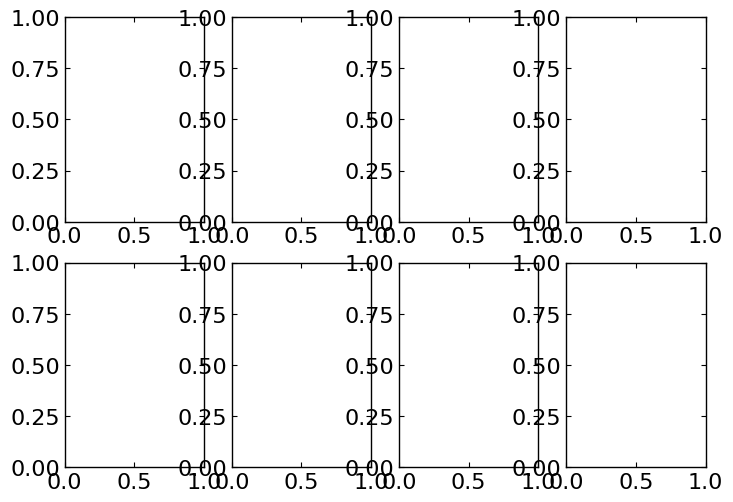

In [240]:
condition = [r"2Q3Before", r"2Q3After", r"3Q2Before", r"3Q2After"]
labels = ["HQ As. Deposited", "HQ After 21H Irr.", "LQ As. Deposited", "LQ After 21H Irr."]
folderpath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope"
analysis_run = analyse_full_Run(folderpath, condition, N_RUNS=5, traps_sel=None)

analysis_run.compare_trap_partition()

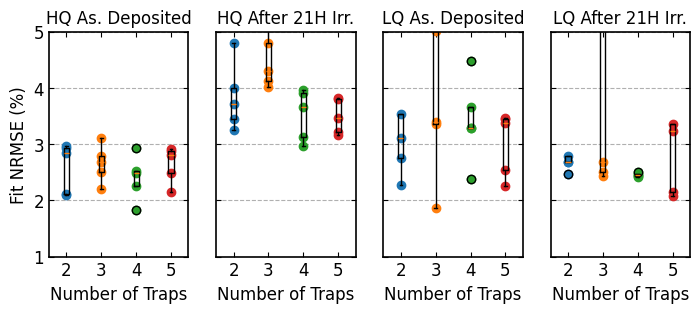

In [ ]:
condition = [r"2Q3Before", r"2Q3After", r"3Q2Before", r"3Q2After"]
labels = ["HQ As. Deposited", "HQ After 21h Irr.", "LQ As. Deposited", "LQ After 21h Irr."]
folderpath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope"
analysis_run = analyse_full_Run(folderpath, condition, N_RUNS=5, traps_sel=None)
analysis_run.plot_statistics_fromallruns(labels = labels)

/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/00-2Q3Before-4traps-nrmse00182-RateEqAgent.pickle
Constant Gen, setting dimensionless to False


/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/02-2Q3After-4traps-nrmse00296-RateEqAgent.pickle
{'Eg': 1.553, 'L': 8e-07, 'alpha': 3630000.0, 'N_cv': 2e+24, 'k_direct': 1.5280388045516215e-17, 'mu_n': 1.0177070068156339e-06, 'mu_p': 1.0099908395883368e-06, 'N_t_bulk_1': 3.1173570252152406e+22, 'C_n_1': 2.0025917302215002e-20, 'C_p_1': 2.8182220404591866e-17, 'E_t_bulk_1': np.float64(0.8250531452492583), 'N_t_bulk_2': 7.530707643054786e+24, 'C_n_2': 8.297441755580666e-21, 'C_p_2': 3.876940253063518e-18, 'E_t_bulk_2': np.float64(0.9584756785556484), 'N_t_bulk_3': 2.353125181156739e+22, 'C_n_3': 5.1369386177966525e-17, 'C_p_3': 1.0232912267373079e-17, 'E_t_bulk_3': np.float64(1.2141055226579893), 'N_t_bulk_4': 1.2622079411534281e+20, 'C_n_4': 9.939108177485503e-13, 'C_p_4': 5.668029195222668e-20, 'E_t_bulk_4': np.float64(1.2645171512045166), 'I_factor_PL': 1.275e-22}
Constant Gen, setting dimensionless to False
/home

/tmp/ipykernel_480/872499601.py:852: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



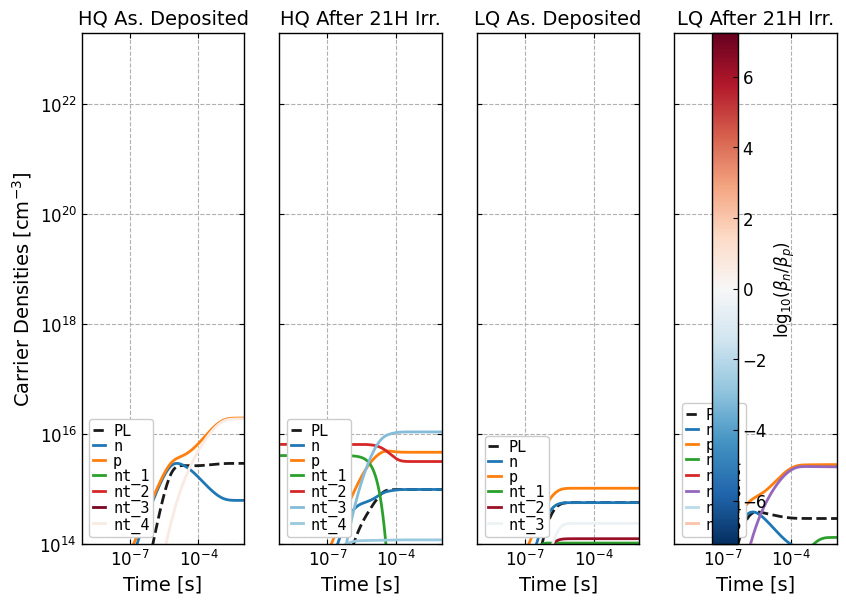

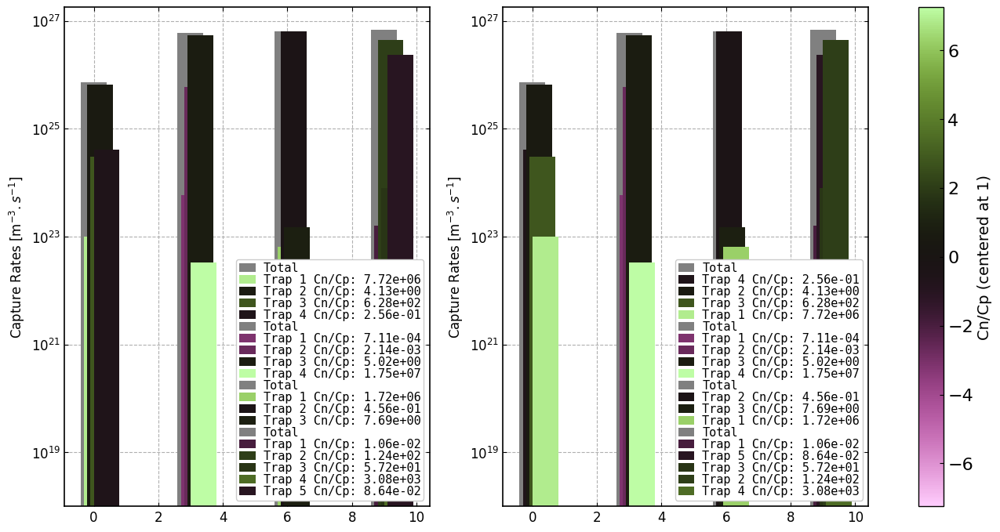

In [ ]:

analysis_run.calc_densities_fromParams(G = 1.0, labels = labels, steadyStateG=5.9e20,)
rates, cn_cps, Ets, colors, norm = analysis_run.plot_rates(cmap_name="vanimo")

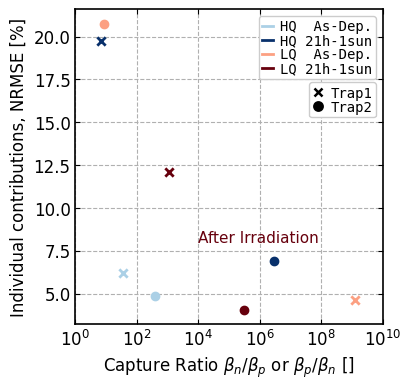

In [ ]:
# fig = plt.figure()
# ax = fig.add_subplot(projection='3d')
from matplotlib.lines import Line2D

fig, ax = plt.subplots(1,1, figsize = (A4_width*0.5, A4_height/3))

labels = ['HQ  As-Dep.', 'HQ 21h-1sun', 'LQ  As-Dep.', 'LQ 21h-1sun']
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgba
plt.rcParams["svg.fonttype"] = "none"
mpl.rcParams["hatch.linewidth"] = 0.5

blues = plt.get_cmap("Blues", 4)
reds = plt.get_cmap("Reds", 4)
other_colors = [blues(1), blues(3), reds(1), reds(3)]

ms = ["x", "o"]
for i, (rate, cn_cp, color, partitions, Ets, Nts) in enumerate(zip(rates_2traps, cn_cps_2traps, colors_2traps, analysis_run2traps.nrmses_partitions, Ets_2traps, Nts_2traps)):
    cncp_test = np.array(cn_cp, copy=True)
    mask = np.log10(cncp_test) < 0
    cncp_test[mask] = 1 / cncp_test[mask]
    for j, (c, r, p, nt, et) in enumerate(zip(cncp_test, rate, partitions, Nts, Ets)):
        ax.scatter(c, 100*p, color = other_colors[i], marker = ms[j])


axisTicks_fontsize = 12
legend_fontsize = 10
ax.set_ylabel(r"Individual contributions, NRMSE [%]", size=axisTicks_fontsize)
ax.tick_params(axis='x', labelsize=axisTicks_fontsize)
ax.tick_params(axis='y', labelsize=axisTicks_fontsize)
ax.grid(visible = True, which = 'both', linestyle = '--')
ax.set_xscale("log")
ax.set_xlim([1.0, 1e10])

ax.set_xlabel(r"Capture Ratio $\beta_n$/$\beta_p$ or $\beta_p$/$\beta_n$ []", size=axisTicks_fontsize)
method_handles = [
    Line2D([0],[0], marker='x', linestyle='None', markersize=6, color='black', markeredgewidth=1.8, label='Trap1'),
    Line2D([0],[0], marker='o', linestyle='None', markersize=6, color='black', markeredgewidth=1.8, label='Trap2'),
]
leg =ax.legend(handles= method_handles, borderpad=0.25, labelspacing=0., handletextpad=0.5, loc = 'upper right', 
            prop={'family': 'monospace', "size": legend_fontsize}, frameon=True, framealpha=1, handlelength=0.8, 
            bbox_to_anchor=(1,0.79))
ax.add_artist(leg) 
method_handles = [
    Line2D([0],[0], linestyle='-', markersize=6, color=blues(1), markeredgewidth=1.8, label=labels[0]),
    Line2D([0],[0], linestyle='-', markersize=6, color=blues(3), markeredgewidth=1.8, label=labels[1]),
    Line2D([0],[0], linestyle='-', markersize=6, color=reds(1), markeredgewidth=1.8, label=labels[2]),
    Line2D([0],[0], linestyle='-', markersize=6, color=reds(3), markeredgewidth=1.8, label=labels[3]),
]
leg2 =ax.legend(handles= method_handles, borderpad=0.25, labelspacing=0., handletextpad=0.5, loc = 'upper right', 
            prop={'family': 'monospace', "size": legend_fontsize}, frameon=True, framealpha=1, handlelength=0.8,
            bbox_to_anchor=(1, 1))

ax.text(1e4, 8, "After Irradiation", size=11, color = reds(3))

w_frame = 1.2
ax.spines["bottom"].set_linewidth(w_frame)
ax.spines["top"].set_linewidth(w_frame)
ax.spines["left"].set_linewidth(w_frame)
ax.spines["right"].set_linewidth(w_frame)

#ax.set_ylim([1e22, 1e27])
ax.set_axisbelow(True)

analysis_run2traps.export_svg(fig, "/media/qrb/0726-A615/LastVersion/Reviews/Graphs/Fig3_NRMSEs.svg", margin_mm = (20, 5, 7, 14), width_in = fig.get_figwidth(), height_in=fig.get_figheight())#

In [1]:
# fig = plt.figure()
# ax = fig.add_subplot(projection='3d')


fig, ax = plt.subplots(2,2, figsize = (A4_width, A4_height/1.5))

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgba
plt.rcParams["svg.fonttype"] = "none"
mpl.rcParams["hatch.linewidth"] = 0.5

blues = plt.get_cmap("Blues", 4)
reds = plt.get_cmap("Reds", 4)
other_colors = [blues(1), blues(3), reds(1), reds(3)]
# for i, (rate, cn_cp, color, partitions) in enumerate(zip(rates, cn_cps, colors, analysis_run.nrmses_partitions)):
#     cncp_test = np.array(cn_cp, copy=True)
#     mask = np.log10(cncp_test) < 0
#     cncp_test[mask] = 1 / cncp_test[mask]
   
#     #a.scatter((cn_cp), (rate), marker = "x", color = colors[i])
#     ax[0].scatter(cncp_test, rate, marker = "x", color = other_colors[i])
#     ax[1].scatter(cncp_test, partitions, marker = "x", color = other_colors[i])
ax = ax.flatten()
ms = ["x", "o"]
for i, (rate, cn_cp, color, partitions, Ets, Nts) in enumerate(zip(rates_2traps, cn_cps_2traps, colors_2traps, analysis_run2traps.nrmses_partitions, Ets_2traps, Nts_2traps)):
    cncp_test = np.array(cn_cp, copy=True)
    mask = np.log10(cncp_test) < 0
    cncp_test[mask] = 1 / cncp_test[mask]
    # ax[0].scatter(cn_cp, rate, marker = "o", color = colors[i])
    for j, (c, r, p, nt, et) in enumerate(zip(cncp_test, rate, partitions, Nts, Ets)):
        ax[0].scatter(c, r, color = other_colors[i], marker = ms[j])
        ax[2].scatter(c, p, color = other_colors[i], marker = ms[j])
        ax[3].scatter(c, 1e-6*nt, color = other_colors[i], marker = ms[j])
        ax[1].scatter(c, et, color = other_colors[i], marker = ms[j])

axisTicks_fontsize = 12
legend_fontsize = 10

ax[0].set_ylabel(r"Recombination Rates [m$^{-3}$.s$^{-1}$]", size=axisTicks_fontsize)
ax[2].set_ylabel(r"NRMSE [%]", size=axisTicks_fontsize)
ax[1].set_ylabel(r"Et [eV]", size=axisTicks_fontsize)
ax[3].set_ylabel(r"Nt [cm$^{-3}$]", size=axisTicks_fontsize)

for i, a in enumerate(ax):
    a.tick_params(axis='x', labelsize=axisTicks_fontsize)
    a.tick_params(axis='y', labelsize=axisTicks_fontsize)

    a.axvline(1, linestyle = "--", color = "0.8")

    a.grid(visible = True, which = 'both', linestyle = '--')
    if not(i) or i == 3:
        a.set_yscale("log")
    a.set_xscale("log")

    # #ax.set_ylim([1.0, 1.3])
    # #ax.set_yticks(ax.get_yticks()[::2])
    
    a.set_xlabel(r"Capture Ratio $\beta_n$/$\beta_p$ or $\beta_p$/$\beta_n$ []", size=axisTicks_fontsize)
    # # leg =a.legend(borderpad=0.25, labelspacing=0.0, handletextpad=0, loc = 'lower center', 
    # #             prop={'family': 'monospace', "size": legend_fontsize}, frameon=True, framealpha=1)

    # # after you plotted everything
    # handles, labels =a.get_legend_handles_labels()
    # h1, l1 = handles[:4], labels[:4]
    # h2, l2 = handles[4:], labels[4:]

    w_frame = 1.2
    a.spines["bottom"].set_linewidth(w_frame)
    a.spines["top"].set_linewidth(w_frame)
    a.spines["left"].set_linewidth(w_frame)
    a.spines["right"].set_linewidth(w_frame)

    # cmap = mpl.cm.get_cmap("vanimo")   # e.g. "RdBu_r"
    # sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
    # sm.set_array([])                   # older Matplotlib needs this
    # cbar = fig.colorbar(sm, ax=ax)
    # cbar.set_label(r'log$_{10}$($\beta_n$/$\beta_p$)', fontsize=axisTicks_fontsize)
    # cbar.ax.tick_params(labelsize=axisTicks_fontsize)

    # ticks_ratio = np.array([1e-5, 1e-3, 1, 1e1])
    # cbar.set_ticks(np.log10(ticks_ratio))
    # cbar.set_ticklabels([f"{t:.0e}" for t in ticks_ratio])

    #ax.set_ylim([1e22, 1e27])
    a.set_axisbelow(True)

#export_svg(fig, "/media/qrb/0726-A615/LastVersion/Reviews/Graphs/Fig3_CaptureRates_new.svg", margin_mm = (18, 5, 7, 5), width_in = fig.get_figwidth(), height_in=fig.get_figheight())#

NameError: name 'plt' is not defined

In [361]:
analysis_run2traps.samples_order[0]

'2Q3Before'

In [363]:
analysis_run2traps.best_runs_dict[analysis_run2traps.samples_order[0]]

(0.0209,
 '/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/01-2Q3Before-2traps-nrmse00209-RateEqAgent.pickle',
 2)

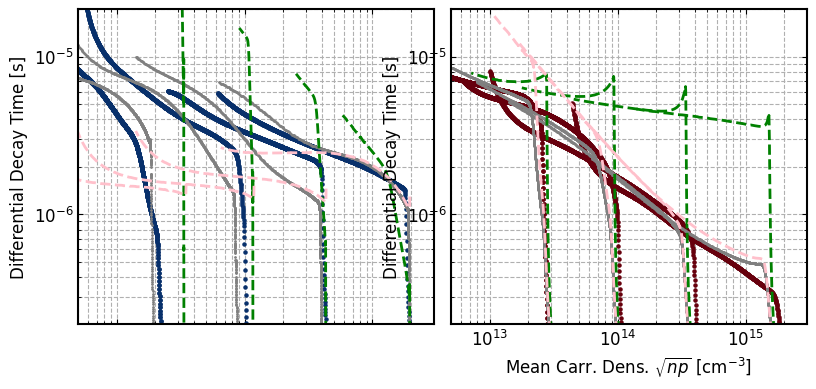

In [486]:
#Plot series
A4_width = 8.27
A4_height = 11.69
fig, ax = plt.subplots(1,2, figsize = (A4_width,A4_height/3))
idx_start = 3501

color = plt.get_cmap("tab20b", 3)
Blues = plt.get_cmap("Blues", 3)
Reds = plt.get_cmap("Reds", 3)
Greens = plt.get_cmap("Greens", 4)
Purples = plt.get_cmap("Purples",4)
selection = [0,1,2,3]

# for i, (sPL) in enumerate(selection):
#     x_interp = np.logspace(np.log10(trPLs.densities[sPL][:-1][-1]), np.log10(trPLs.densities[sPL][:-1][0]), num = 1000)
#     tau_interp = np.interp(x_interp, trPLs.densities[sPL][:-1][::-1], trPLs.diff_taus[sPL][::-1])
#     if not(i):
#         #ax[0].scatter(TwoQThree_before.densities[sPL][:-1], TwoQThree_before.diff_taus[sPL], label = 'High OptoEl. Fresh', alpha = 1, color = Reds(1), s = 5)
#         ax[0].scatter(x_interp, tau_interp, label = 'High OptoEl. As-dep.', alpha = 1, color = Blues(1), s = 5)
#     ax[0].scatter(x_interp, tau_interp, alpha = 1, color = Blues(1), s = 5)
#     #ax[0].plot(x_interp, tau_interp, alpha = 1, color = 'black')

selection = [0,1,2,3]
for i, (sPL) in enumerate(selection):
    x_interp = np.logspace(np.log10(trPLs_after21H.densities[sPL][:-1][-1]), np.log10(trPLs_after21H.densities[sPL][:-1][0]), num = 1000)
    tau_interp = np.interp(x_interp, trPLs_after21H.densities[sPL][:-1][::-1], trPLs_after21H.diff_taus[sPL][::-1])
    if not(i):
        #ax[0].scatter((TwoQThree_after20H.densities[sPL][:-1]), TwoQThree_after20H.diff_taus[sPL], label = TwoQThree_after20H.TRPL_sample[sPL], alpha = 1, color = Blues(2), s = 5)
        ax[0].scatter(x_interp, tau_interp, label = "High OptoEl. 21H", alpha = 1, color = Blues(2), s = 5)
    ax[0].scatter(x_interp, tau_interp, alpha = 1, color = Blues(2), s = 5)

# for i, (sPL) in enumerate(selection):
#     x_interp = np.logspace(np.log10(trPLs3Q2_before.densities[sPL][:-1][-1]), np.log10(trPLs3Q2_before.densities[sPL][:-1][0]), num = 1000)
#     tau_interp = np.interp(x_interp, trPLs3Q2_before.densities[sPL][:-1][::-1], trPLs3Q2_before.diff_taus[sPL][::-1])
#     #ax[0].scatter((ThreeQTwo_before.densities[sPL][:-1]), ThreeQTwo_before.diff_taus[sPL], label = ThreeQTwo_before.TRPL_sample[sPL], alpha = 1, color = Greens(1))
#     if not (i):
#         ax[1].scatter(x_interp, tau_interp, label = "Low OptoEl. As-dep.", alpha = 1, color = Reds(1), s = 5)
#     ax[1].scatter(x_interp, tau_interp, alpha = 1, color = Reds(1), s = 5)
#     #ax[1].plot(x_interp, tau_interp, alpha = 1, color = 'black')

for i, (sPL) in enumerate(selection):
    x_interp = np.logspace(np.log10(trPLs3Q2_after.densities[sPL][:-1][-1]), np.log10(trPLs3Q2_after.densities[sPL][:-1][0]), num = 1000)
    tau_interp = np.interp(x_interp, trPLs3Q2_after.densities[sPL][:-1][::-1], trPLs3Q2_after.diff_taus[sPL][::-1])
    #ax[1].scatter((ThreeQTwo_after21H.densities[sPL][:-1]), ThreeQTwo_after21H.diff_taus[sPL], label = ThreeQTwo_after21H.TRPL_sample[sPL], alpha = 1, color = Reds(2), s = 5)
    if not (i):
        ax[1].scatter(x_interp, tau_interp, label = "Low OptoEl. 21H", alpha = 1, color = Reds(2), s = 5)
    ax[1].scatter(x_interp, tau_interp, alpha = 1, color = Reds(2), s = 5)
    #ax[1].plot(x_interp, tau_interp, alpha = 1, color = 'black'
if not('tau_diffs' in globals()):
    tau_diffs = []
    densities = []

color_fits = ["black","grey",  "black", "grey",]
Fs = 1e9*trPLs.fluences*1e-4 #nJ/cm2
blues = plt.get_cmap("Blues", 4)
reds = plt.get_cmap("Reds", 4)
colors = [blues(1), blues(3), reds(1), reds(3)]
    

for i, (density, taudiff) in enumerate(zip(analysis_run2traps.densities_best, analysis_run2traps.taudiff_best)):
    
    if (i == 1):
        ax[0].scatter(density, taudiff, linestyle = "-", color = color_fits[i], s = 1)
    elif (i == 3):
        ax[1].scatter(density, taudiff, linestyle = "-", color = color_fits[i], s = 1)

    color_partition = ["green", "pink"]
    for p, (d, t)  in enumerate(zip(analysis_run2traps.densities_partitions[i].T, analysis_run2traps.taudiff_partitions[i].T)): 
        #print(d,t)
        for j in range(4):
            if (i == 1 and p == 0):
                ax[0].plot(d[j*1000:(j+1)*1000], t[j*1000:(j+1)*1000]/12, color = color_partition[p], linestyle = '--')
            elif (i == 1 and p == 1):
                ax[0].plot(d[j*1000:(j+1)*1000], t[j*1000:(j+1)*1000], color = color_partition[p], linestyle = '--')
            elif (i == 3):
                ax[1].plot(d[j*1000:(j+1)*1000], t[j*1000:(j+1)*1000], color = color_partition[p], linestyle = '--')

for i, a in enumerate(ax):
    #a.text(4e14, 1e-5, r'$\tau_{diff}$ = $\frac{c}{\sqrt{np}}$', size = axisTicks_fontsize)
    a.set_xlim([5e12, 3e15])
    a.set_ylim([2e-7, 2e-5])
    a.set_yscale("log")
    a.set_xscale("log")
    axis_fontsize = 18
    axisTicks_fontsize = 12
    
    a.tick_params(axis='x', labelsize=axisTicks_fontsize)
    a.tick_params(axis='y', labelsize=axisTicks_fontsize)
    a.grid(visible = True, which = 'both', linestyle = '--')
    w_frame = 1.5
    a.spines["bottom"].set_linewidth(w_frame)
    a.spines["top"].set_linewidth(w_frame)
    a.spines["left"].set_linewidth(w_frame)
    a.spines["right"].set_linewidth(w_frame)
    a.set_ylabel("Differential Decay Time [s]", fontsize=axisTicks_fontsize) 
    if (i):
        a.set_xlabel(r"Mean Carr. Dens. $\sqrt{{np}}$ [cm$^{{-3}}$]", fontsize=axisTicks_fontsize) 
        
    else:
        #a.get_yaxis().set_visible(False)
        a.set_xticklabels([])
        
    a.set_axisbelow(True)

    handles, labels = a.get_legend_handles_labels()
    # Example: Reordering manually
    #order = [0,2,1,3] # Desired order of elements (e.g., label at index 2 first, then 0, then 1)
    #new_handles = [handles[i] for i in order]
    #new_labels = [labels[i] for i in order]
    #a.legend(fontsize = 2, borderpad=0.0, labelspacing=0., handletextpad=0, prop={'family': 'monospace'}, loc = 'upper right')

#fig.tight_layout(pad=0.5, w_pad=1, h_pad=0.0)
#fig.savefig('/media/qrb/0726-A615/LastVersion/Reviews/Graphs/Fig2_tauDiff.svg', bbox_inches = None)

analysis_run2traps.export_svg(fig, "/media/qrb/0726-A615/LastVersion/Reviews/Graphs/FigS_tauDiff.svg", margin_mm = (20, 5, 5, 14), 
                              width_in = fig.get_figwidth(), height_in=fig.get_figheight(), wspace = 0.05)#

Test 0.0209 0.02093250549612415
Correspondences: 0.017858389388216597 34946512687314.246
Correspondences: 0.06060006718392829 118586338927775.66
Correspondences: 0.22184460848975443 434120639698610.44
Correspondences: 1.0 1956868109862853.8
Test 0.0325 0.03252666511579854
Correspondences: 0.01834626836127904 34946512687314.246
Correspondences: 0.06044900080001979 118586338927775.66
Correspondences: 0.22147269623165933 434120639698610.44
Correspondences: 1.0 1956868109862853.8
Test 0.0227 0.022722616646249215
Correspondences: 0.017618261275687212 34946512687314.246
Correspondences: 0.06056586936215638 118586338927775.66
Correspondences: 0.2805327595409661 434120639698610.44
Correspondences: 1.0 1956868109862853.8
Test 0.0246 0.024639160339804882
Correspondences: 0.01812827753126261 34946512687314.246
Correspondences: 0.06052177062838045 118586338927775.66
Correspondences: 0.22253871294383024 434120639698610.44
Correspondences: 1.0 1956868109862853.8


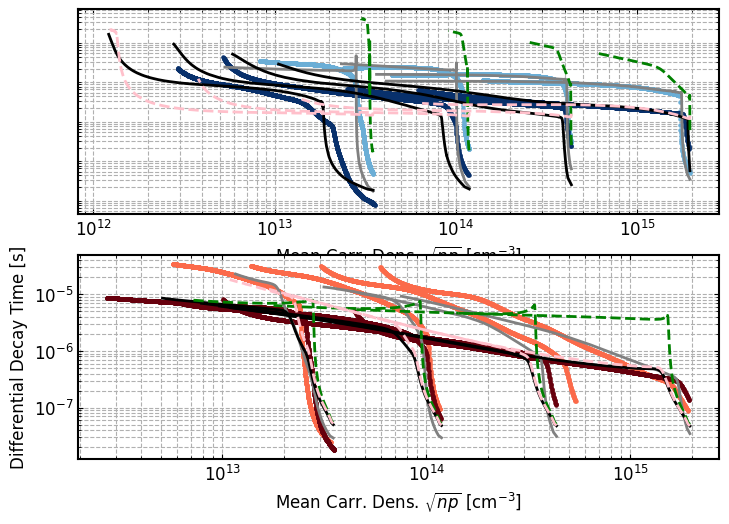

In [ ]:
#Plot series
A4_width = 8.27
A4_height = 11.69
fig, ax = plt.subplots(2,1, figsize = (A4_width,A4_height/2))
idx_start = 3501

color = plt.get_cmap("tab20b", 3)
Blues = plt.get_cmap("Blues", 3)
Reds = plt.get_cmap("Reds", 3)
Greens = plt.get_cmap("Greens", 4)
Purples = plt.get_cmap("Purples",4)
selection = [0,1,2,3]

# density = np.linspace(1e13, 1e16)
# ax[0].plot(density, 4e9/density, color = 'black', linestyle = '--')
# ax[1].plot(density, 3e9/density, color = 'black', linestyle = '--')
# ax[1].plot(density, 2e23/density**2, color = 'black', linestyle = '--')
# ax[0].plot(density, 80/np.sqrt(density), color = 'black', linestyle = '--')
# ax[1].plot(density, 5/np.sqrt(density), color = 'black', linestyle = '--')

for i, (sPL) in enumerate(selection):
    x_interp = np.logspace(np.log10(trPLs.densities[sPL][:-1][-1]), np.log10(trPLs.densities[sPL][:-1][0]), num = 1000)
    tau_interp = np.interp(x_interp, trPLs.densities[sPL][:-1][::-1], trPLs.diff_taus[sPL][::-1])
    if not(i):
        #ax[0].scatter(TwoQThree_before.densities[sPL][:-1], TwoQThree_before.diff_taus[sPL], label = 'High OptoEl. Fresh', alpha = 1, color = Reds(1), s = 5)
        ax[0].scatter(x_interp, tau_interp, label = 'High OptoEl. As-dep.', alpha = 1, color = Blues(1), s = 5)
    ax[0].scatter(x_interp, tau_interp, alpha = 1, color = Blues(1), s = 5)
    #ax[0].plot(x_interp, tau_interp, alpha = 1, color = 'black')

selection = [0,1,2,3]
for i, (sPL) in enumerate(selection):
    x_interp = np.logspace(np.log10(trPLs_after21H.densities[sPL][:-1][-1]), np.log10(trPLs_after21H.densities[sPL][:-1][0]), num = 1000)
    tau_interp = np.interp(x_interp, trPLs_after21H.densities[sPL][:-1][::-1], trPLs_after21H.diff_taus[sPL][::-1])
    if not(i):
        #ax[0].scatter((TwoQThree_after20H.densities[sPL][:-1]), TwoQThree_after20H.diff_taus[sPL], label = TwoQThree_after20H.TRPL_sample[sPL], alpha = 1, color = Blues(2), s = 5)
        ax[0].scatter(x_interp, tau_interp, label = "High OptoEl. 21H", alpha = 1, color = Blues(2), s = 5)
    ax[0].scatter(x_interp, tau_interp, alpha = 1, color = Blues(2), s = 5)

for i, (sPL) in enumerate(selection):
    x_interp = np.logspace(np.log10(trPLs3Q2_before.densities[sPL][:-1][-1]), np.log10(trPLs3Q2_before.densities[sPL][:-1][0]), num = 1000)
    tau_interp = np.interp(x_interp, trPLs3Q2_before.densities[sPL][:-1][::-1], trPLs3Q2_before.diff_taus[sPL][::-1])
    #ax[0].scatter((ThreeQTwo_before.densities[sPL][:-1]), ThreeQTwo_before.diff_taus[sPL], label = ThreeQTwo_before.TRPL_sample[sPL], alpha = 1, color = Greens(1))
    if not (i):
        ax[1].scatter(x_interp, tau_interp, label = "Low OptoEl. As-dep.", alpha = 1, color = Reds(1), s = 5)
    ax[1].scatter(x_interp, tau_interp, alpha = 1, color = Reds(1), s = 5)
    #ax[1].plot(x_interp, tau_interp, alpha = 1, color = 'black')

for i, (sPL) in enumerate(selection):
    x_interp = np.logspace(np.log10(trPLs3Q2_after.densities[sPL][:-1][-1]), np.log10(trPLs3Q2_after.densities[sPL][:-1][0]), num = 1000)
    tau_interp = np.interp(x_interp, trPLs3Q2_after.densities[sPL][:-1][::-1], trPLs3Q2_after.diff_taus[sPL][::-1])
    #ax[1].scatter((ThreeQTwo_after21H.densities[sPL][:-1]), ThreeQTwo_after21H.diff_taus[sPL], label = ThreeQTwo_after21H.TRPL_sample[sPL], alpha = 1, color = Reds(2), s = 5)
    if not (i):
        ax[1].scatter(x_interp, tau_interp, label = "Low OptoEl. 21H", alpha = 1, color = Reds(2), s = 5)
    ax[1].scatter(x_interp, tau_interp, alpha = 1, color = Reds(2), s = 5)
    #ax[1].plot(x_interp, tau_interp, alpha = 1, color = 'black'
if not('tau_diffs' in globals()):
    tau_diffs = []
    densities = []

color_fits = ["grey", "black", "grey", "black"]
Fs = 1e9*trPLs.fluences*1e-4 #nJ/cm2
blues = plt.get_cmap("Blues", 4)
reds = plt.get_cmap("Reds", 4)
colors = [blues(1), blues(3), reds(1), reds(3)]
    

for i, s in enumerate(analysis_run2traps.samples_order):
    # nrmse, path, RateEq, n_traps = analysis_run2traps.best_runs_dict[s]
    # exp_format = 'trPL' # experiment format
    # model = partial(DBTD_multi_trap, method="BDF", dimensionless=True, timeout=90, timeout_solve=90)
    # RateEq.model = model
    
    # #if not('tau_diffs' in globals()):
    # y_test = RateEq.run({},exp_format=exp_format)
    # y_transformed, y_pred_transformed = transform_data(np.array(RateEq.y[0]),y_test, transform_type='normalized_log', do_G_frac_transform=True, X=np.array(RateEq.X[0]))
    # print("Test", nrmse, calc_metric(y_transformed, y_pred_transformed, metric_name='nrmse'))
    # calc_nrmse = calc_metric(y_transformed, y_pred_transformed, metric_name='nrmse')

    # X = np.array(RateEq.X[0])
    
    taudiffs_pDep = []
    densities_pDep = []
    for j, G in enumerate(np.unique(X[:, 1])):
        print("Correspondences:", G, trPLs.n0s[j])
        fitPL = 10**y_pred_transformed[X[:, 1] == G]
        t = X[:, 0][X[:, 1] == G]
        sqrt_np = trPLs.n0s[j]*np.sqrt(fitPL)
        taudiff = -2*(np.diff(t)/np.diff(np.log(fitPL)))
        taudiffs_pDep.append(taudiff)
        densities_pDep.append(sqrt_np)
        if (i < 2):
            ax[0].plot(sqrt_np[:-1], taudiff, linestyle = "-", color = color_fits[i])
        else:
            ax[1].plot(sqrt_np[:-1], taudiff, linestyle = "-", color = color_fits[i])

    color_partition = ["green", "pink"]
    for p, RateEq_partition in enumerate(analysis_run2traps.RateEq_partitions[i]):
        exp_format = 'trPL' # experiment format
        model = partial(DBTD_multi_trap, method="BDF", dimensionless=True, timeout=90, timeout_solve=90)
        RateEq_partition.model = model
        #if not('tau_diffs' in globals()):
        y_test = RateEq_partition.run({},exp_format=exp_format)
        y_transformed, y_pred_transformed = transform_data(np.array(RateEq_partition.y[0]),y_test, transform_type='normalized_log', do_G_frac_transform=True, X=np.array(RateEq_partition.X[0]))
        X = np.array(RateEq_partition.X[0])

        for j, G in enumerate(np.unique(X[:, 1])):
            fitPL = 10**y_pred_transformed[X[:, 1] == G]
            t = X[:, 0][X[:, 1] == G]
            sqrt_np = trPLs.n0s[j]*np.sqrt(fitPL[fitPL>1e-3])
            taudiff = -2*(np.diff(t[fitPL>1e-3])/np.diff(np.log(fitPL[fitPL>1e-3])))
            if (i == 1):
                ax[0].plot(sqrt_np[:-1], taudiff, linestyle = "--", color = color_partition[p])
            elif (i == 3):
                ax[1].plot(sqrt_np[:-1], taudiff, linestyle = "--", color = color_partition[p])
    
    if not('tau_diffs' in globals()):
        tau_diffs.append(taudiffs_pDep)
        densities.append(densities_pDep)

for i, a in enumerate(ax):
    #a.text(4e14, 1e-5, r'$\tau_{diff}$ = $\frac{c}{\sqrt{np}}$', size = axisTicks_fontsize)
    # a.set_xlim([5e12, 3e15])
    # a.set_ylim([1e-7, 5e-5])
    #a.set_ylim([1, 1e7])
    a.set_yscale("log")
    a.set_xscale("log")
    axis_fontsize = 18
    axisTicks_fontsize = 12
    a.set_xlabel(r"Mean Carr. Dens. $\sqrt{{np}}$ [cm$^{{-3}}$]", fontsize=axisTicks_fontsize) 
    a.tick_params(axis='x', labelsize=axisTicks_fontsize)
    a.tick_params(axis='y', labelsize=axisTicks_fontsize)
    a.grid(visible = True, which = 'both', linestyle = '--')
    w_frame = 1.5
    a.spines["bottom"].set_linewidth(w_frame)
    a.spines["top"].set_linewidth(w_frame)
    a.spines["left"].set_linewidth(w_frame)
    a.spines["right"].set_linewidth(w_frame)

    if (i):
        a.set_ylabel("Differential Decay Time [s]", fontsize=axisTicks_fontsize) 
    else:
        #a.get_yaxis().set_visible(False)
        a.set_yticks([])
        
    a.set_axisbelow(True)

    handles, labels = a.get_legend_handles_labels()
    # Example: Reordering manually
    #order = [0,2,1,3] # Desired order of elements (e.g., label at index 2 first, then 0, then 1)
    #new_handles = [handles[i] for i in order]
    #new_labels = [labels[i] for i in order]
    #a.legend(fontsize = 2, borderpad=0.0, labelspacing=0., handletextpad=0, prop={'family': 'monospace'}, loc = 'upper right')

#fig.tight_layout(pad=0.5, w_pad=1, h_pad=0.0)
#fig.savefig('/media/qrb/0726-A615/LastVersion/Reviews/Graphs/Fig2_tauDiff.svg', bbox_inches = None)

#export_svg(fig, "/media/qrb/0726-A615/LastVersion/Reviews/Graphs/Fig2_tauDiff.svg", margin_mm = (20, 5, 5, 14), width_in = fig.get_figwidth(), height_in=fig.get_figheight(), wspace = 0.05)#



Test 0.0209 0.02093250549612415
2
Setting all traps except: N_t_bulk_1
0.06207901469763179
Setting all traps except: N_t_bulk_2
0.04859611639524291
Test 0.0325 0.03252666511579854
2
Setting all traps except: N_t_bulk_1
0.1975635488696801
Setting all traps except: N_t_bulk_2
0.0691154431447691
Test 0.0227 0.022722616646249215
2
Setting all traps except: N_t_bulk_1
0.046089795170727074
Setting all traps except: N_t_bulk_2
0.20747082333851102
Test 0.0246 0.024639160339804882
2
Setting all traps except: N_t_bulk_1
0.12100038738213645
Setting all traps except: N_t_bulk_2
0.04049232605296318


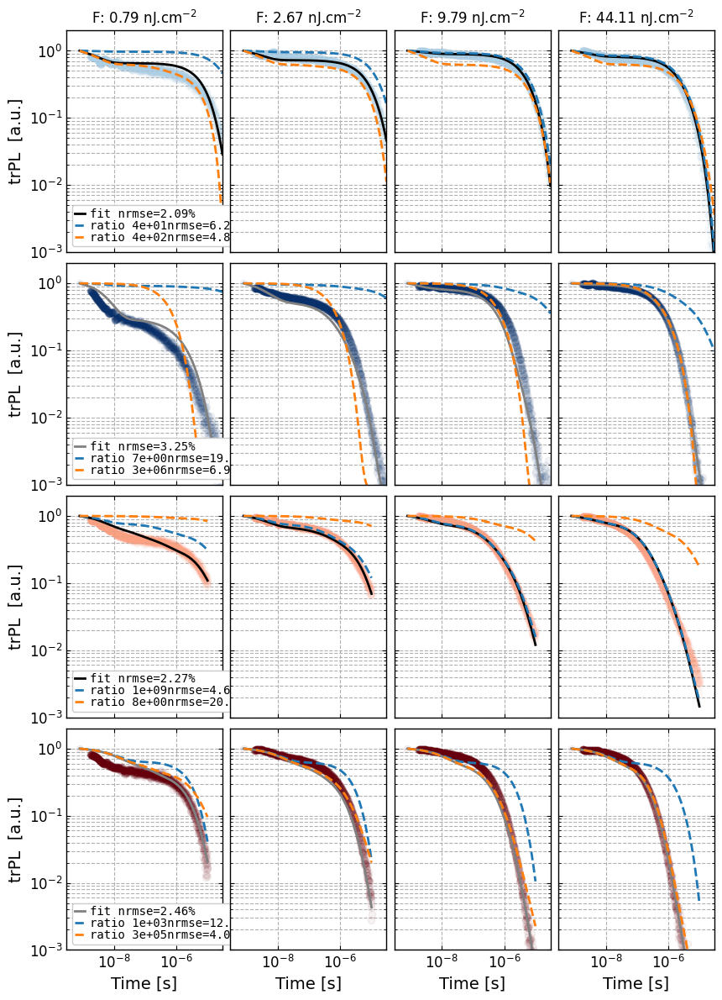

In [634]:
analysis_run2traps.compare_trap_partition(trPLs, savepath = r"/media/qrb/0726-A615/LastVersion/Reviews/Graphs/FigSX_fits_trapPartition.svg", 
                                                margin_mm = (12,7,2,12))

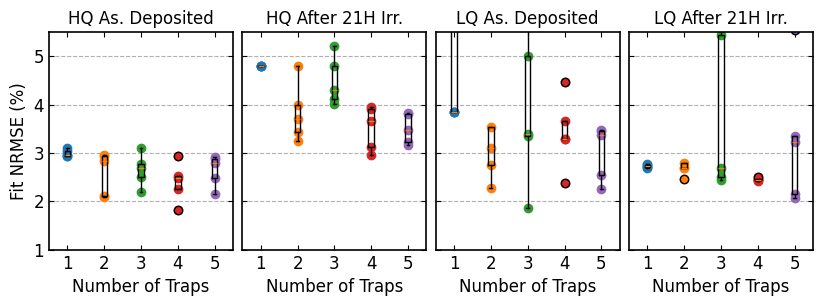

In [61]:
condition = [r"2Q3Before", r"2Q3After", r"3Q2Before", r"3Q2After"]
labels = ["HQ As. Deposited", "HQ After 21H Irr.", "LQ As. Deposited", "LQ After 21H Irr."]
folderpath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope"
analysis_run2traps = analyse_full_Run(folderpath, condition, N_RUNS=5, traps_sel=[2, 2, 2, 2])

analysis_run2traps_Auger = analyse_full_Run(folderpath, condition, N_RUNS=5, traps_sel=[2, 2, 2, 2])
analysis_run2traps.plot_statistics_fromallruns(labels = labels,
                                                 savepath = r"/media/qrb/0726-A615/LastVersion/Reviews/Graphs/FigS4_fitstatistics.svg", 
                                                 margin_mm = (12,7,4,12), ylim = [1, 5.5])

#analysis_run2traps.calc_densities_fromParams(G = 1.0, labels = labels, steadyStateG=5.2e20)

# file_list = [
#     r"nrmses_vals_2Q3Before_fromBestFits2traps_run8_30points.pickle",
#     r"nrmses_vals_2Q3After_fromBestFits2traps_run8_30points.pickle",
#    r"nrmses_vals_3Q2Before_fromBestFits2traps_run8_30points.pickle",
#    r"nrmses_vals_3Q2After_fromBestFits2traps_run8_30points.pickle",
# ]

# figs, axs = analysis_run2traps.import_paramVars_andPlot(r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/PramVariation", filenames_list=file_list, samplename_list=condition, main_titles = ["HQ Parameter Variation", "LQ Parameter Variation"])

# lab = ["2Q3", "3Q2"]
# for i, (fig, ax) in enumerate(zip(figs, axs)):
#     export_svg(fig, f"/media/qrb/0726-A615/LastVersion/Reviews/Graphs/FigS6_nrmseVar_{lab[i]}.svg", margin_mm = (18, 8, 5, 15), width_in = fig.get_figwidth(), height_in=fig.get_figheight(), wspace = 0.02, hspace = 0.2)#

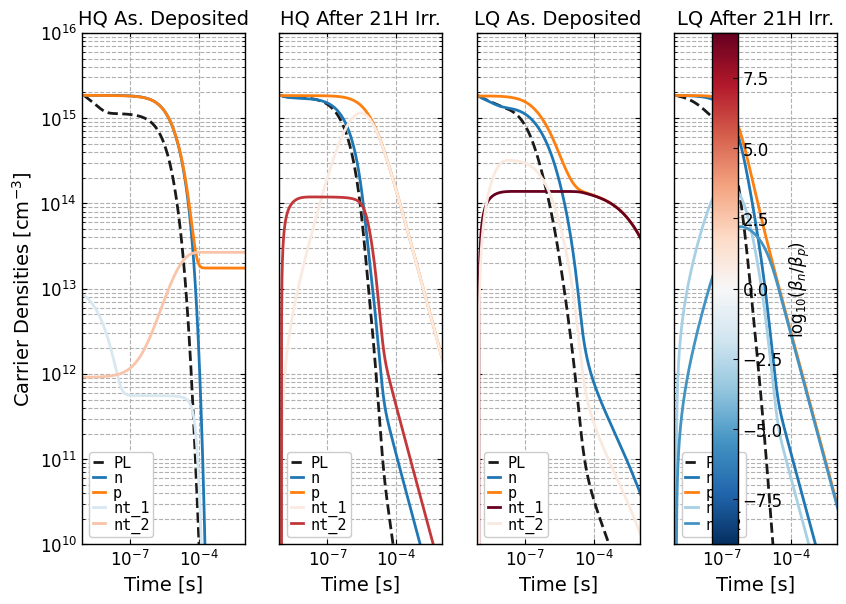

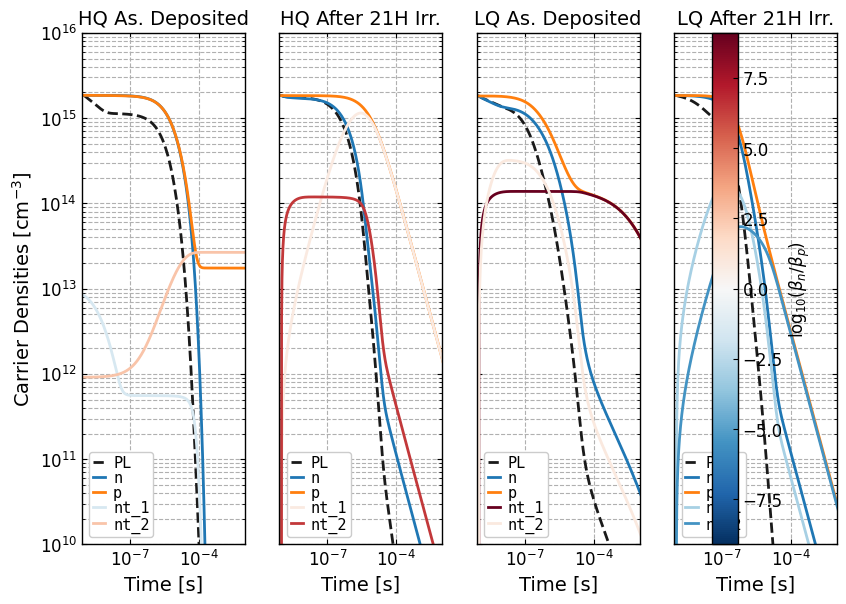

In [62]:
analysis_run2traps.calc_densities_fromParams(G = 1.0, labels = labels, ylim = [1e10, 1e16])
analysis_run2traps_Auger.calc_densities_fromParams(G = 1.0, labels = labels, ylim = [1e10, 1e16], Auger = 1e-30*1e-12)

In [87]:
trPLs.fluences[-1]

np.float64(0.00044110305325810673)

G: 0.2267043931375511
G: 2.267043931375511
G: 22.67043931375511
G: 226.7043931375511


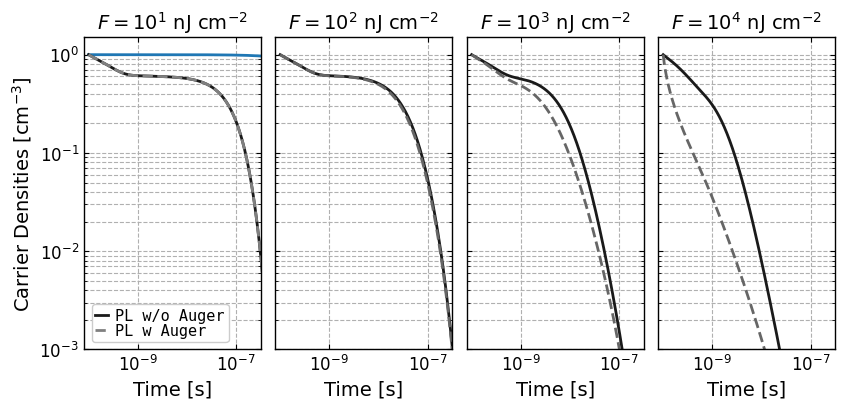

In [102]:
A4_width =  8.27
A4_height = 11.69

fig, ax = plt.subplots(1,4, figsize = (A4_width, A4_height/3))

L = analysis_run2traps.params[0]["L"]
x = np.linspace(0, L, num = 100)

t_span = np.logspace(-10,-3, num = 1000)

ax[0].plot(t_span, np.exp(-t_span/1e-5))

RateEqAgent = analysis_run2traps.best_runs_dict["2Q3Before"][-2]
Gs = [1.0, 10.0, 100.0, 1000.0]/(0.1*trPLs.fluences[-1]*1e9*1e-4)
for j, g in enumerate(Gs):

    print("G:", g)


    analysis_run2traps.calc_densities_fromParams(G = g, labels = labels, ylim = [1e10, 1e16], plot = False)
    analysis_run2traps_Auger.calc_densities_fromParams(G = g, labels = labels, ylim = [1e10, 1e16], plot = False, Auger = 1e-27*1e-12)
    
    ns = analysis_run2traps.ns
    ns_A = analysis_run2traps_Auger.ns
    ps = analysis_run2traps.ps
    ps_A = analysis_run2traps_Auger.ps

    for i in range(len(ns)):
        if (i):
            continue
        PL = np.trapezoid(ns[i]*ps[i], x = x, axis =1)
        PL_a = np.trapezoid(ns_A[i]*ps_A[i], x = x, axis =1)
        if not(j):
            ax[j].loglog(t_span, PL/np.amax(PL), label = f"PL w/o Auger", color = "0.1")
            ax[j].loglog(t_span, PL_a/np.amax(PL_a), label = f"PL w Auger", color = str(0.5), linestyle = "--")
        else:
            ax[j].loglog(t_span, PL/np.amax(PL), color = "0.1")
            ax[j].loglog(t_span, PL_a/np.amax(PL_a), color = "0.4", linestyle = "--")
        # else:
        #     ax[i].loglog(t_span, PL/np.amax(PL), color = "0.1")
        #     ax[i].loglog(t_span, PL_a/np.amax(PL_a), color = "0.5", linestyle = "--")


axisTicks_fontsize = 12
for i, (a) in enumerate(ax):
    val = trPLs.fluences[-1] * Gs[i] * 1e-4 * 1e9
    mant, exp = f"{val:.0e}".split("e")
    exp = int(exp)
    num = rf"10^{{{exp}}}" if mant == "1" else rf"{mant}\times 10^{{{exp}}}"
    title = rf"$F = {num}\ \mathrm{{nJ\ cm^{{-2}}}}$"
    a.set_title(title)

    a.set_ylim([1e-3,1.5])
    a.set_xlim([8e-11, 10**(-6.5)])
    a.set_xscale('log')
    a.set_yscale('log')
    #a.set_xticks([1e-9, 1e-8, 1e-7, 1e-6, 1e-5])
    a.set_xlabel('Time [s]')
    if (i == 0):
        a.set_ylabel('Carrier Densities [cm$^{-3}$]')
    else:
        a.set_yticklabels([])

    if not(i):
        leg = a.legend(borderpad=0.25, labelspacing=0.0, handletextpad=0.5, loc = "lower left", 
            prop={'family': 'monospace', "size": 11}, frameon=True, framealpha=1, handlelength=0.8,)
    
    
    #a.set_title(f'F: {f:.2f}'+' nJ.cm$^{-2}$', size = 12)
    a.tick_params(axis='x', labelsize=axisTicks_fontsize)
    a.tick_params(axis='y', labelsize=axisTicks_fontsize)
    #a.minorticks_on()
    a.grid(visible = True, which = 'both', linestyle = '--')
    w_frame = 1.
    a.spines["bottom"].set_linewidth(w_frame)
    a.spines["top"].set_linewidth(w_frame)
    a.spines["left"].set_linewidth(w_frame)
    a.spines["right"].set_linewidth(w_frame)

    fig.tight_layout(pad=0., w_pad=0., h_pad=0.)

margin_mm = (20,  8, 6, 14)
# savepath = r"/media/qrb/0726-A615/LastVersion/Reviews/Graphs/FigSX_AugerContribution.svg"
# analysis_run2traps.export_svg(fig, savepath, margin_mm = margin_mm, width_in = fig.get_figwidth(), height_in=fig.get_figheight(), hspace = 0.05)#

G: 0.02


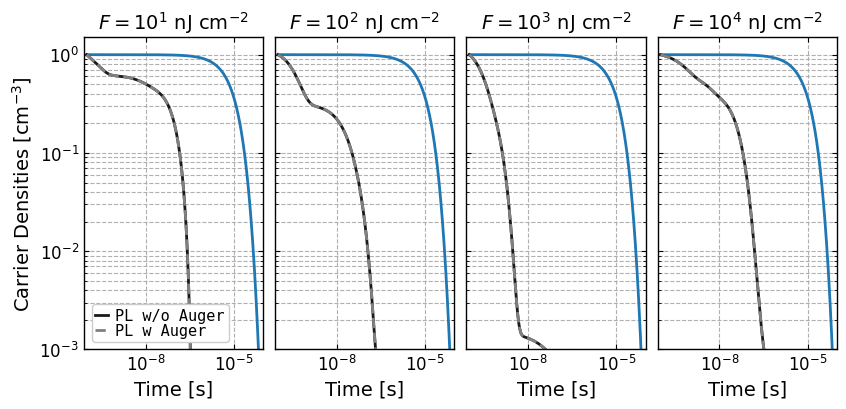

In [105]:
A4_width =  8.27
A4_height = 11.69

fig, ax = plt.subplots(1,4, figsize = (A4_width, A4_height/3))

L = analysis_run2traps.params[0]["L"]
x = np.linspace(0, L, num = 100)

t_span = np.logspace(-10,-3, num = 1000)



RateEqAgent = analysis_run2traps.best_runs_dict["2Q3Before"][-2]
Gs = [1.0, 10.0, 100.0, 1000.0]/(0.1*trPLs.fluences[-1]*1e9*1e-4)
for j, g in enumerate(Gs):
    if(j > 0):
        continue
    g = 0.02
    print("G:", g)
    analysis_run2traps.calc_densities_fromParams(G = g, labels = labels, ylim = [1e10, 1e16], plot = False)
    analysis_run2traps_Auger.calc_densities_fromParams(G = g, labels = labels, ylim = [1e10, 1e16], plot = False, Auger = 1e-27*1e-12)
    
    ns = analysis_run2traps.ns
    ns_A = analysis_run2traps_Auger.ns
    ps = analysis_run2traps.ps
    ps_A = analysis_run2traps_Auger.ps

    for i in range(len(ns)):
        if (j==0):
            ax[i].plot(t_span, np.exp(-t_span/1e-5))
            
        PL = np.trapezoid(ns[i]*ps[i], x = x, axis =1)
        PL_a = np.trapezoid(ns_A[i]*ps_A[i], x = x, axis =1)
        if not(j):
            ax[i].loglog(t_span, PL/np.amax(PL), label = f"PL w/o Auger", color = "0.1")
            ax[i].loglog(t_span, PL_a/np.amax(PL_a), label = f"PL w Auger", color = str(0.5), linestyle = "--")
        else:
            ax[i].loglog(t_span, PL/np.amax(PL), color = "0.1")
            ax[i].loglog(t_span, PL_a/np.amax(PL_a), color = "0.4", linestyle = "--")
        # else:
        #     ax[i].loglog(t_span, PL/np.amax(PL), color = "0.1")
        #     ax[i].loglog(t_span, PL_a/np.amax(PL_a), color = "0.5", linestyle = "--")


axisTicks_fontsize = 12
for i, (a) in enumerate(ax):
    val = trPLs.fluences[-1] * Gs[i] * 1e-4 * 1e9
    mant, exp = f"{val:.0e}".split("e")
    exp = int(exp)
    num = rf"10^{{{exp}}}" if mant == "1" else rf"{mant}\times 10^{{{exp}}}"
    title = rf"$F = {num}\ \mathrm{{nJ\ cm^{{-2}}}}$"
    a.set_title(title)

    a.set_ylim([1e-3,1.5])
    a.set_xlim([8e-11, 1e-4])
    a.set_xscale('log')
    a.set_yscale('log')
    #a.set_xticks([1e-9, 1e-8, 1e-7, 1e-6, 1e-5])
    a.set_xlabel('Time [s]')
    if (i == 0):
        a.set_ylabel('Carrier Densities [cm$^{-3}$]')
    else:
        a.set_yticklabels([])

    if not(i):
        leg = a.legend(borderpad=0.25, labelspacing=0.0, handletextpad=0.5, loc = "lower left", 
            prop={'family': 'monospace', "size": 11}, frameon=True, framealpha=1, handlelength=0.8,)
    
    
    #a.set_title(f'F: {f:.2f}'+' nJ.cm$^{-2}$', size = 12)
    a.tick_params(axis='x', labelsize=axisTicks_fontsize)
    a.tick_params(axis='y', labelsize=axisTicks_fontsize)
    #a.minorticks_on()
    a.grid(visible = True, which = 'both', linestyle = '--')
    w_frame = 1.
    a.spines["bottom"].set_linewidth(w_frame)
    a.spines["top"].set_linewidth(w_frame)
    a.spines["left"].set_linewidth(w_frame)
    a.spines["right"].set_linewidth(w_frame)

    fig.tight_layout(pad=0., w_pad=0., h_pad=0.)

margin_mm = (20,  8, 6, 14)
# savepath = r"/media/qrb/0726-A615/LastVersion/Reviews/Graphs/FigSX_AugerContribution.svg"
# analysis_run2traps.export_svg(fig, savepath, margin_mm = margin_mm, width_in = fig.get_figwidth(), height_in=fig.get_figheight(), hspace = 0.05)#

0.02093250549612415
0.03252666511579854
0.022722616646249215
0.024639160339804882


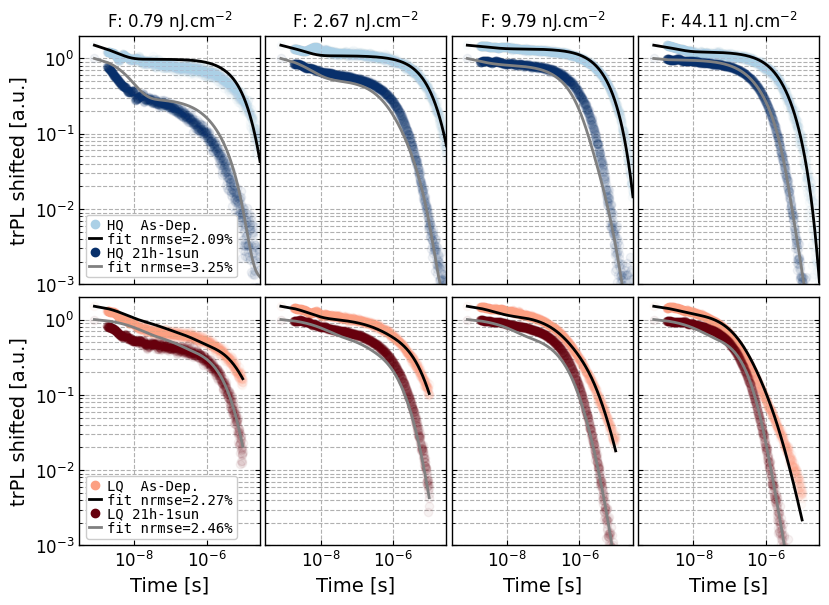

In [632]:
labels = ['HQ  As-Dep.', 'HQ 21h-1sun', 'LQ  As-Dep.', 'LQ 21h-1sun']
analysis_run2traps.plot_resultingFits(trPLs, savepath = r"/media/qrb/0726-A615/LastVersion/Reviews/Graphs/Fig3_fits_New.svg", 
                                                margin_mm = (20,7,2,12), wspace = 0.03, leg = labels)

In [691]:
for i, p in enumerate(analysis_run2traps.params):
    # for j in range(2):
    #     val = p[f'N_t_bulk_{j+1}']
    #     print(i, f'N_t_bulk_{j+1}', val, f'{1e-6*val:.1e}')

    val = p[f'mu_n']
    valp = p[f'k_direct']
    print(i, f'N_t_bulk_{j+1}', val, f'{1e4*val:.1e}', f'{1e6*valp:.1e}')

0 N_t_bulk_2 0.0007476710081542251 7.5e+00 5.0e-11
1 N_t_bulk_2 1.0392810160403636e-06 1.0e-02 2.5e-11
2 N_t_bulk_2 6.999527949007206e-06 7.0e-02 4.8e-11
3 N_t_bulk_2 0.00016582884603588282 1.7e+00 2.7e-11


/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/01-2Q3Before-2traps-nrmse00209-RateEqAgent.pickle
Constant Gen, setting dimensionless to False
/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/03-2Q3After-2traps-nrmse00325-RateEqAgent.pickle
{'Eg': 1.553, 'L': 8e-07, 'alpha': 3630000.0, 'N_cv': 2e+24, 'k_direct': 2.5309776680159062e-17, 'mu_n': 1.0392810160403636e-06, 'mu_p': 1.015310571272078e-06, 'N_t_bulk_1': 2.8929358732805155e+21, 'C_n_1': 4.618896672834818e-16, 'C_p_1': 6.616043223161936e-17, 'E_t_bulk_1': np.float64(1.1972482517996537), 'N_t_bulk_2': 1.2414313036544226e+20, 'C_n_2': 9.878997305727448e-13, 'C_p_2': 3.4268394667321006e-19, 'E_t_bulk_2': np.float64(1.268690431239264), 'I_factor_PL': 1.275e-22}
Constant Gen, setting dimensionless to False
/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_32

/tmp/ipykernel_480/684077577.py:862: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



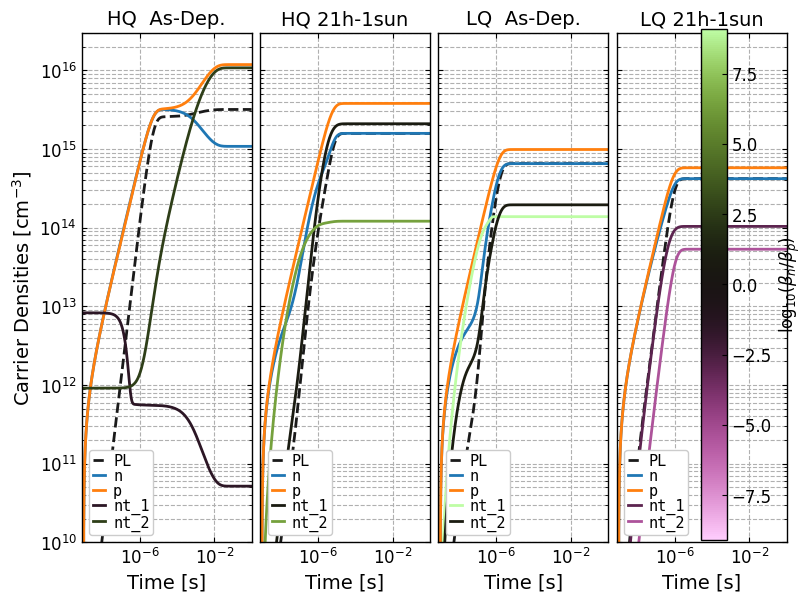

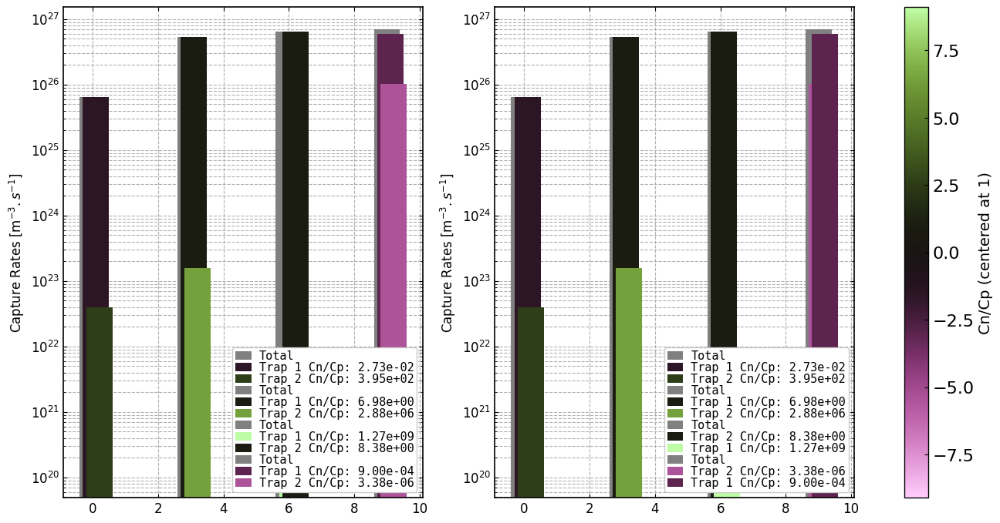

In [637]:
analysis_run2traps.calc_densities_fromParams(G = 1.0, labels = labels, steadyStateG=5.9e20,
                                             savepath = r"/media/qrb/0726-A615/LastVersion/Reviews/Graphs/FigSX_SSdensities.svg", 
                                                margin_mm = (21,7,10,12), ylim = [1e10, 3e16],xlim = [8e-10, 1],  wspace = 0.05, 
                                                cmap_name="vanimo")
rates_2traps, cn_cps_2traps, Ets_2traps, Nts_2traps, colors_2traps, norm = analysis_run2traps.plot_rates(cmap_name="vanimo")

In [194]:
cn_cps

[array([7.72324942e+06, 4.13423359e+00, 6.27843401e+02, 2.55991065e-01]),
 array([7.10586924e-04, 2.14020367e-03, 5.02001628e+00, 1.75353863e+07]),
 array([1.72035650e+06, 4.56153846e-01, 7.69174515e+00]),
 array([1.06265724e-02, 1.23617518e+02, 5.71720209e+01, 3.07516861e+03,
        8.63805101e-02])]

/tmp/ipykernel_4811/445390902.py:613: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_4811/445390902.py:613: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_4811/445390902.py:613: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_4811/445390902.py:654: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.

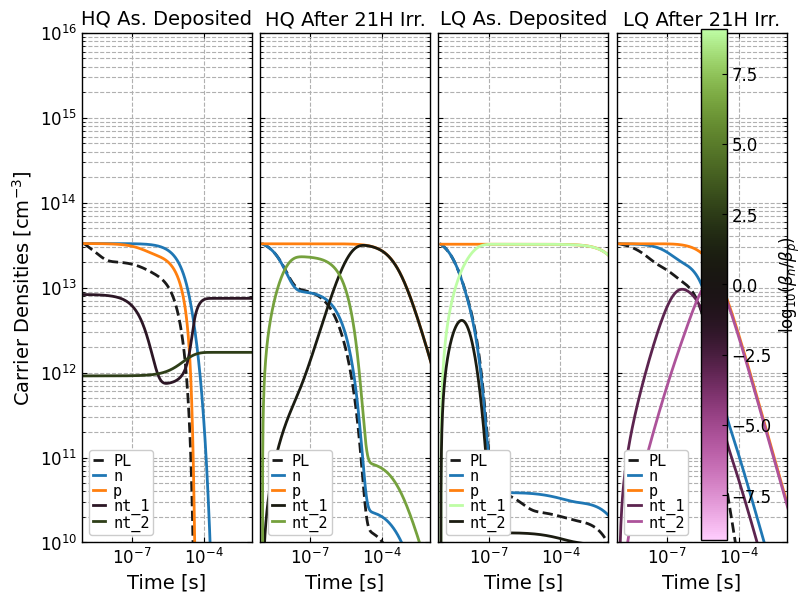

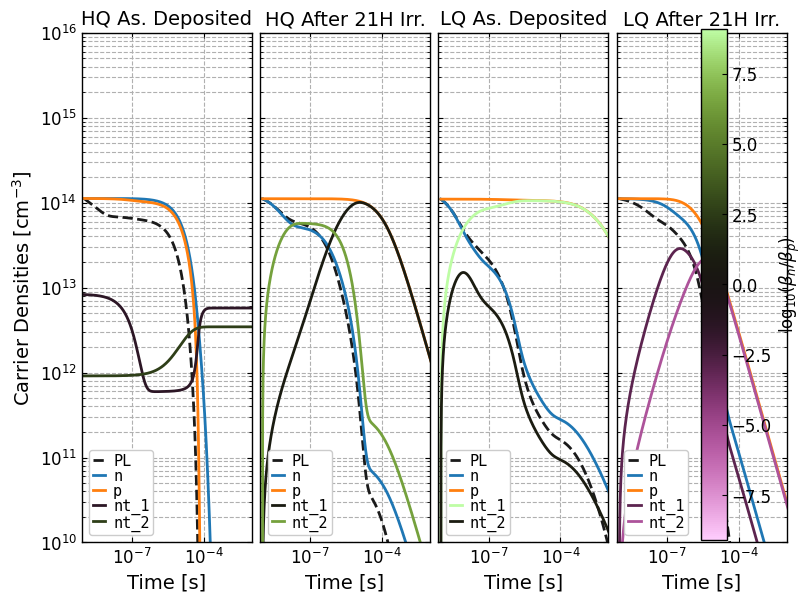

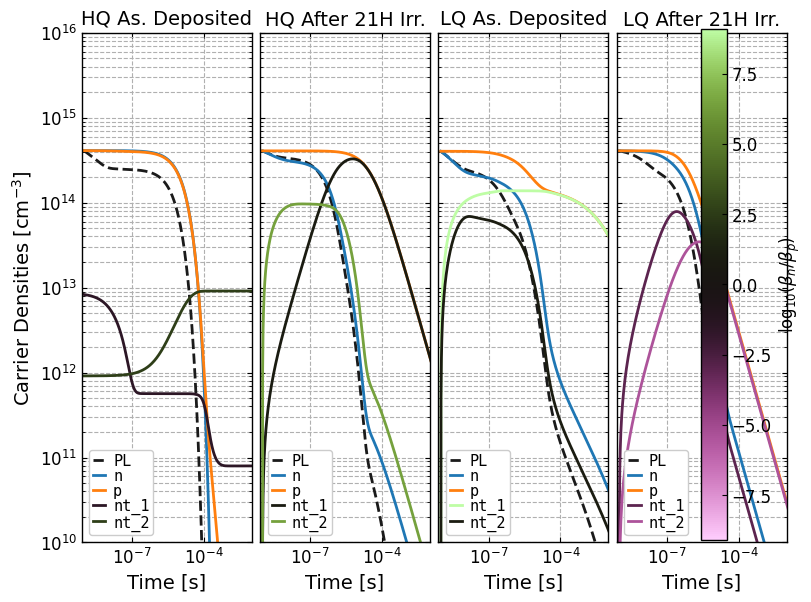

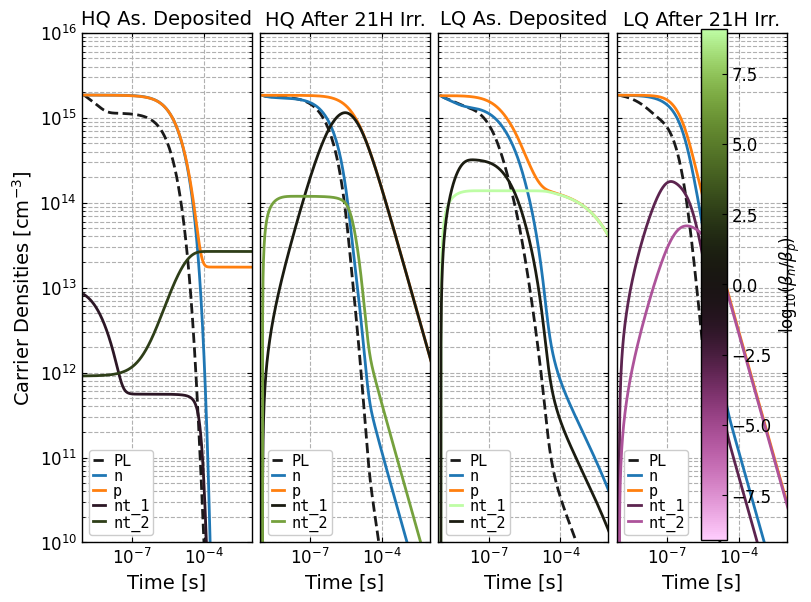

In [ ]:
condition = [r"2Q3Before", r"2Q3After", r"3Q2Before", r"3Q2After"]
labels = ["HQ As. Deposited", "HQ After 21H Irr.", "LQ As. Deposited", "LQ After 21H Irr."]
folderpath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope"
analysis_run2traps = analyse_full_Run(folderpath, condition, N_RUNS=5, traps_sel=[2, 2, 2, 2])

for g in np.unique(X[:, 1]):
   analysis_run2traps.calc_densities_fromParams(G = g, labels = labels,
                                                savepath = f"/media/qrb/0726-A615/LastVersion/Reviews/Graphs/FigSX_densities_G{g:.2f}.svg", 
                                                   margin_mm = (21,7,10,12), ylim = [1e10, 1e16], xlim = [8e-10, 1e-2], wspace = 0.05, 
                                                   cmap_name="vanimo")

In [306]:
def export_svg(fig, path, *,
               width_in, height_in,
               margin_mm=(22, 5, 5, 5),  # L, T, R, B in mm
               wspace=0.05, hspace=0.05):
        """
        Export fig to SVG with a fixed canvas size and physical margins.
        margin_mm = (left, top, right, bottom)
        """
        mm_per_in = 25.4
        L, T, R, B = [m / mm_per_in for m in margin_mm]  # inches
        fig.set_constrained_layout(False)
        fig.set_size_inches(width_in, height_in, forward=True)

        left   = L / width_in
        right  = 1 - (R / width_in)
        bottom = B / height_in
        top    = 1 - (T / height_in)

        fig.subplots_adjust(left=left, right=right, bottom=bottom, top=top, wspace=wspace, hspace=hspace)
        fig.canvas.draw()
        fig.savefig(path, format="svg", dpi =300)  # no bbox_inches="tight"

In [706]:
p = analysis_run2traps.params[0]
p['C_auger_n'] = 1e-26*1e-12
p

{'Eg': 1.553,
 'L': 8e-07,
 'alpha': 3630000.0,
 'N_cv': 2e+24,
 'k_direct': 4.951602157460873e-17,
 'mu_n': 0.0007476710081542251,
 'mu_p': 6.0945648814334236e-05,
 'N_t_bulk_1': 2.0895542706212553e+19,
 'C_n_1': 2.817742391422999e-15,
 'C_p_1': 1.0325435659334014e-13,
 'E_t_bulk_1': np.float64(0.7873059620002107),
 'N_t_bulk_2': 1.1060236852521433e+22,
 'C_n_2': 1.233825009770885e-19,
 'C_p_2': 3.1268433260216843e-22,
 'E_t_bulk_2': np.float64(1.019529560179204),
 'I_factor_PL': 1.275e-22,
 'C_auger_n': 1e-38}

In [42]:
analysis_run2traps.params[3]

{'Eg': 1.553,
 'L': 8e-07,
 'alpha': 3630000.0,
 'N_cv': 2e+24,
 'k_direct': 2.7362380938688396e-17,
 'mu_n': 0.00016582884603588282,
 'mu_p': 2.4259373643290573e-05,
 'N_t_bulk_1': 3.0681601723319486e+23,
 'C_n_1': 8.853034581353706e-18,
 'C_p_1': 9.835776311223994e-15,
 'E_t_bulk_1': np.float64(1.5218788799667085),
 'N_t_bulk_2': 2.170231687952322e+25,
 'C_n_2': 1.1151434543825007e-20,
 'C_p_2': 3.3036575552134498e-15,
 'E_t_bulk_2': np.float64(1.531887288453968),
 'I_factor_PL': 1.275e-22}

In [44]:
rates

[array([6.35048667e+25, 3.98211925e+22]),
 array([5.26201630e+26, 1.57468688e+23]),
 array([1.07131923e+20, 6.43755150e+26]),
 array([5.90596522e+26, 1.01731324e+26])]

/tmp/ipykernel_4811/503847550.py:80: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



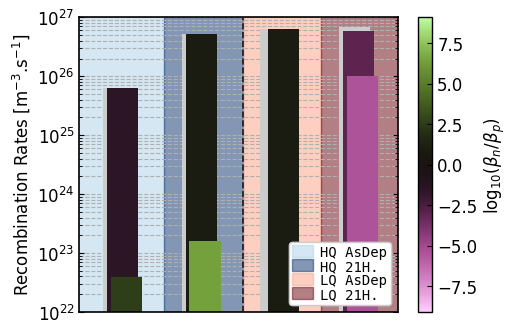

In [ ]:
fig, ax = plt.subplots(1,1, figsize = (A4_width*0.6, A4_height/3.5))
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgba
plt.rcParams["svg.fonttype"] = "none"
mpl.rcParams["hatch.linewidth"] = 0.5

blues = plt.get_cmap("Blues", 4)
reds = plt.get_cmap("Reds", 4)

def plot_stacked(ax, xpos, array, labels = None, color = None):
    if color is None:
        color = ["#009E73", "#CC79A7","#E69F00","#A42F54",]
    ax.bar(xpos, np.sum(array), label="Total", color = "0.8")

    if labels is None:
        labels = np.zeros_like(array)
    for j, (y, lab) in enumerate(zip(array, labels)):
        if (lab):
            ax.bar(xpos+0.1*(1+j), y, label=lab, color = color[j])
        else:   
            ax.bar(xpos+0.1*(1+j), y, color = color[j])

for i, (rate, cn_cp, color) in enumerate(zip(rates, cn_cps, colors)):
    ax.scatter(cn_cp, rate, marker = "x")
    #plot_stacked(ax, 0+2*i, rate, color=color)

axisTicks_fontsize = 12
legend_fontsize = 10

ax.tick_params(axis='x', labelsize=axisTicks_fontsize)
ax.tick_params(axis='y', labelsize=axisTicks_fontsize)

xmin, xmax = ax.get_xlim()
xmid = 1.55
ax.axvspan(-1.1, 1.15, color=to_rgba(blues(1), 0.5), zorder=0, label = 'HQ AsDep', edgecolor=to_rgba("Black", 0.5))
ax.axvspan(1.15, 3.15, color=to_rgba(blues(3), 0.5), zorder=0, label = 'HQ 21H.', edgecolor=to_rgba("Black", 0.5))
ax.axvspan(3.15, 5.15, color=to_rgba(reds(1), 0.5), zorder=0, label = 'LQ AsDep', edgecolor=to_rgba("Black", 0.5))
ax.axvspan(5.15, 10, color=to_rgba(reds(3), 0.5), zorder=0, label = 'LQ 21H.', edgecolor=to_rgba("Black", 0.5))
ax.axvline(3.15, color="0.1", lw=1.2, ls="--", zorder=5)

ax.grid(visible = True, which = 'both', linestyle = '--')
ax.set_xticklabels([])
ax.set_xticks([])
ax.set_yscale("log")
ax.set_xlim([-1, 7.1])
xmin, xmax = ax.get_xlim()

#ax.set_ylim([1.0, 1.3])
#ax.set_yticks(ax.get_yticks()[::2]) 
ax.set_ylabel(r"Recombination Rates [m$^{-3}$.s$^{-1}$]", size=axisTicks_fontsize)
# leg = ax.legend(borderpad=0.25, labelspacing=0.0, handletextpad=0, loc = 'lower center', 
#             prop={'family': 'monospace', "size": legend_fontsize}, frameon=True, framealpha=1)

# after you plotted everything
handles, labels = ax.get_legend_handles_labels()
h1, l1 = handles[:4], labels[:4]
h2, l2 = handles[4:], labels[4:]

leg1 = ax.legend(h1, l1, borderpad=0.25, labelspacing=0.0, handletextpad=0, loc = 'lower right', 
            prop={'family': 'monospace', "size": legend_fontsize}, frameon=True, framealpha=1)
ax.add_artist(leg1)  # keep it

# leg2 = ax.legend(h2, l2, borderpad=0.25, labelspacing=0.0, handletextpad=0, loc = 'lower left', 
#             prop={'family': 'monospace', "size": legend_fontsize}, frameon=True, framealpha=1)

for l in [leg1, leg2]:
    for h in l.legend_handles:
        try:
            h.set_height(8)   # points (works for Patch-like handles)
            h.set_width(15)
        except Exception:
            pass

w_frame = 1.2
ax.spines["bottom"].set_linewidth(w_frame)
ax.spines["top"].set_linewidth(w_frame)
ax.spines["left"].set_linewidth(w_frame)
ax.spines["right"].set_linewidth(w_frame)

cmap = mpl.cm.get_cmap("vanimo")   # e.g. "RdBu_r"
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])                   # older Matplotlib needs this
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label(r'log$_{10}$($\beta_n$/$\beta_p$)', fontsize=axisTicks_fontsize)
cbar.ax.tick_params(labelsize=axisTicks_fontsize)

# ticks_ratio = np.array([1e-5, 1e-3, 1, 1e1])
# cbar.set_ticks(np.log10(ticks_ratio))
# cbar.set_ticklabels([f"{t:.0e}" for t in ticks_ratio])

ax.set_ylim([1e22, 1e27])
ax.set_axisbelow(True)

#export_svg(fig, "/media/qrb/0726-A615/LastVersion/Reviews/Graphs/Fig3_CaptureRates_new.svg", margin_mm = (18, 5, 7, 5), width_in = fig.get_figwidth(), height_in=fig.get_figheight())#

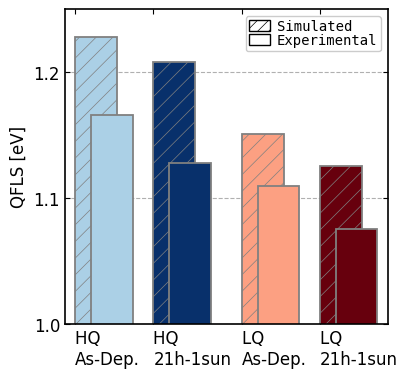

In [669]:
from matplotlib.colors import to_rgba
import matplotlib.patches as mpatches

labels2 = ['HQ \nAs-Dep.', 'HQ \n21h-1sun', 'LQ \nAs-Dep.', 'LQ \n21h-1sun']

fig, ax = plt.subplots(1,1, figsize = (A4_width*0.5, A4_height/3))
fig.subplots_adjust(wspace=0.35)
blues = plt.get_cmap("Blues", 4)
reds = plt.get_cmap("Reds", 4)

ax.bar(1  , (analysis_run2traps.QFLSs[0]), alpha=1,color = blues(1), hatch = '//', edgecolor="0.5", linewidth=1.3)
ax.bar(1.3  , (1.166 ), alpha=1,color = blues(1), label = "HQ As-Dep. ", edgecolor="0.5", linewidth=1.3)

ax.bar(2.5, (analysis_run2traps.QFLSs[1]), alpha=1,color = blues(3), hatch = '//', edgecolor="0.5", linewidth=1.3)
ax.bar(2.8, (1.128 ), alpha=1,color = blues(3), label = "HQ 21h Irr.", edgecolor="0.5", linewidth=1.3)

ax.bar(4.2  , (analysis_run2traps.QFLSs[2]), alpha=1,color = reds(1), hatch = '//', edgecolor="0.5", linewidth=1.3)
ax.bar(4.5  , (1.11), alpha=1,color = reds(1), label = "LQ As-Dep. ", edgecolor="0.5", linewidth=1.3)

ax.bar(5.7, (analysis_run2traps.QFLSs[3]), alpha=1,color = reds(3), hatch = '//', edgecolor="0.5", linewidth=1.3)
ax.bar(6.0, (1.076), alpha=1,color = reds(3), label = "LQ 21h Irr.", edgecolor="0.5", linewidth=1.3)

axisTicks_fontsize = 12
legend_fontsize = 10
# for i, a in enumerate(ax):
ax.tick_params(axis='x', labelsize=axisTicks_fontsize)
ax.tick_params(axis='y', labelsize=axisTicks_fontsize)
ax.grid(visible = True, which = 'both', axis = 'y', linestyle = '--')

xmin, xmax = ax.get_ylim()
xmid = 0.5 * (xmin + xmax)
# ax.axhspan(-1.0, xmid, color=to_rgba("grey", 0.8), zorder=0, label = 'Simulation')
# ax.axhspan(xmid, 7, color=to_rgba("grey", 0.1), zorder=0, label = 'Experiment')

ax.set_xticklabels([])
ax.set_xticks([])
ax.set_xlim([0.4, 6.6])
ax.set_ylim([1.0, 1.25])
ax.set_yticks(ax.get_yticks()[::2]) 
ax.set_ylabel(r"QFLS [eV]", size=axisTicks_fontsize)
#ax.tick_params(axis="x", bottom=False, labeltop=True, labelbottom=False, top=True)
#ax.xaxis.set_label_position("top")

leg1 = ax.legend(borderpad=0.25, labelspacing=0.0, handletextpad=0, loc = 'upper right', 
            prop={'family': 'monospace', "size": legend_fontsize}, frameon=True, framealpha=1, bbox_to_anchor=(1,0.89))

# ax.add_artist(leg1) 

hatched = mpatches.Patch(facecolor="white", edgecolor="black", hatch="///", label="Simulated")
plain   = mpatches.Patch(facecolor="white", edgecolor="black", hatch=None,   label="Experimental")

leg2 = ax.legend(handles=[hatched, plain],borderpad=0.25, labelspacing=0.0, handletextpad=0, loc = 'upper right', 
            prop={'family': 'monospace', "size": legend_fontsize}, frameon=True, framealpha=1)

for leg in [leg2]:
    for h in leg.legend_handles:
        try:
            h.set_height(8)   # points (works for Patch-like handles)
            h.set_width(15)
        except Exception:
            pass

ax.set_xticks([0.6, 2.1, 3.8, 5.3])
ax.set_xticklabels(labels2, ha='left')

w_frame = 1.2
ax.spines["bottom"].set_linewidth(w_frame)
ax.spines["top"].set_linewidth(w_frame)
ax.spines["left"].set_linewidth(w_frame)
ax.spines["right"].set_linewidth(w_frame)

ax.set_axisbelow(True)

#fig.savefig("/media/qrb/0726-A615/LastVersion/Reviews/Graphs/Fig3_QFLS.svg", dpi = 300)
analysis_run2traps.export_svg(fig, "/media/qrb/0726-A615/LastVersion/Reviews/Graphs/Fig3_QFLS_new.svg", margin_mm = (16, 5, 7, 14), width_in = fig.get_figwidth(), height_in=fig.get_figheight(), wspace=0.05)#

Constant Gen, setting dimensionless to False


Constant Gen, setting dimensionless to False
Constant Gen, setting dimensionless to False
Constant Gen, setting dimensionless to False


/tmp/ipykernel_4811/3837044811.py:590: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_4811/3837044811.py:699: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



([array([9.37339444e+22, 6.13636620e+25, 2.76111020e+24, 3.60579154e+24]),
  array([9.70192135e+21, 2.19617298e+26, 1.29670333e+19, 1.75839355e+23,
         2.08058345e+20]),
  array([6.09243453e+22, 5.56059305e+26, 1.29894986e+23]),
  array([1.48385440e+23, 3.97783405e+26, 6.93046410e+23, 2.23544538e+18,
         1.98950546e+26])],
 [array([[0.74458 , 0.99141 , 0.64748 , 1.      ],
         [0.1029  , 0.10702 , 0.066853, 1.      ],
         [0.25656 , 0.35337 , 0.12202 , 1.      ],
         [0.12091 , 0.077161, 0.098724, 1.      ]]),
  array([[0.79123 , 0.45283 , 0.72522 , 1.      ],
         [0.42282 , 0.16773 , 0.36585 , 1.      ],
         [0.11267 , 0.077278, 0.090344, 1.      ],
         [0.69929 , 0.34481 , 0.62496 , 1.      ],
         [0.13196 , 0.16584 , 0.075451, 1.      ]]),
  array([[0.64445 , 0.86503 , 0.47168 , 1.      ],
         [0.11042 , 0.077557, 0.087858, 1.      ],
         [0.11059 , 0.12561 , 0.06849 , 1.      ]]),
  array([[0.29805 , 0.12097 , 0.25631 , 1.     

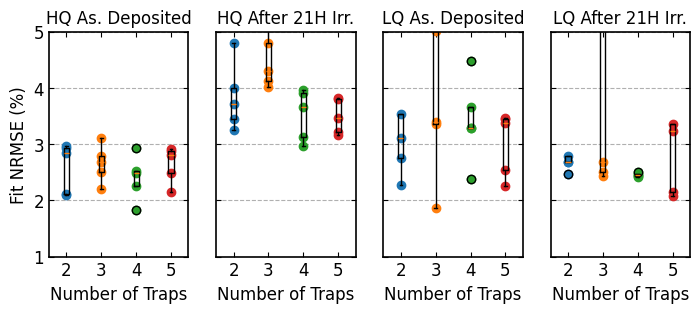

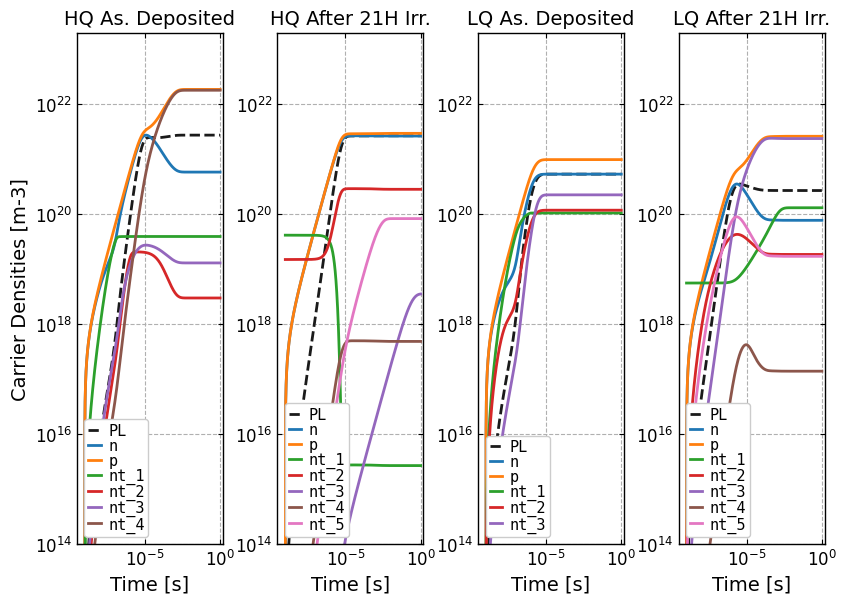

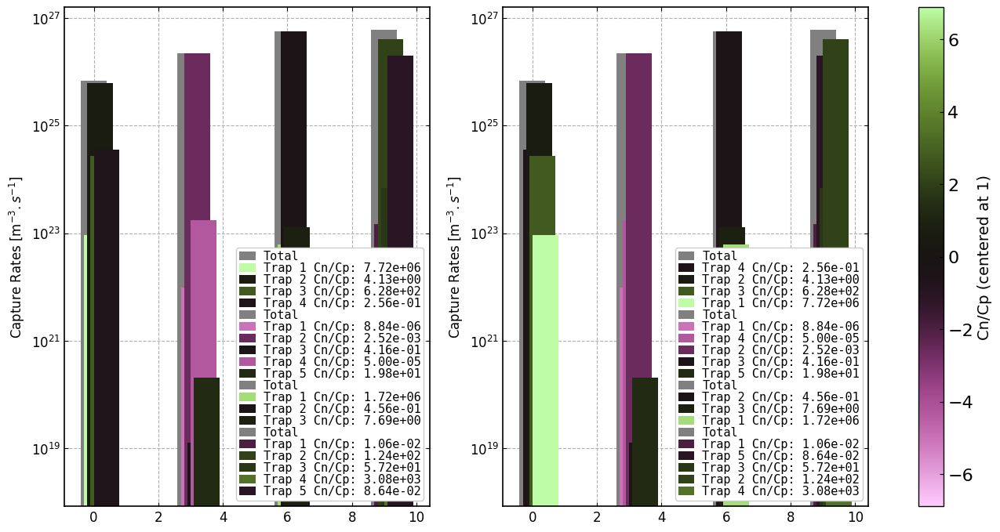

In [308]:
condition = [r"2Q3Before", r"2Q3After", r"3Q2Before", r"3Q2After"]
labels = ["HQ As. Deposited", "HQ After 21H Irr.", "LQ As. Deposited", "LQ After 21H Irr."]
folderpath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope"
analysis_run = analyse_full_Run(folderpath, condition, N_RUNS=5)
analysis_run.plot_statistics_fromallruns(labels = labels)
analysis_run.calc_densities_fromParams(G = 1.0, labels = labels, steadyStateG=5.2e20)
analysis_run.plot_rates(cmap_name="vanimo")

0.02093250549612415
0.03252666511579854
0.022722616646249215
0.024639160339804882


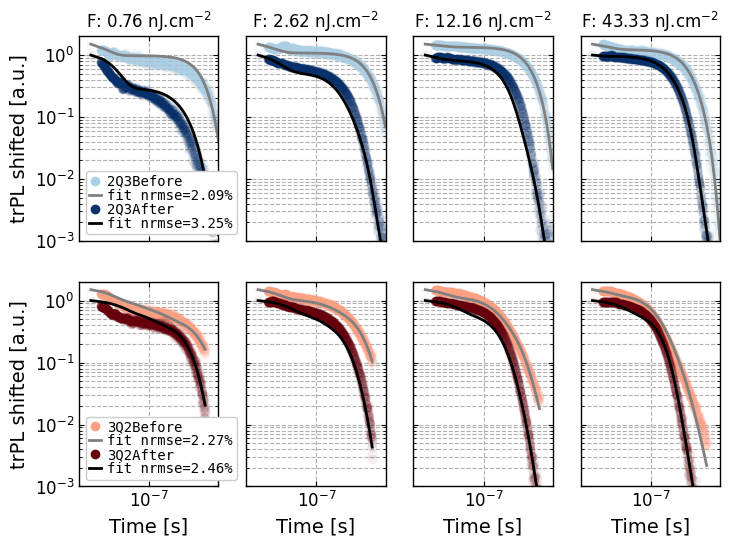

In [105]:
analysis_run2traps.plot_resultingFits(trPLs3Q2_before)

yea
C_n_1 C_p_1
C_n_1 C_p_1
C_n_2 C_p_2
C_n_2 C_p_2
yea
C_n_1 C_p_1
C_n_1 C_p_1
C_n_2 C_p_2
C_n_2 C_p_2


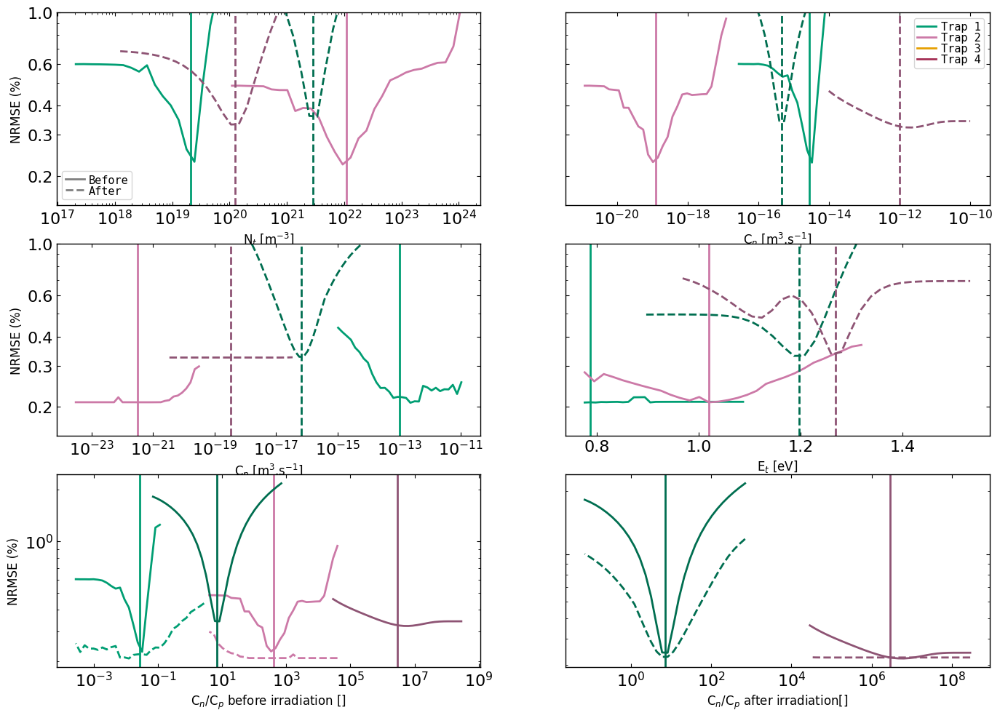

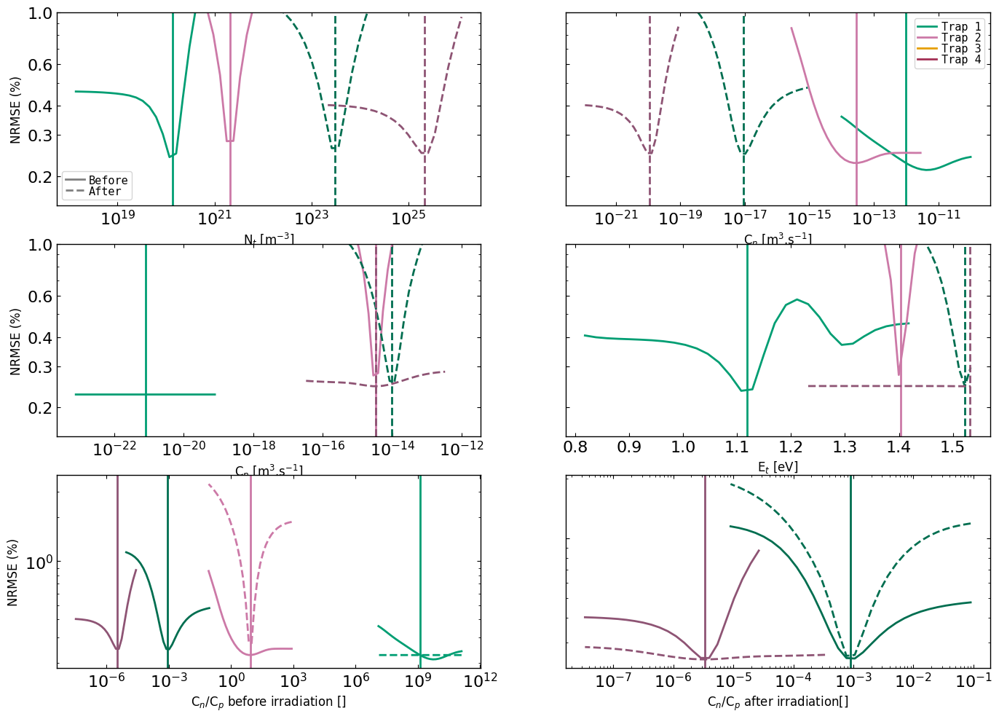

yea
C_n_1 C_p_1
C_n_1 C_p_1
C_n_2 C_p_2
C_n_2 C_p_2
yea
C_n_1 C_p_1
C_n_1 C_p_1
C_n_2 C_p_2
C_n_2 C_p_2


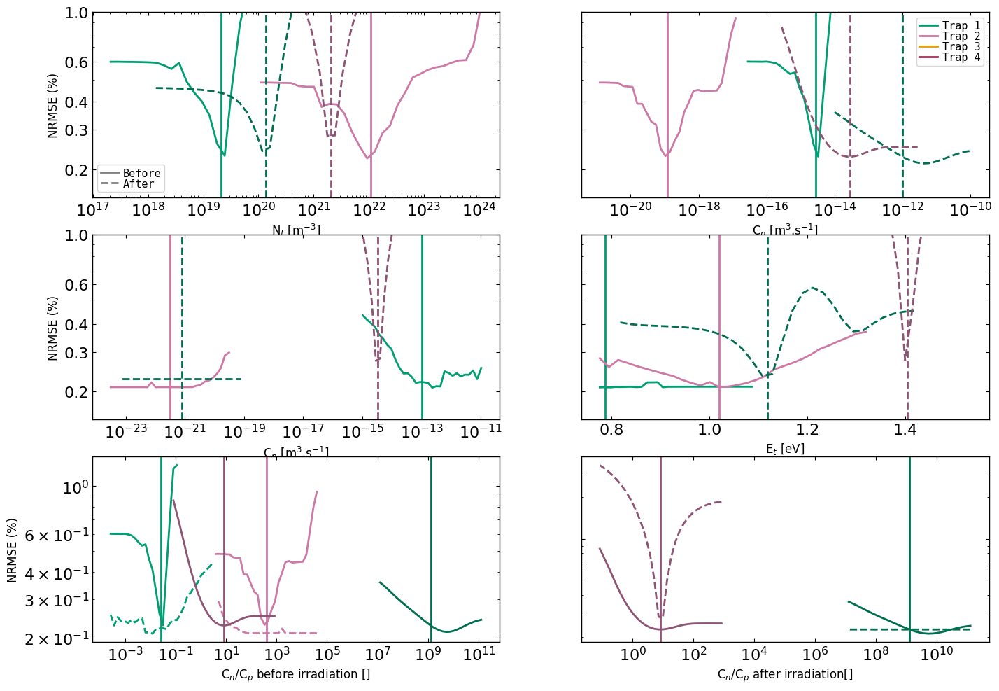

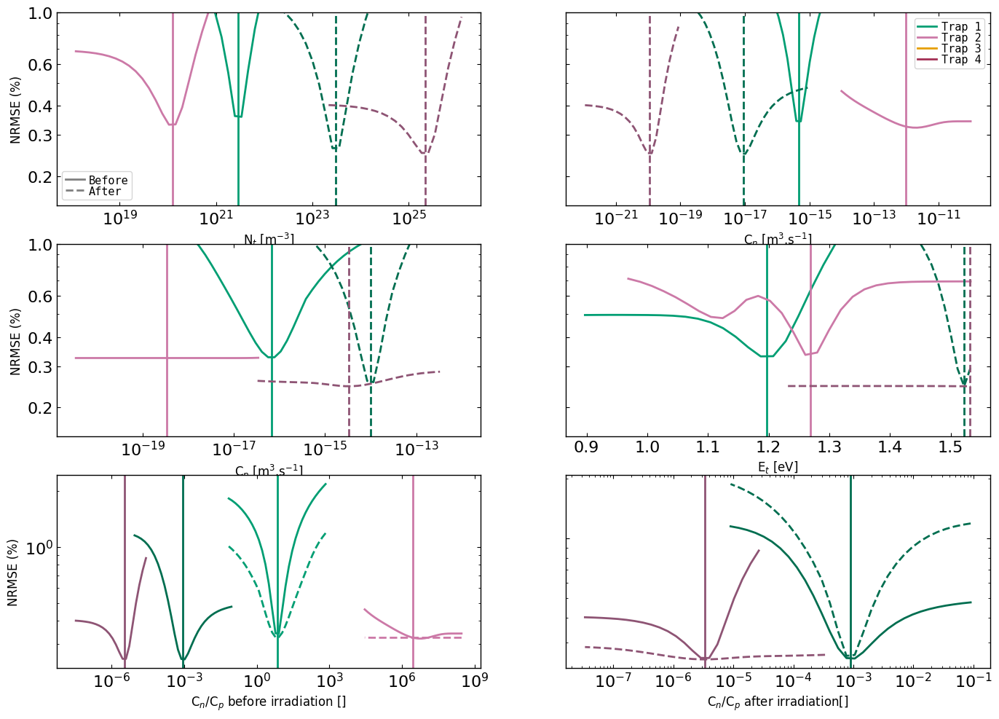

In [119]:
file_list = [
   r"nrmses_vals_2Q3Before_fromBestFits2traps_run8_30points.pickle",
   r"nrmses_vals_3Q2Before_fromBestFits2traps_run8_30points.pickle",
    r"nrmses_vals_2Q3After_fromBestFits2traps_run8_30points.pickle",
   r"nrmses_vals_3Q2After_fromBestFits2traps_run8_30points.pickle",
]

condition = [ r"2Q3Before",r"3Q2Before",r"2Q3After", r"3Q2After"]

analysis_run2traps.import_paramVars_andPlot(r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/PramVariation", filenames_list=file_list, samplename_list=condition)

yea
C_n_1 C_p_1
C_n_1 C_p_1
C_n_2 C_p_2
C_n_2 C_p_2
yea
C_n_1 C_p_1
C_n_1 C_p_1
C_n_2 C_p_2
C_n_2 C_p_2


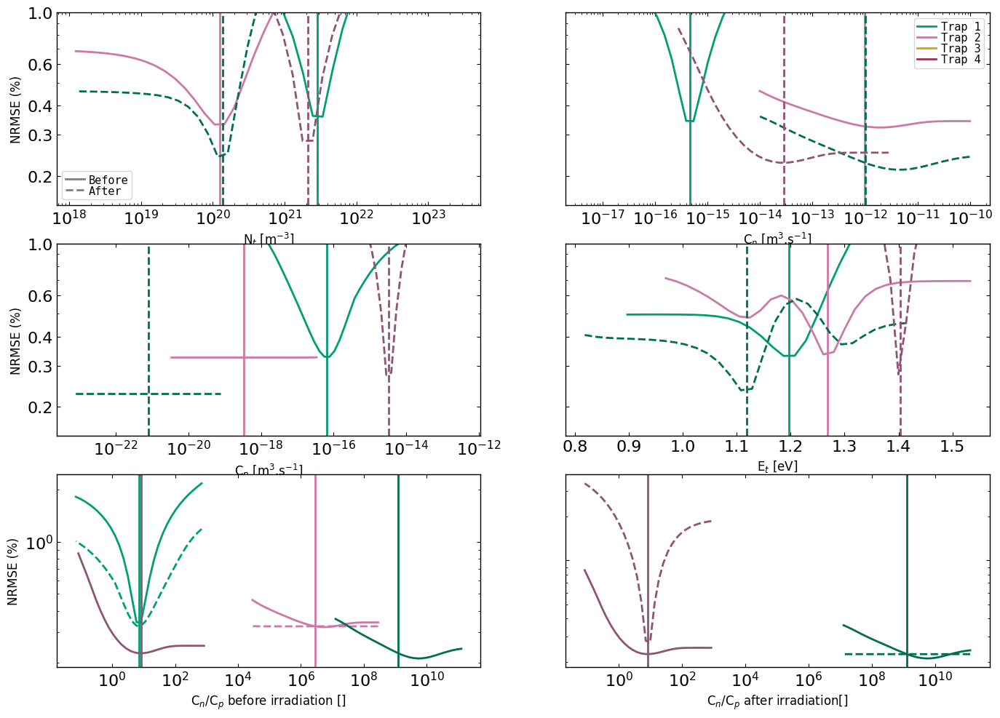

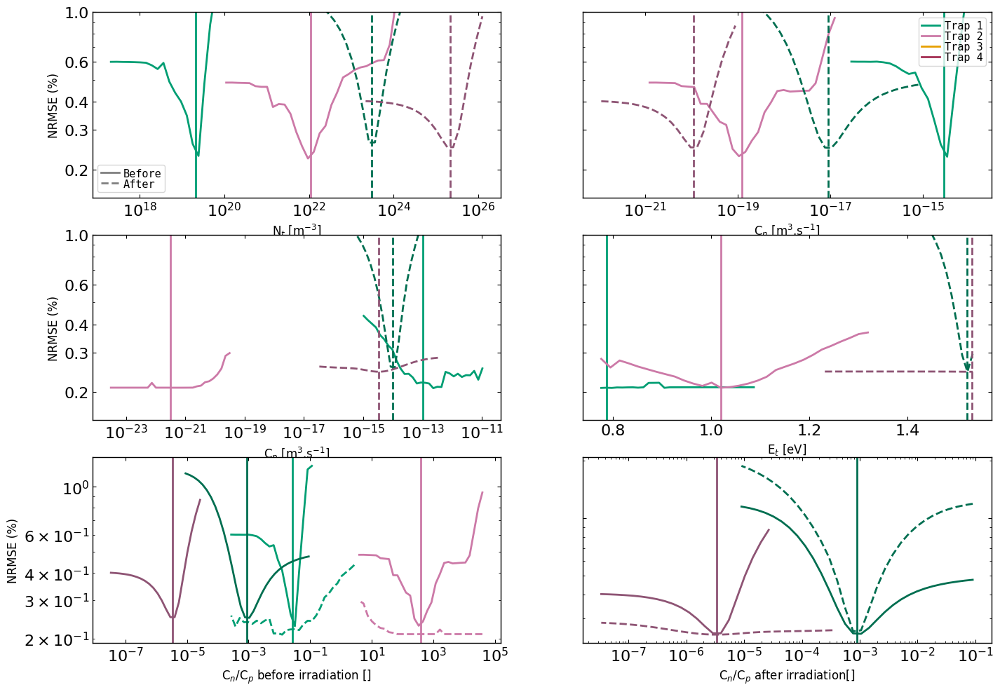

In [118]:
file_list = [
   r"nrmses_vals_2Q3After_fromBestFits2traps_run8_30points.pickle",
   r"nrmses_vals_3Q2Before_fromBestFits2traps_run8_30points.pickle",
    r"nrmses_vals_2Q3Before_fromBestFits2traps_run8_30points.pickle",
   r"nrmses_vals_3Q2After_fromBestFits2traps_run8_30points.pickle",
]

condition = [ r"2Q3After", r"3Q2Before",r"2Q3Before", r"3Q2After"]

analysis_run2traps.import_paramVars_andPlot(r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/PramVariation", filenames_list=file_list, samplename_list=condition)

In [346]:
analysis_run2traps.calc_densities_fromParams(G = 1.0, labels = labels, equilibrate = False)

TypeError: analyse_full_Run.calc_densities_fromParams() got an unexpected keyword argument 'equilibrate'

Constant Gen, setting dimensionless to False
Constant Gen, setting dimensionless to False
Constant Gen, setting dimensionless to False
Constant Gen, setting dimensionless to False


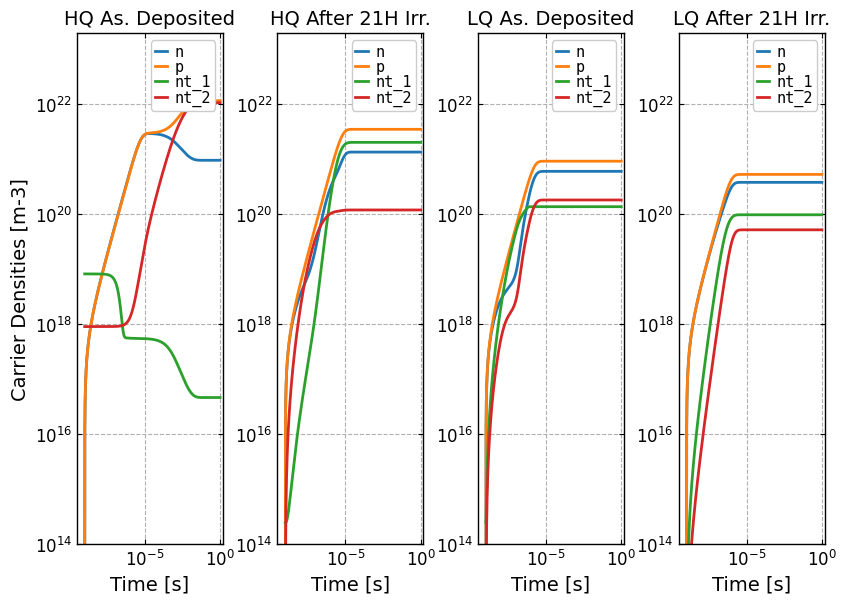

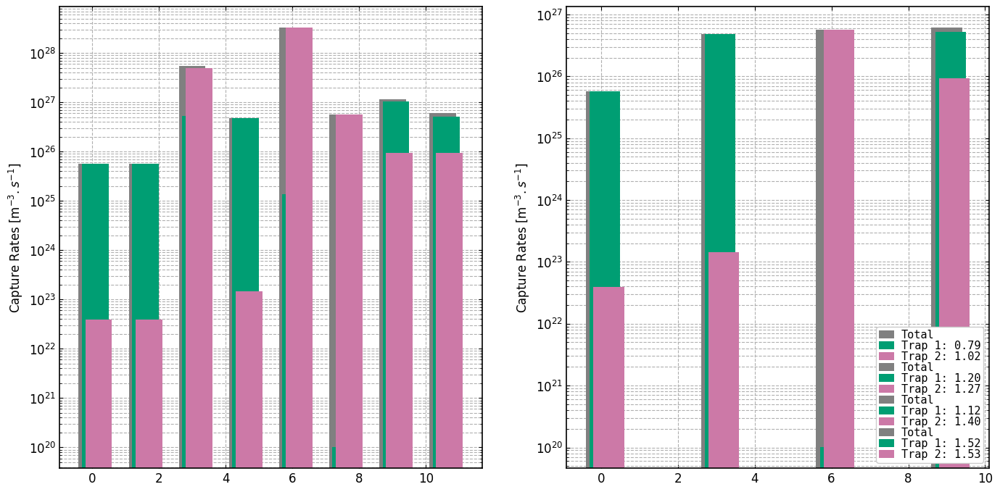

In [156]:
import matplotlib.pyplot as plt

def export_svg(fig, path, *,
               width_in, height_in,
               margin_mm=(22, 5, 5, 5),  # L, T, R, B in mm
               wspace=0.05, hspace=0.05):
    """
    Export fig to SVG with a fixed canvas size and physical margins.
    margin_mm = (left, top, right, bottom)
    """
    mm_per_in = 25.4
    L, T, R, B = [m / mm_per_in for m in margin_mm]  # inches
    fig.set_constrained_layout(False)
    fig.set_size_inches(width_in, height_in, forward=True)

    left   = L / width_in
    right  = 1 - (R / width_in)
    bottom = B / height_in
    top    = 1 - (T / height_in)

    fig.subplots_adjust(left=left, right=right, bottom=bottom, top=top, wspace=wspace, hspace=hspace)
    fig.canvas.draw()
    fig.savefig(path, format="svg", dpi =300)  # no bbox_inches="tight"


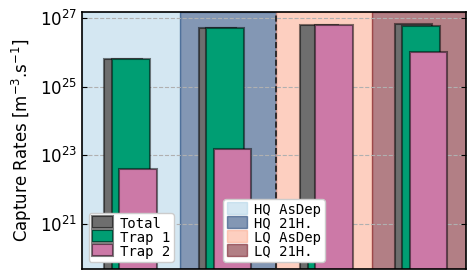

In [238]:
fig, ax = plt.subplots(1,1, figsize = (A4_width*0.6, A4_height/3.5))
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgba
plt.rcParams["svg.fonttype"] = "none"
mpl.rcParams["hatch.linewidth"] = 0.5
for i, (n, p, nts, param) in enumerate(zip(ns, ps, nts_all, params)):

    L = 800e-9
    x = np.linspace(0, L, num = 100)
    Nc = Nv = 2e24
    kT = 0.0257
    Eg = 1.553 #FAPI
    ni2 = Nc*Nv*np.exp(-Eg/kT)
    #ax[i].loglog(t_span, np.trapezoid(n, x = x, axis =1)/L)
    #ax[i].loglog(t_span, np.trapezoid(p, x = x, axis =1)/L)

    n_ave = np.trapezoid(n, x = x, axis =1)/L
    p_ave = np.trapezoid(p, x = x, axis =1)/L
    nts_ave = np.trapezoid(nts, x = x, axis =1)/L

    n_end = n_ave[-1] 
    p_end = p_ave[-1] 
    nts_end = nts_ave[:, -1]

    ncaps_end = np.zeros_like(nts_end)
    nemis_end = np.zeros_like(nts_end)
    pcaps_end = np.zeros_like(nts_end)
    pemis_end = np.zeros_like(nts_end)
    for j, nt_end in enumerate(nts_end):
        ncaps_end[j] = param[f'C_n_{j+1:d}']* n_end * (param[f'N_t_bulk_{j+1:d}'] - nt_end)
        pcaps_end[j] = param[f'C_p_{j+1:d}']* p_end * nt_end

        nemis_end[j] = param[f'C_n_{j+1:d}']* nt_end * Nc * np.exp(-(Eg - param[f'E_t_bulk_{j+1:d}'])/kT)
        pemis_end[j] = param[f'C_p_{j+1:d}']* (param[f'N_t_bulk_{j+1:d}'] - nt_end) * Nv * np.exp(-(param[f'E_t_bulk_{j+1:d}'])/kT)

    
    def plot_stacked(ax, xpos, array, labels = None, color = None, hatch = None, edge_color = None, w = 1):
        if color is None:
            color = ["#009E73", "#CC79A7","#E69F00",]
        
        if labels is None:
            labels = np.zeros_like(array)
            ax.bar(xpos, np.sum(array), color = "#6E6E6E", hatch = hatch, edgecolor = edge_color, linewidth=1.5, width = w)
        else:
            ax.bar(xpos, np.sum(array), label="Total", color = "#6E6E6E", hatch = hatch, edgecolor = edge_color, linewidth=1.5, width = w)

        for i, (y, lab) in enumerate(zip(array, labels)):
            if (lab):
                ax.bar(xpos+0.2*(1+i), y, label=lab, color = color[i], hatch = hatch, edgecolor = edge_color, linewidth=1.5, width = w)
            else:
                ax.bar(xpos+0.2*(1+i), y, color = color[i], hatch = hatch, edgecolor = edge_color, linewidth=1.5, width = w)

            # for box in bp["boxes"]:
            #     box.set_facecolor("white")     # fill
            #     box.set_edgecolor("crimson")   # <- hatch color (and box outline)
            #     box.set_hatch("///")
            #     box.set_linewidth(1.2)


    def reorder_wCaptureRates(array, params):
        cns_over_cps = np.zeros_like(array)
        for i in range(3):
            cns_over_cps[i] = params[f'C_n_{i+1:d}']/params[f'C_p_{i+1:d}']
        idx = np.argsort(cns_over_cps)
        print(cns_over_cps, idx)

        return array[idx]

    #legend = np.array([f"Trap 1: {param[f'E_t_bulk_1']:.2f}", f"Trap 2: {param[f'E_t_bulk_2']:.2f}", f"Trap 3: {param[f'E_t_bulk_3']:.2f}"])
    legend = np.array([f"Trap 1", f"Trap 2", f"Trap 3"])
    if (i < 2 and not(i)):
        plot_stacked(ax, 2.5*i, np.minimum(ncaps_end,pcaps_end), legend, edge_color=to_rgba("Black", 0.5))
    elif(i<2):
        plot_stacked(ax, 2.5*i, np.minimum(ncaps_end,pcaps_end), edge_color=to_rgba("Black", 0.5))
    else:
        plot_stacked(ax, 0.2+2.5*i, np.minimum(ncaps_end,pcaps_end), edge_color=to_rgba("Black", 0.5))


axisTicks_fontsize = 12
legend_fontsize = 10

ax.tick_params(axis='x', labelsize=axisTicks_fontsize)
ax.tick_params(axis='y', labelsize=axisTicks_fontsize)

xmin, xmax = ax.get_xlim()
xmid = 1.55
ax.axvspan(-1.1, 1.5, color=to_rgba(blues(1), 0.5), zorder=0, label = 'HQ AsDep', edgecolor=to_rgba("Black", 0.5))
ax.axvspan(1.5, 4.05, color=to_rgba(blues(3), 0.5), zorder=0, label = 'HQ 21H.', edgecolor=to_rgba("Black", 0.5))
ax.axvspan(4.05, 6.6, color=to_rgba(reds(1), 0.5), zorder=0, label = 'LQ AsDep', edgecolor=to_rgba("Black", 0.5))
ax.axvspan(6.6, 10, color=to_rgba(reds(3), 0.5), zorder=0, label = 'LQ 21H.', edgecolor=to_rgba("Black", 0.5))

ax.grid(visible = True, which = 'both', linestyle = '--')
ax.set_xticklabels([])
ax.set_xticks([])
ax.set_yscale("log")
ax.set_xlim([-1.1, 9.1])
xmin, xmax = ax.get_xlim()
ax.axvline(4.05, color="0.1", lw=1.2, ls="--", zorder=5)
#ax.set_ylim([1.0, 1.3])
#ax.set_yticks(ax.get_yticks()[::2]) 
ax.set_ylabel(r"Capture Rates [m$^{-3}$.s$^{-1}$]", size=axisTicks_fontsize)
# leg = ax.legend(borderpad=0.25, labelspacing=0.0, handletextpad=0, loc = 'lower center', 
#             prop={'family': 'monospace', "size": legend_fontsize}, frameon=True, framealpha=1)

# after you plotted everything
handles, labels = ax.get_legend_handles_labels()
h1, l1 = handles[:4], labels[:4]
h2, l2 = handles[4:], labels[4:]

leg1 = ax.legend(h1, l1, borderpad=0.25, labelspacing=0.0, handletextpad=0, loc = 'lower center', 
            prop={'family': 'monospace', "size": legend_fontsize}, frameon=True, framealpha=1)
ax.add_artist(leg1)  # keep it

leg2 = ax.legend(h2, l2, borderpad=0.25, labelspacing=0.0, handletextpad=0, loc = 'lower left', 
            prop={'family': 'monospace', "size": legend_fontsize}, frameon=True, framealpha=1)

for l in [leg1, leg2]:
    for h in l.legend_handles:
        try:
            h.set_height(8)   # points (works for Patch-like handles)
            h.set_width(15)
        except Exception:
            pass

w_frame = 1.2
ax.spines["bottom"].set_linewidth(w_frame)
ax.spines["top"].set_linewidth(w_frame)
ax.spines["left"].set_linewidth(w_frame)
ax.spines["right"].set_linewidth(w_frame)

ax.set_axisbelow(True)

#export_svg(fig, "/media/qrb/0726-A615/LastVersion/Reviews/Graphs/Fig3_CaptureRates_new.svg", margin_mm = (20, 5, 5, 5), width_in = fig.get_figwidth(), height_in=fig.get_figheight())#

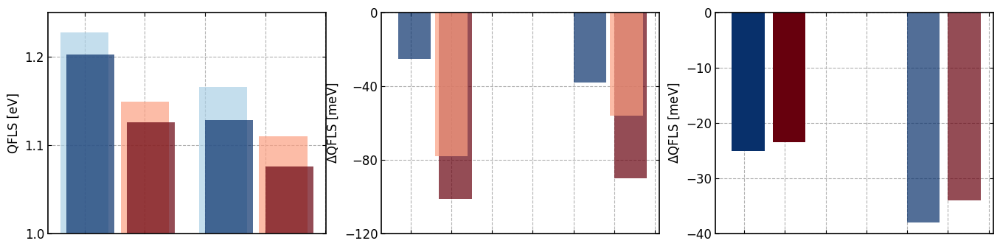

In [134]:
fig, ax = plt.subplots(1,3, figsize = (2*A4_width, A4_height/3))
blues = plt.get_cmap("Blues", 4)
reds = plt.get_cmap("Reds", 4)

ax[0].bar(1  , (QFLSs[0]), alpha=0.7,color = blues(1), label = "High Q As Deposited")
ax[0].bar(1.1, (QFLSs[1]), alpha=0.7,color = blues(3), label = "High Q 21H Irr.")
ax[0].bar(2  , (QFLSs[2]), alpha=0.7,color = reds(1), label = "Low Q As Deposited")
ax[0].bar(2.1, (QFLSs[3]), alpha=0.7,color = reds(3), label = "Low Q 21H Irr.")

ax[0].bar(3.3  , (1.166 ), alpha=0.7,color = blues(1), label = "High Q As Deposited")
ax[0].bar(3.4, (1.128 ), alpha=0.7,color = blues(3), label = "High Q 21H Irr.")
ax[0].bar(4.3  , (1.11), alpha=0.7,color = reds(1), label = "Low Q As Deposited")
ax[0].bar(4.4, (1.076), alpha=0.7,color = reds(3), label = "Low Q 21H Irr.")


ax[1].bar(1.1, 1000*(QFLSs[1]-QFLSs[0]), alpha=0.7,color = blues(3), label = "High Q 21H Irr.")
ax[1].bar(1  , 1000*(QFLSs[0]-QFLSs[0]), alpha=0.7,color = blues(1), label = "High Q As Deposited")
ax[1].bar(2.1, 1000*(QFLSs[3]-QFLSs[0]), alpha=0.7,color = reds(3), label = "Low Q 21H Irr.")
ax[1].bar(2  , 1000*(QFLSs[2]-QFLSs[0]), alpha=0.7,color = reds(1), label = "Low Q As Deposited")

# ax[1].bar(3.4, 1000*(-dQFLS_2Q3[-1]), alpha=0.7,color = blues(3), label = "High Q 21H Irr.")
# ax[1].bar(4.4, 1000*(-dQFLS_big-dQFLS_3Q2[-1]), alpha=0.7,color = reds(3), label = "Low Q 21H Irr.")
# ax[1].bar(4.3  , 1000*(-dQFLS_big), alpha=0.7,color = reds(1), label = "Low Q As Deposited")

ax[1].bar(5.3  , 1000*(1.166 - 1.166), alpha=0.7,color = blues(1), label = "High Q As Deposited")
ax[1].bar(5.4, 1000*(1.128 - 1.166), alpha=0.7,color = blues(3), label = "High Q 21H Irr.")
ax[1].bar(6.4, 1000*(1.076- 1.166), alpha=0.7,color = reds(3), label = "Low Q 21H Irr.")
ax[1].bar(6.3  , 1000*(1.11- 1.166), alpha=0.7,color = reds(1), label = "Low Q As Deposited")

ax[2].bar(1.1, 1000*(QFLSs[1]-QFLSs[0]), alpha=1,color = blues(3), label = "High Q 21H Irr.")
ax[2].bar(1  , 1000*(QFLSs[0]-QFLSs[0]), alpha=1,color = blues(1), label = "High Q As Deposited")
ax[2].bar(2.1, 1000*(QFLSs[3]-QFLSs[2]), alpha=1,color = reds(3), label = "Low Q 21H Irr.")
ax[2].bar(2  , 1000*(QFLSs[2]-QFLSs[2]), alpha=1,color = reds(1), label = "Low Q As Deposited")

# ax[2].bar(3.4, 1000*(-dQFLS_2Q3[-1]), alpha=0.8,color = blues(3), label = "High Q 21H Irr.")
# ax[2].bar(4.4, 1000*(-dQFLS_3Q2[-1]), alpha=0.8,color = reds(3), label = "Low Q 21H Irr.")

ax[2].bar(5.3  , 1000*(1.166 - 1.166), alpha=0.7,color = blues(1), label = "High Q As Deposited")
ax[2].bar(5.4, 1000*(1.128 - 1.166), alpha=0.7,color = blues(3), label = "High Q 21H Irr.")
ax[2].bar(6.4, 1000*(1.076- 1.11), alpha=0.7,color = reds(3), label = "Low Q 21H Irr.")
ax[2].bar(6.3  , 1000*(1.11- 1.11), alpha=0.7,color = reds(1), label = "Low Q As Deposited")


#ax.set_ylim([1.0, 1.3])

#ax.legend(fontsize = 10)

for i, a in enumerate(ax):
    a.tick_params(axis='x', labelsize=axisTicks_fontsize)
    a.tick_params(axis='y', labelsize=axisTicks_fontsize)
    a.grid(visible = True, which = 'both', linestyle = '--')
    
    a.set_xticklabels([])
    if not(i):
        a.set_ylim([1.0, 1.25])
        a.set_yticks(a.get_yticks()[::2]) 
        a.set_ylabel(r"QFLS [eV]", size=axisTicks_fontsize)
    else:
        a.set_yticks(a.get_yticks()[::2]) 
        a.set_ylabel(r"$\Delta$QFLS [meV]", size=axisTicks_fontsize)

    w_frame = 1.2
    a.spines["bottom"].set_linewidth(w_frame)
    a.spines["top"].set_linewidth(w_frame)
    a.spines["left"].set_linewidth(w_frame)
    a.spines["right"].set_linewidth(w_frame)

    a.set_axisbelow(True)

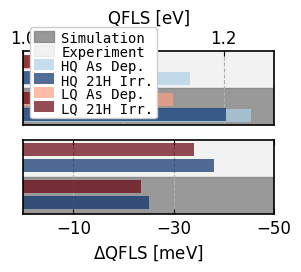

In [135]:
from matplotlib.colors import to_rgba

fig, ax = plt.subplots(2,1, figsize = (A4_width*0.4, A4_height/3.5))
fig.subplots_adjust(wspace=0.35)
blues = plt.get_cmap("Blues", 4)
reds = plt.get_cmap("Reds", 4)

ax[0].barh(1  , (QFLSs[0]), alpha=0.7,color = blues(1), label = "HQ As Dep. ")
ax[0].barh(1.1, (QFLSs[1]), alpha=0.7,color = blues(3), label = "HQ 21H Irr.")
ax[0].barh(2  , (QFLSs[2]), alpha=0.7,color = reds(1), label = "LQ As Dep. ")
ax[0].barh(2.1, (QFLSs[3]), alpha=0.7,color = reds(3), label = "LQ 21H Irr.")

ax[0].barh(3.3  , (1.166 ), alpha=0.7,color = blues(1))
ax[0].barh(3.4, (1.128 ), alpha=0.7,color = blues(3))
ax[0].barh(4.3  , (1.11), alpha=0.7,color = reds(1))
ax[0].barh(4.4, (1.076), alpha=0.7,color = reds(3))


ax[1].barh(1.1, 1000*(QFLSs[1]-QFLSs[0]), alpha=0.7,color = blues(3))
ax[1].barh(1  , 1000*(QFLSs[0]-QFLSs[0]), alpha=0.7,color = blues(1))
ax[1].barh(2.1, 1000*(QFLSs[3]-QFLSs[2]), alpha=0.7,color = reds(3))
ax[1].barh(2  , 1000*(QFLSs[2]-QFLSs[2]), alpha=0.7,color = reds(1))

# ax[1].barh(3.4, 1000*(-dQFLS_2Q3[-1]), alpha=0.7,color = blues(3), label = "High Q 21H Irr.")
# ax[1].barh(4.4, 1000*(-dQFLS_big-dQFLS_3Q2[-1]), alpha=0.7,color = reds(3))
# ax[1].barh(4.3  , 1000*(-dQFLS_big), alpha=0.7,color = reds(1))

ax[1].barh(3.3  , 1000*(1.166 - 1.166), alpha=0.7,color = blues(1))
ax[1].barh(3.4, 1000*(1.128 - 1.166), alpha=0.7,color = blues(3))
ax[1].barh(4.4, 1000*(1.076- 1.11), alpha=0.7,color = reds(3))
ax[1].barh(4.3  , 1000*(1.11- 1.11), alpha=0.7,color = reds(1))

# ax[2].bar(1.1, 1000*(QFLSs[1]-QFLSs[0]), alpha=1,color = blues(3), label = "High Q 21H Irr.")
# ax[2].bar(1  , 1000*(QFLSs[0]-QFLSs[0]), alpha=1,color = blues(1), label = "High Q As Deposited")
# ax[2].bar(2.1, 1000*(QFLSs[3]-QFLSs[2]), alpha=1,color = reds(3), label = "Low Q 21H Irr.")
# ax[2].bar(2  , 1000*(QFLSs[2]-QFLSs[2]), alpha=1,color = reds(1), label = "Low Q As Deposited")

# ax[2].bar(3.4, 1000*(-dQFLS_2Q3[-1]), alpha=0.8,color = blues(3), label = "High Q 21H Irr.")
# ax[2].bar(4.4, 1000*(-dQFLS_3Q2[-1]), alpha=0.8,color = reds(3), label = "Low Q 21H Irr.")

# ax[2].bar(5.3  , 1000*(1.166 - 1.166), alpha=0.7,color = blues(1), label = "High Q As Deposited")
# ax[2].bar(5.4, 1000*(1.128 - 1.166), alpha=0.7,color = blues(3), label = "High Q 21H Irr.")
# ax[2].bar(6.4, 1000*(1.076- 1.11), alpha=0.7,color = reds(3), label = "Low Q 21H Irr.")
# ax[2].bar(6.3  , 1000*(1.11- 1.11), alpha=0.7,color = reds(1), label = "Low Q As Deposited")


#ax.set_xlim([1.0, 1.3])

#ax.legend(fontsize = 10)
axisTicks_fontsize = 12
legend_fontsize = 10
for i, a in enumerate(ax):
    a.tick_params(axis='x', labelsize=axisTicks_fontsize)
    a.tick_params(axis='y', labelsize=axisTicks_fontsize)
    a.grid(visible = True, which = 'both', linestyle = '--')
    
    xmin, xmax = a.get_ylim()
    xmid = 0.5 * (xmin + xmax)
    a.axhspan(-1.0, xmid, color=to_rgba("grey", 0.8), zorder=0, label = 'Simulation')
    a.axhspan(xmid, 7, color=to_rgba("grey", 0.1), zorder=0, label = 'Experiment')

    a.set_yticklabels([])
    a.set_yticks([])
    a.set_ylim([0.4, 5])
    if not(i):
        a.set_xlim([1.0, 1.25])
        a.set_xticks(a.get_xticks()[::2]) 
        a.set_xlabel(r"QFLS [eV]", size=axisTicks_fontsize)
        a.tick_params(axis="x", bottom=False, labeltop=True, labelbottom=False, top=True)
        a.xaxis.set_label_position("top")

        leg = a.legend(borderpad=0.25, labelspacing=0.0, handletextpad=0, loc = 'lower left', 
                    prop={'family': 'monospace', "size": legend_fontsize}, frameon=True, framealpha=1)
        for h in leg.legend_handles:
            try:
                h.set_height(8)   # points (works for Patch-like handles)
                h.set_width(15)
            except Exception:
                pass
    else:
        a.set_xlim([0, -50])
        a.set_xticks(a.get_xticks()[::2]) 
        a.set_xlabel(r"$\Delta$QFLS [meV]", size=axisTicks_fontsize)
        

    w_frame = 1.2
    a.spines["bottom"].set_linewidth(w_frame)
    a.spines["top"].set_linewidth(w_frame)
    a.spines["left"].set_linewidth(w_frame)
    a.spines["right"].set_linewidth(w_frame)

    a.set_axisbelow(True)

left   = 2.54 / 21
right  = 1 - 2.54 / 21
bottom = 2.54 / 9.9
top    = 1 - 2.54 / 9.9
fig.subplots_adjust(left=left, right=right, bottom=bottom, top=top, wspace=0.025)

#fig.savefig("/media/qrb/0726-A615/LastVersion/Reviews/Graphs/Fig3_QFLS.svg", dpi = 300)
#export_svg(fig, "/media/qrb/0726-A615/LastVersion/Reviews/Graphs/Fig3_QFLS.svg", margin_mm = (5, 12, 5, 12), width_in = fig.get_figwidth(), height_in=fig.get_figheight(), wspace=0.05)#

# Checking the a,b,c model

In [35]:
import importlib
import optimpv_github.RateEqfits.RateEqModel as RateEqModel_module
importlib.reload(RateEqModel_module)
DBTD_multi_trap = RateEqModel_module.DBTD_multi_trap
from collections import defaultdict
import matplotlib as mpl

class analyse_full_Run_abcModel:
    def __init__(self, folderpath, samples_order, N_RUNS, traps_sel = None, pat = None):
        self.A4_width =  8.27
        self.A4_height = 11.69
        self.folderpath = folderpath
        self.samples_order = samples_order
        self.runs, self.E, self.P, self.best_runs_dict = self.import_runs_andreturnBests(folderpath, samples_order, N_RUNS, traps_sel=traps_sel, pat = pat)

        self.bestDecays_run = []

    def export_svg(self, fig, path, *,
               width_in, height_in,
               margin_mm=(22, 5, 5, 5),  # L, T, R, B in mm
               wspace=0.05, hspace=0.05):
        """
        Export fig to SVG with a fixed canvas size and physical margins.
        margin_mm = (left, top, right, bottom)
        """
        mm_per_in = 25.4
        L, T, R, B = [m / mm_per_in for m in margin_mm]  # inches
        fig.set_constrained_layout(False)
        fig.set_size_inches(width_in, height_in, forward=True)

        left   = L / width_in
        right  = 1 - (R / width_in)
        bottom = B / height_in
        top    = 1 - (T / height_in)

        fig.subplots_adjust(left=left, right=right, bottom=bottom, top=top, wspace=wspace, hspace=hspace)
        fig.canvas.draw()
        fig.savefig(path, format="svg", dpi =300)  # no bbox_inches="tight"
        
    def import_runs_andreturnBests(self, folderpath, samples, N_RUNS, traps_sel = None, pat = None):
        
        if (pat == None):
            pat = re.compile(
            r'^(?P<run>\d+)-(?P<sample>.+?)-nrmse(?P<nrmse>\d+)-BTmodel-RateEqAgent\.pickle$',
            re.IGNORECASE
            )

        PARAM_KEYS = ["k_direct", "k_trap", "k_auger"]   
        
        def get_params_list_todict(obj):
            param_list = obj.params
            return {d.name: d.value for d in param_list}

        def extract_param_vector(params, trap_keys=PARAM_KEYS):
            """
            Returns shape (3, )
            """
            M = np.empty((len(trap_keys),), dtype=float)
            for t, key in enumerate(trap_keys):
                M[t] = float(params[key])
            return M

        # 1) index all runs first
        result_files = [f for f in os.listdir(folderpath) if "RateEq" in f]
        runs = defaultdict(dict)  # run[(sample, ntraps)][run] = (nrmse, path)

        for fn in result_files:
            m = pat.match(fn)
            if not m:
                continue

            run    = int(m.group("run"))
            sample = m.group("sample")
            nrmse  = int(m.group("nrmse")) / 10000

            path = os.path.join(folderpath, fn)
            with open(path, "rb") as f:
                RateEq = pickle.load(f)

            runs[sample][run] = (nrmse, path, RateEq)
        # 2) axes
        Ns = len(samples)
        # 3) allocate outputs
        E = np.full((Ns, N_RUNS), np.nan, dtype=float)                 # nrmse
        P = np.full((Ns, N_RUNS, len(PARAM_KEYS)), np.nan)   # padded params

        # 4) fill
        for si, s in enumerate(samples):
            for r in range(N_RUNS):
                if r not in runs.get(s, {}):
                    print('Failed for', s, r)
                    continue
            
                nrmse, path, RateEq = runs[s][r]
                E[si, r] = nrmse
                params = get_params_list_todict(RateEq)
                trap_mat = extract_param_vector(params)  
                P[si, r, :] = trap_mat

        best_run_list = {}
        for si, s in enumerate(samples):
            best_nrmse = float("inf")
            best = None

            # reps: dict {run_id: (nrmse, path, RateEq)}
            reps = runs.get(s, {})

            for r_rep, (nrmse, path, RateEq) in reps.items():
                # optional: ignore runs outside 0..N_RUNS-1
                if N_RUNS is not None and r_rep >= N_RUNS:
                    continue

                if nrmse < best_nrmse:
                    best_nrmse = nrmse
                    best = (nrmse, path, RateEq, r_rep)

            if best is not None:
                best_run_list[s] = best
            else:
                print("No runs found for sample:", s)


        return runs, E, P, best_run_list
    
    def plot_statistics_fromallruns(self, labels = None, ylim = None, savepath = None, margin_mm = None):
        fig,ax = plt.subplots(1,4, figsize = (self.A4_width, self.A4_height/4))

        axisTicks_fontsize = 12
        for si, s in enumerate(self.samples_order):
            if (labels == None):
                ax[si].set_title(s, size=axisTicks_fontsize)
            else:
                ax[si].set_title(labels[si], size=axisTicks_fontsize)

            e = 100*self.E[si, ~np.isnan(self.E[si, :])]
            ax[si].boxplot(e, positions = [1])
            ax[si].scatter((1)*np.ones_like(e), e)

        h0 = ax[0].axhline(100*0.0209, label = "Best Fit 2Traps", linestyle = "--", color = "0.5")
        ax[1].axhline(100*0.0325, label = "Best Fit 2Traps", linestyle = "--", color = "0.5")
        ax[2].axhline(100*0.0227, label = "Best Fit 2Traps", linestyle = "--", color = "0.5")
        ax[3].axhline(100*0.0246, label = "Best Fit 2Traps", linestyle = "--", color = "0.5")

        for i, a in enumerate(ax):
            a.tick_params(axis='x', labelsize=axisTicks_fontsize)
            a.tick_params(axis='y', labelsize=axisTicks_fontsize)

            a.grid(visible = True, which = 'both',axis = 'y', linestyle = '--')
            # a.set_xticklabels([])
            # a.set_xticks([])
            a.set_yscale("linear")

            if not(ylim == None):
                a.set_ylim(ylim)
            
            #a.set_yticks(a.get_yticks()[::2]) 
            a.set_xlabel(r"Number of Traps", size=axisTicks_fontsize)
            if not(i):
                a.set_ylabel(r"Fit NRMSE (%)", size=axisTicks_fontsize)
            else:
                a.set_yticklabels([])

            w_frame = 1.2
            a.spines["bottom"].set_linewidth(w_frame)
            a.spines["top"].set_linewidth(w_frame)
            a.spines["left"].set_linewidth(w_frame)
            a.spines["right"].set_linewidth(w_frame)

            a.set_axisbelow(True)

        axisTicks_fontsize = 12
        legend_fontsize = 10
        ax[0].legend(handles = [h0], borderpad=0.25, labelspacing=0., handletextpad=0.5, loc = 'upper left', 
            prop={'family': 'monospace', "size": legend_fontsize}, frameon=True, framealpha=1, handlelength=0.8,)

        if not(savepath == None):
            if margin_mm == None:
                margin_mm = (20, 5, 5, 5)
            self.export_svg(fig, savepath, margin_mm = margin_mm, width_in = fig.get_figwidth(), height_in=fig.get_figheight())#

    def plot_resultingFits(self, trPLs, leg = None, savepath = None, 
                                  margin_mm = None, wspace = 0.05, loc = "lower left"):
        fig, ax = plt.subplots(2, 4, figsize = (self.A4_width, self.A4_height/2))
        if (leg == None):
            leg = self.samples_order
        Fs = 1e9*1e-4*trPLs.fluences #nJ/cm2

        blues = plt.get_cmap("Blues", 4)
        reds = plt.get_cmap("Reds", 4)
        colors = [blues(1), blues(3), reds(1), reds(3)]
        colors_fits = ["black","grey", "black","grey"]

        bestruns = []

        for i, (c) in enumerate(self.samples_order):

            nrsme, path, RateEq, n_run = self.best_runs_dict[c]

            if (self.bestDecays_run == []):
                y_test = RateEq.run({},exp_format="trPL")
                bestruns.append(y_test)
            else:
                y_test = self.bestDecays_run[i]

            y_transformed, y_pred_transformed = transform_data(np.array(RateEq.y[0]),y_test, transform_type='normalized_log', do_G_frac_transform=True, X=np.array(RateEq.X[0]))
            print(calc_metric(y_transformed, y_pred_transformed, metric_name='nrmse'))

            X = np.array(RateEq.X[0])
            for j, G in enumerate(np.unique(X[:, 1])):
                if (i<2):
                    if (i%2):
                        ax[0,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_transformed[X[:, 1] == G],'o',color=colors[i],alpha=0.05, label = leg[i])
                        ax[0,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_pred_transformed[X[:, 1] == G], color=colors_fits[i], linestyle='-', label=f'fit nrmse={100*nrsme:.2f}%')
                    else:
                        ax[0,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 1.5*(10**y_transformed[X[:, 1] == G]),'o',color=colors[i],alpha=0.05, label = leg[i])
                        ax[0,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 1.5*(10**y_pred_transformed[X[:, 1] == G]), color=colors_fits[i], linestyle='-', label=f'fit nrmse={100*nrsme:.2f}%')
                else:
                    if (i%2):
                        ax[1,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_transformed[X[:, 1] == G],'o',color=colors[i],alpha=0.05, label = leg[i])
                        ax[1,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_pred_transformed[X[:, 1] == G], color=colors_fits[i], linestyle='-', label=f'fit nrmse={100*nrsme:.2f}%')
                    else:
                        ax[1,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 1.5*(10**y_transformed[X[:, 1] == G]),'o',color=colors[i],alpha=0.05, label = leg[i])
                        ax[1,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 1.5*(10**y_pred_transformed[X[:, 1] == G]), color=colors_fits[i], linestyle='-', label=f'fit nrmse={100*nrsme:.2f}%')

        if (self.bestDecays_run == []):
            self.bestDecays_run = bestruns

        axisTicks_fontsize = 12
        legend_fontsize = 10
        for i, b in enumerate(ax):
            for j, (a, f) in enumerate(zip(b, Fs)):
                a.set_ylim([1e-3, 2])
                a.set_xlim([3e-10, 3e-5])
                a.set_xscale('log')
                a.set_yscale('log')

                if (i == 1):
                    a.set_xlabel('Time [s]')
                else:
                    a.tick_params(axis="x", labelbottom=False)
                if (j == 0):
                    a.set_ylabel('trPL shifted [a.u.]')
                    leg = a.legend(borderpad=0.25, labelspacing=0.0, handletextpad=0.5, loc = 'lower left', 
                            prop={'family': 'monospace', "size": legend_fontsize}, frameon=True, framealpha=1, handlelength=0.8,)
                    for h in leg.legend_handles:
                        if hasattr(h, "set_markerfacecoloralpha"):
                            h.set_markerfacecoloralpha(1.0)
                            h.set_markeredgecolor(h.get_color())
                            h.set_markersize(6)
                        else:
                            # fallback
                            h.set_alpha(1.0)
                            h.set_markersize(6)
                
                else:
                    a.tick_params(axis="y", labelleft=False)

                axisTicks_fontsize = 12
                if(i == 0):
                    a.set_title(f'F: {f:.2f}'+' nJ.cm$^{-2}$', size = 12)
                a.tick_params(axis='x', labelsize=axisTicks_fontsize)
                a.tick_params(axis='y', labelsize=axisTicks_fontsize)
                #a.minorticks_on()
                a.grid(visible = True, which = 'both', linestyle = '--')
                w_frame = 1.
                a.spines["bottom"].set_linewidth(w_frame)
                a.spines["top"].set_linewidth(w_frame)
                a.spines["left"].set_linewidth(w_frame)
                a.spines["right"].set_linewidth(w_frame)
        
        if not(savepath == None):
            if margin_mm == None:
                margin_mm = (20, 5, 5, 5)
            self.export_svg(fig, savepath, margin_mm = margin_mm, width_in = fig.get_figwidth(), height_in=fig.get_figheight(), wspace = wspace)#

In [36]:
analysis_run2traps.best_runs_dict

NameError: name 'analysis_run2traps' is not defined

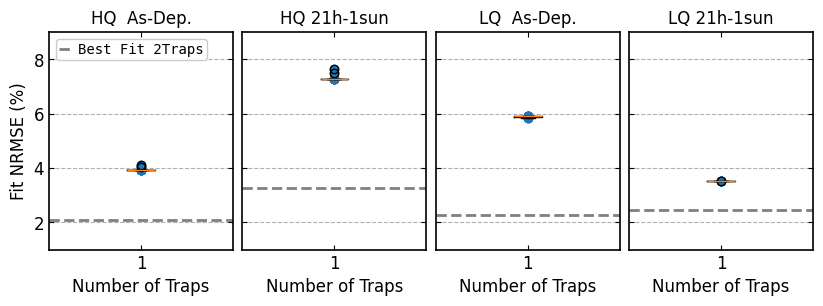

In [37]:
condition = [r"2Q3Before", r"2Q3After", r"3Q2Before", r"3Q2After"]
folderpath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN2_BTmodel_abc"

analysis_abc = analyse_full_Run_abcModel(folderpath, condition, N_RUNS=10)
labels = ['HQ  As-Dep.', 'HQ 21h-1sun', 'LQ  As-Dep.', 'LQ 21h-1sun']
analysis_abc.plot_statistics_fromallruns(labels = labels,
                                                 savepath = r"/media/qrb/0726-A615/LastVersion/Reviews/Graphs/FigS4_fitstatistics_abcModel.svg", 
                                                 margin_mm = (12,7,4,12), ylim = [1, 9])

In [39]:
analysis_abc.best_runs_dict

{'2Q3Before': (0.0394,
  '/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN2_BTmodel_abc/07-2Q3Before-nrmse00394-BTmodel-RateEqAgent.pickle',
  7),
 '2Q3After': (0.0726,
  '/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN2_BTmodel_abc/03-2Q3After-nrmse00726-BTmodel-RateEqAgent.pickle',
  3),
 '3Q2Before': (0.0585,
  '/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN2_BTmodel_abc/03-3Q2Before-nrmse00585-BTmodel-RateEqAgent.pickle',
  3),
 '3Q2After': (0.0351,
  '/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN2_BTmodel_abc/05-3Q2After-nrmse00351-BTmodel-RateEqAgent.pickle',
  5)}

Im Here Auger
Im Here Auger
Im Here Auger
Im Here Auger
0.039357459857057776
Im Here Auger
Im Here Auger
Im Here Auger
Im Here Auger
0.07260934072802583
Im Here Auger
Im Here Auger
Im Here Auger
Im Here Auger
0.058491302925987816
Im Here Auger
Im Here Auger
Im Here Auger
Im Here Auger
0.03510740181328679


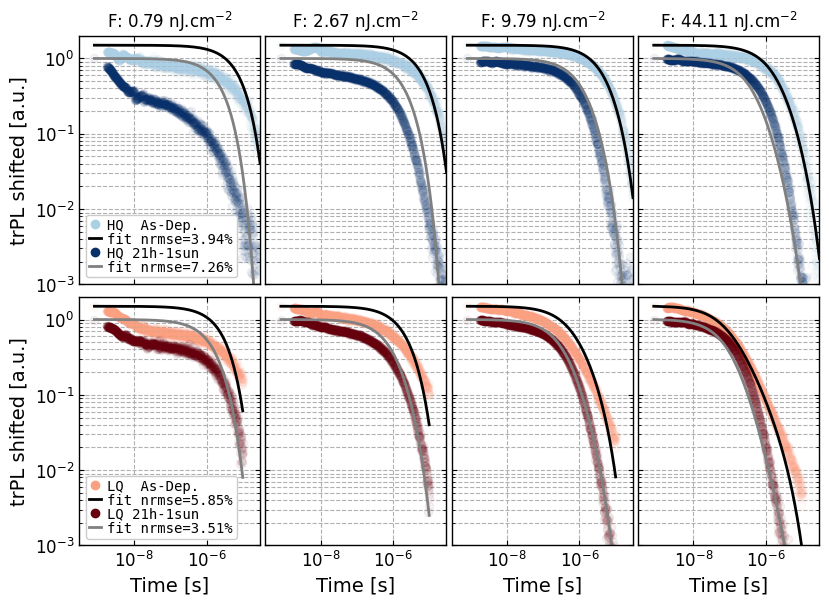

In [38]:
labels = ['HQ  As-Dep.', 'HQ 21h-1sun', 'LQ  As-Dep.', 'LQ 21h-1sun']

analysis_abc.plot_resultingFits(trPLs,savepath = r"/media/qrb/0726-A615/LastVersion/Reviews/Graphs/FigSX_Fits_abcModel.svg", 
                                                margin_mm = (20,7,2,12), wspace = 0.03, leg = labels)

# Comparison with real values

In [229]:
folder_FAPI_2Q3 = r"/home/qrb/Documents/PhD/Experimental/Group1: CsPI MAPI CsFAPI/ssPL/251028 FAPI Reviews 2"
from os.path import isfile, join
files_FAPI_2Q3 = [f for f in os.listdir(folder_FAPI_2Q3) if (isfile(join(folder_FAPI_2Q3, f)) and (not(f.startswith("._"))))]

files_FAPI_2Q3.sort()
files_FAPI_2Q3

['00-2Q1-20ms-01.txt',
 '01-2Q1-20ms-02.txt',
 '02-2Q3-20ms.txt',
 '03-2Q3-20ms.txt',
 '04-2Q3-20ms-2h1SUN.txt',
 '05-2Q3-20ms-2h1SUN.txt',
 '06-2Q3-20ms-4h1SUN.txt',
 '07-2Q3-20ms-4h1SUN.txt',
 '08-2Q3-20ms-24h1SUN.txt',
 '09-2Q3-20ms-24h1SUN.txt']

In [230]:
folder_FAPI_treatments = r"/home/qrb/Documents/PhD/Experimental/Group1: CsPI MAPI CsFAPI/ssPL/251103 FAPI ptrPL"

files_FAPI_treatments = [f for f in os.listdir(folder_FAPI_treatments) if (isfile(join(folder_FAPI_treatments, f)) and (not(f.startswith("._"))))]

files_FAPI_treatments.sort()
files_FAPI_treatments

['00-3Q1encaps-20ms.txt',
 '01-3Q1encaps-20ms.txt',
 '02-3Q2encaps-14H1SUN-afterptrPL-20ms.txt',
 '03-3Q2encaps-14H1SUN-afterptrPL-20ms.txt',
 '04-3Q6encaps-17H1SUN-20ms.txt',
 '05-3Q6encaps-17H1SUN-20ms.txt',
 '06-3Q2encaps-21H1SUN-20ms.txt',
 '07-3Q2encaps-21H1SUN-20ms.txt',
 '08-3Q6encaps-21H1SUN-20ms.txt',
 '09-3Q6encaps-21H1SUN-20ms.txt',
 '10-3Q6encaps-21H1SUN-20ms(1).txt',
 '10-3Q6encaps-21H1SUN-20ms.txt',
 '11-3Q6encaps-21H1SUN-20ms.txt',
 'M07andM08TheLaserPowerwassetto4mWandnot3.39.txt']

0
1.548596584345437
1
1.5257080577318085
[1.         3.85207018]
$\Delta$QFLS = [ 0.         35.06387855] [meV]
n1p1/n2p2 = [1.         4.22340959]
$\\Delta$ QFLS = [ 0.         37.45671178] [meV]
n1p1/n2p2 = 9.287011713537058
$\\Delta$ QFLS = 57.944037685983105 [meV]


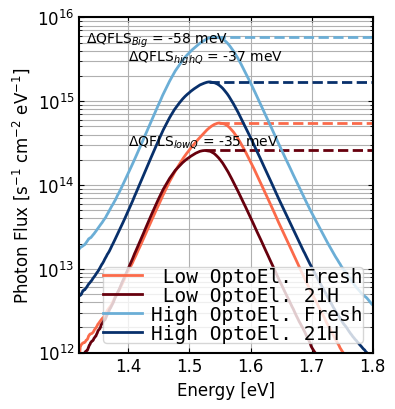

In [269]:
colorz = ['red', 'blue', 'green']
lines = ['-', '--']
colors = ['#1f7a8cff',  "#ff8f4cff", "#9ACD32", "#a232a8", "#e991ed"]
A4_width = 8.27
A4_height = 11.69
fig, ax = plt.subplots(1,1, figsize = (A4_width/2.2, A4_height/3))
hc = 1240
lower = 1.55 #1.35
upper = 1.75

sel_3Q2 = [1,7]
sel_2Q3 = [3,9]

leg_3Q2 = [" Low OptoEl. Fresh", " Low OptoEl. 21H"]
leg_2Q3 = ["High OptoEl. Fresh", "High OptoEl. 21H"]
blues = plt.get_cmap('Blues', 3)
reds = plt.get_cmap('Reds', 3)
for i, idx in enumerate(sel_3Q2):
    print(i)
    df = pd.read_csv(join(folder_FAPI_treatments, files_FAPI_treatments[idx]), skiprows=17, sep="\t", encoding="Latin")
    if not (i):
        Es_3Q2 = np.zeros((len(sel_3Q2), len(df['Wavelength (nm)'])))
        Cs_3Q2 = np.zeros((len(sel_3Q2), len(df['Wavelength (nm)'])))
        integral_3Q2 = np.zeros((len(sel_3Q2),))
    
    energy = 1240/df['Wavelength (nm)'].to_numpy()
    counts_e = (hc/(energy**2))* df['Luminescence flux density (photons/(s cm² nm))']
    Es_3Q2[i] = energy
    Cs_3Q2[i] = counts_e
    ax.plot(energy, counts_e, label = leg_3Q2[i], color = reds(i+1))
    print(energy[np.argmax(counts_e)])
    ax.hlines(np.amax(counts_e), linestyle = '--', color = reds(i+1), xmin=energy[np.argmax(counts_e)], xmax=1.8)

    E = energy[(energy > lower) & (energy < upper)][::-1] #reverse for proper integration
    C = counts_e[(energy > lower) & (energy < upper)][::-1] #reverse for proper integration
    integral_3Q2[i] = np.trapezoid(C, x = E)

ratios_3Q2 = integral_3Q2[0]/integral_3Q2
print(ratios_3Q2)
kT = 0.026 #eV
dQFLS_3Q2 = kT * np.log(ratios_3Q2)
print(r'$\Delta$QFLS =', 1e3*dQFLS_3Q2, '[meV]')
QFLS_textsize = 10
ax.text(1.4, 3e14, r'$\Delta$QFLS$_{lowQ}$'+f' = {-1e3*dQFLS_3Q2[-1]:.0f} meV', size = QFLS_textsize)
    
for i, idx in enumerate(sel_2Q3):
    df = pd.read_csv(join(folder_FAPI_2Q3, files_FAPI_2Q3[idx]), skiprows=17, sep="\t", encoding="Latin")
    if not (i):
        Es_2Q3 = np.zeros((len(sel_2Q3), len(df['Wavelength (nm)'])))
        Cs_2Q3 = np.zeros((len(sel_2Q3), len(df['Wavelength (nm)'])))
        integral_2Q3 = np.zeros((len(sel_3Q2),))
    
    energy = 1240/df['Wavelength (nm)'].to_numpy()
    counts_e = (hc/(energy**2)) * df['Luminescence flux density (photons/(s cm² nm))']
    Es_2Q3[i] = energy
    Cs_2Q3[i] = counts_e
    ax.plot(energy, counts_e, label = leg_2Q3[i], color = blues(i+1))
    ax.hlines(np.amax(counts_e), linestyle = '--', color = blues(i+1), xmin=energy[np.argmax(counts_e)], xmax=1.8)

    E = energy[(energy > lower) & (energy < upper)][::-1] #reverse for proper integration
    C = counts_e[(energy > lower) & (energy < upper)][::-1] #reverse for proper integration
    integral_2Q3[i] = np.trapezoid(C, x = E)

ratios_2Q3 = integral_2Q3[0]/integral_2Q3
print('n1p1/n2p2 =', ratios_2Q3)
kT = 0.026 #eV
dQFLS_2Q3 = kT * np.log(ratios_2Q3)
print(r'$\\Delta$ QFLS =', 1e3*dQFLS_2Q3, r'[meV]')
ax.text(1.4, 3e15, r'$\Delta$QFLS$_{highQ}$'+f' = {-1e3*dQFLS_2Q3[-1]:.0f} meV', size = QFLS_textsize)


ratios_big = integral_2Q3[0]/integral_3Q2[0]
print('n1p1/n2p2 =', ratios_big)
kT = 0.026 #eV
dQFLS_big = kT * np.log(ratios_big)
print(r'$\\Delta$ QFLS =', 1e3*dQFLS_big, r'[meV]')
ax.text(1.33, 5e15, r'$\Delta$QFLS$_{Big}$'+f' = {-1e3*dQFLS_big:.0f} meV', size = QFLS_textsize)

#print("avg = "+str(sum(lambdas)/len(lambdas)))
axis_fontsize = 18
axisTicks_fontsize = 12

ax.set_yscale("log")
ax.set_xlim([1.32, 1.80])
ax.set_xlabel("Energy [eV]", size=axisTicks_fontsize)
ax.set_ylabel("Photon Flux [s$^{-1}$ cm$^{-2}$ eV$^{-1}$]", size=axisTicks_fontsize)

ax.set_ylim([1e12, 1e16])

ax.legend(fontsize = 'small', borderpad=0.0, labelspacing=0.0, handletextpad=0.5, loc = 'lower right', prop={'family': 'monospace'})
ax.tick_params(axis='x', labelsize=axisTicks_fontsize)
ax.tick_params(axis='y', labelsize=axisTicks_fontsize)
ax.grid(visible = True, which = 'both')
w_frame = 1.5
ax.spines["bottom"].set_linewidth(w_frame)
ax.spines["top"].set_linewidth(w_frame)
ax.spines["left"].set_linewidth(w_frame)
ax.spines["right"].set_linewidth(w_frame)

fig.tight_layout(pad=0., w_pad=0., h_pad=0.)
#fig.savefig(r'/media/qrb/0726-A615/LastVersion/Reviews/Graphs/ssPL_fig1.svg', bbox_inches = None)

In [210]:
np.sqrt(ni2)

np.float64(151096059981.48538)

In [197]:
n[-1].shape

(100,)

In [199]:
L = 800e-9
x = np.linspace(0, L, num = 100)
Nc = Nv = 2e24
kT = 0.0257
Eg = 1.553 #FAPI
ni2 = Nc*Nv*np.exp(-Eg/kT)

n_av = np.trapezoid(n[-1], x = x)/L
p_av = np.trapezoid(p[-1], x = x)/L
QFLS_2Q3Before = kT*np.log(n_av*p_av/ni2)

QFLS_2Q3Before

np.float64(1.2637514878696765)

In [ ]:
from optimpv_github.RateEqfits.RateEqModel import DBTD_multi_trap

In [378]:
# Plot the data to be fitted and the initial guess
X = RateEq.X[0]
y = RateEq.y[0]

# Define the Agent and the target metric/loss function
metric = 'nrmse'
loss = 'linear' # 'nrmse' or 'mse' or 'soft_l1' or 'linear'
pump_args = RateEq.pump_args
exp_format = 'trPL' # experiment format
model = partial(DBTD_multi_trap, method='LSODA', dimensionless=False, timeout=60, timeout_solve=60, ConstantGen = 1e21)
RateEq_2Q3Before_N0Free = RateEqAgent(RateEq.params, [X], [y], model = model, pump_model = initial_carrier_density, pump_args = pump_args, fixed_model_args = {}, metric = metric, loss = loss,minimize=True,exp_format=exp_format,detection_limit=0e-5,  compare_type ='normalized_log',do_G_frac_transform=True,parallel=False)

y_test = RateEq_2Q3Before_N0Free.run({},exp_format=exp_format) # get the initial prediction with the original parameters

from optimpv.general.general import *
y_transformed, y_pred_transformed = transform_data(y,y_test, transform_type='normalized_log', do_G_frac_transform=True, X=X)

02-2Q3Before-nrmse00173-RateEqAgent.pickle
0.01735011628413716
[0.01785839 0.06060007 0.22184461 1.        ]
00-2Q3After-nrmse00276-RateEqAgent.pickle
0.027617395783227208
[0.01834627 0.060449   0.2214727  1.        ]
00-3Q2Before-nrmse00213-RateEqAgent.pickle
0.021300788458803045
[0.01761826 0.06056587 0.28053276 1.        ]
07-3Q2After-nrmse00239-RateEqAgent.pickle
0.023876890736164252
[0.01812828 0.06052177 0.22253871 1.        ]


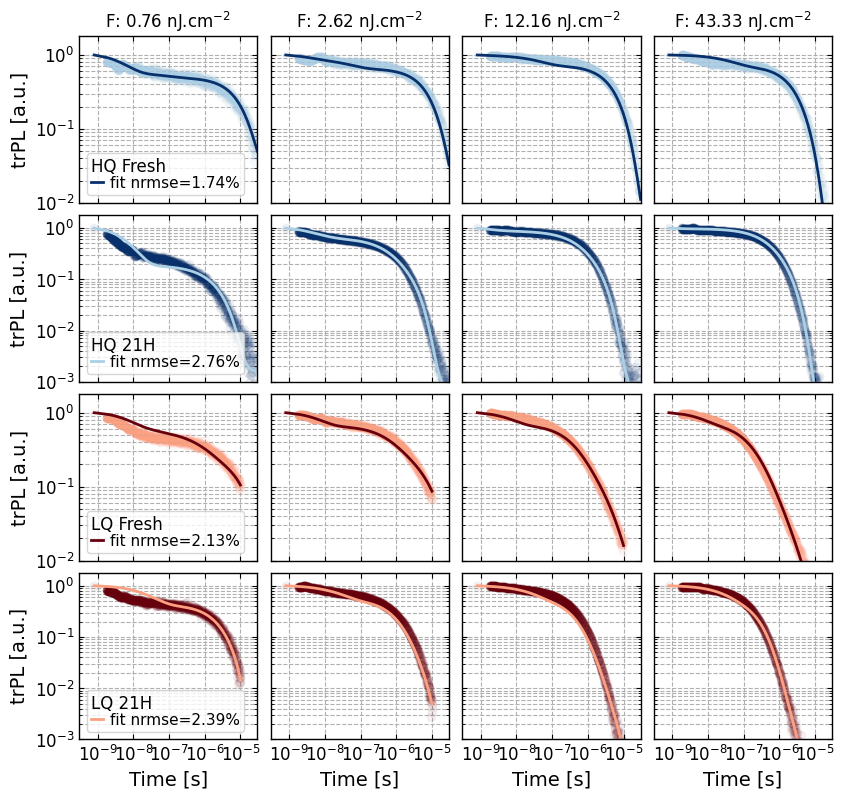

In [ ]:
#Plot the decays. 
folder_path = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results-allData_RUN3_LSODA_10tries_NewConstraints"
condition = [r"2Q3-Before", r"2Q3-After", r"3Q2-Before", r"3Q2-After"]
selection = [2, 0, 0, 7]

fig, ax = plt.subplots(4, 4, figsize = (A4_width, A4_height/1.5))

Fs = 1e9*trPLs3Q2_before.BD_ratio*trPLs3Q2_before.fluences*(trPLs3Q2_before.hc/trPLs3Q2_before.lambda_laser)*1e-4 #nJ/cm2
colors = [blues(1), blues(3), reds(1), reds(3)]
colors_fits = [blues(3),blues(1),reds(3),reds(1)]
titles_leg = [f'HQ Fresh', f'HQ 21H', f'LQ Fresh', f'LQ 21H']
nrmses = []
for i, (c, s, y_test) in enumerate(zip(condition, selection, y_runs)):

    folderpath = os.path.join(folder_path, c)
    result_files = [f for f in os.listdir(folderpath) if "RateEq" in f]
    result_files.sort()

    file = result_files[s]
    print(file)
    filepath = os.path.join(folderpath, file)
    with open(filepath, 'rb') as file:
        RateEq = pickle.load(file)

    exp_format = 'trPL' # experiment format
    model = partial(DBTD_multi_trap, method="BDF", dimensionless=True, timeout=120, timeout_solve=120)
    RateEq.model = model
    
    y_transformed, y_pred_transformed = transform_data(np.array(RateEq.y[0]),y_test, transform_type='normalized_log', do_G_frac_transform=True, X=np.array(RateEq.X[0]))
    print(calc_metric(y_transformed, y_pred_transformed, metric_name='nrmse'))
    nrmses.append(calc_metric(y_transformed, y_pred_transformed, metric_name='nrmse'))

    X = np.array(RateEq.X[0])
    viridis = plt.get_cmap('viridis', len(np.unique(X[:, 1])))

    Ps = np.unique(X[:, 1])
    print(np.unique(X[:, 1]))

    for j, G in enumerate(np.unique(X[:, 1])):
        ax[i,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_transformed[X[:, 1] == G],'o',color=colors[i],alpha=0.05)
        ax[i,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_pred_transformed[X[:, 1] == G], color=colors_fits[i], linestyle='-', label=f'fit nrmse={100*nrmses[i]:.2f}%')

for i, b in enumerate(ax):
    for j, (a, f) in enumerate(zip(b, Fs)):
        if not(i%2):
            a.set_ylim([1e-2, 1.8])
        else:
            a.set_ylim([1e-3, 1.8])
        a.set_xlim([3e-10, 3e-5])
        a.set_xscale('log')
        a.set_yscale('log')
        a.set_xticks([1e-9, 1e-8, 1e-7, 1e-6, 1e-5])

        if (i == 3):
            a.set_xlabel('Time [s]')
        else:
            a.tick_params(axis="x", labelbottom=False)
        if (j == 0):
            a.set_ylabel(exp_format + ' [a.u.]')
            leg = a.legend(title = titles_leg[i], title_fontsize = 12, fontsize = 11, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=0.8, markerscale=0.5, loc = 'lower left', borderaxespad = 0.5)
            leg.get_title().set_ha("left")
            leg._legend_box.align = "left"
        else:
            a.tick_params(axis="y", labelleft=False)

        axisTicks_fontsize = 12
        if(i == 0):
            a.set_title(f'F: {f:.2f}'+' nJ.cm$^{-2}$', size = 12)
        a.tick_params(axis='x', labelsize=axisTicks_fontsize)
        a.tick_params(axis='y', labelsize=axisTicks_fontsize)
        #a.minorticks_on()
        a.grid(visible = True, which = 'both', linestyle = '--')
        w_frame = 1.
        a.spines["bottom"].set_linewidth(w_frame)
        a.spines["top"].set_linewidth(w_frame)
        a.spines["left"].set_linewidth(w_frame)
        a.spines["right"].set_linewidth(w_frame)

        fig.tight_layout(pad=0., w_pad=0., h_pad=0.)

02-2Q3Before-nrmse00173-RateEqAgent.pickle
0.01735011628413716
[0.01785839 0.06060007 0.22184461 1.        ]
00-2Q3After-nrmse00276-RateEqAgent.pickle
0.027617395783227208
[0.01834627 0.060449   0.2214727  1.        ]


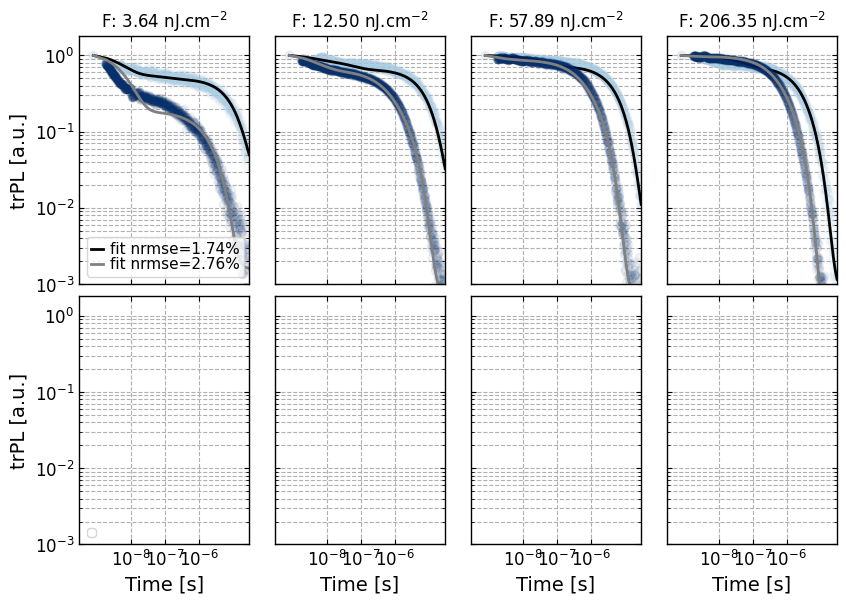

In [301]:
#Plot the decays. 
folder_path = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/FittingResults/Results-allData_RUN3_LSODA_10tries_NewConstraints"
condition = [r"2Q3-Before", r"2Q3-After", r"3Q2-Before", r"3Q2-After"]
selection = [2, 0, 0, 7]

fig, ax = plt.subplots(2, 4, figsize = (A4_width, A4_height/2))

Fs = 1e9*trPLs3Q2_before.fluences*(trPLs3Q2_before.hc/trPLs3Q2_before.lambda_laser)*1e-4 #nJ/cm2
colors = [blues(1), blues(3), reds(1), reds(3)]
colors_fits = ["black","grey", reds(3),reds(1)]
nrmses = []
for i, (c, s, y_test) in enumerate(zip(condition, selection, y_runs)):
    if(i>1):
        break
    folderpath = os.path.join(folder_path, c)
    result_files = [f for f in os.listdir(folderpath) if "RateEq" in f]
    result_files.sort()

    file = result_files[s]
    print(file)
    filepath = os.path.join(folderpath, file)
    with open(filepath, 'rb') as file:
        RateEq = pickle.load(file)

    exp_format = 'trPL' # experiment format
    model = partial(DBTD_multi_trap, method="BDF", dimensionless=True, timeout=120, timeout_solve=120)
    RateEq.model = model
    
    y_transformed, y_pred_transformed = transform_data(np.array(RateEq.y[0]),y_test, transform_type='normalized_log', do_G_frac_transform=True, X=np.array(RateEq.X[0]))
    print(calc_metric(y_transformed, y_pred_transformed, metric_name='nrmse'))
    nrmses.append(calc_metric(y_transformed, y_pred_transformed, metric_name='nrmse'))

    X = np.array(RateEq.X[0])
    viridis = plt.get_cmap('viridis', len(np.unique(X[:, 1])))

    Ps = np.unique(X[:, 1])
    print(np.unique(X[:, 1]))

    for j, G in enumerate(np.unique(X[:, 1])):
        ax[0,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_transformed[X[:, 1] == G],'o',color=colors[i],alpha=0.05)
        ax[0,j].plot(X[:, 0][X[:, 1] == G]+8e-10, 10**y_pred_transformed[X[:, 1] == G], color=colors_fits[i], linestyle='-', label=f'fit nrmse={100*nrmses[i]:.2f}%')

for i, b in enumerate(ax):
    for j, (a, f) in enumerate(zip(b, Fs)):
        a.set_ylim([1e-3, 1.8])
        a.set_xlim([3e-10, 3e-5])
        a.set_xscale('log')
        a.set_yscale('log')
        a.set_xticks([1e-8, 1e-7, 1e-6])

        if (i == 1):
            a.set_xlabel('Time [s]')
        else:
            a.tick_params(axis="x", labelbottom=False)
        if (j == 0):
            a.set_ylabel(exp_format + ' [a.u.]')
            a.legend(fontsize = 11, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=0.8, markerscale=0.5, loc = 'lower left', borderaxespad = 0.5)
        else:
            a.tick_params(axis="y", labelleft=False)

        axisTicks_fontsize = 12
        if(i == 0):
            a.set_title(f'F: {f:.2f}'+' nJ.cm$^{-2}$', size = 12)
        a.tick_params(axis='x', labelsize=axisTicks_fontsize)
        a.tick_params(axis='y', labelsize=axisTicks_fontsize)
        #a.minorticks_on()
        a.grid(visible = True, which = 'both', linestyle = '--')
        w_frame = 1.
        a.spines["bottom"].set_linewidth(w_frame)
        a.spines["top"].set_linewidth(w_frame)
        a.spines["left"].set_linewidth(w_frame)
        a.spines["right"].set_linewidth(w_frame)


fig.tight_layout(pad=0., w_pad=0., h_pad=0.)

In [ ]:
def range_params(RateEq_init, params_to_range, X, y, num_points = 10):
    fig, ax = plt.subplots(1,len(params_to_range), figsize =(len(params_to_range)*4, 5))

    nrmse_array = np.zeros((len(params_to_range), num_points))
    vals_array = np.zeros((len(params_to_range), num_points))

    for i, p in enumerate(params_to_range):
        RateEq = copy.deepcopy(RateEq_init)
        if (('E_t') in p.name):
            low = p.bounds[0]
            high = p.bounds[1]
            if (p.value - 0.3 > low):
                low = p.value - 0.3
            if (p.value + 0.3 < high):
                high = p.value + 0.3
            vals = np.linspace(low, high, num =num_points)
            ax[i].set_xscale('linear')
            ax[i].set_yscale('log')
        else:
            ax[i].set_xscale('log')
            ax[i].set_yscale('log')
            vals = p.value*np.logspace(-2, 2, num =num_points)
        
        print('Param variation:', p.name, 'Range:', vals[0], vals[-1])
        vals_array[i, :] = vals
        
        nrmses = np.zeros_like(vals)
        for p_R in RateEq.params:
            if(p.name == p_R.name):
                break
        
        print(p_R.name)
        for j, val in enumerate(vals):
            p_R.value = val
            exp_format = 'trPL' # experiment format
            try:
                y_test = RateEq.run({},exp_format=exp_format) # get the initial prediction with the original parameters
                # Plot the data to be fitted and the initial guess
                y_transformed, y_pred_transformed = transform_data(y,y_test, transform_type='normalized_log', do_G_frac_transform=True, X=X)
                nrmses[j] = calc_metric(y_transformed, y_pred_transformed, metric_name="nrmse")
                print('Calc', j, ' :', val, '; nrmse:', nrmses[j])
                if (nrmses[j] > 2*nrmses[0]):
                    nrmses[j+1:] = np.nan
                    break

            except KeyboardInterrupt:
                print("KeyboardInterrupt — stopping loops.")
                raise  # <-- important

            except Exception as e:
                nrmses[j] = np.nan
                print('Failed Calc', j, ' :', val, '; nrmse:', nrmses[j], '| error:', repr(e))   

        nrmse_array[i, :] = nrmses
        
        ax[i].plot(vals, nrmses)

    #for a in ax:
        
        #a.set_xlabel('Time [s]')
        #a.set_ylabel(exp_format + ' [a.u.]')
        #a.legend(title='Intensity fraction:')

    return nrmse_array, vals_array

In [769]:
#Plot the decays. 
folder_path = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results-allData_RUN3_LSODA_10tries_NewConstraints/"+r"2Q3-Before"
condition = [r"2Q3-Before", r"2Q3-After", r"3Q2-Before", r"3Q2-After"]
selection = [2, 0, 0, 7]

result_files = [f for f in os.listdir(folder_path) if "RateEq" in f]
result_files.sort()

file = result_files[2]
print(file)
filepath = os.path.join(folder_path, file)
with open(filepath, 'rb') as file:
    RateEq = pickle.load(file)

#Plot the decays. 
folder_path = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results-allData_RUN3_LSODA_10tries_NewConstraints/"+r"2Q3-After"
condition = [r"2Q3-Before", r"2Q3-After", r"3Q2-Before", r"3Q2-After"]
selection = [2, 0, 0, 7]

result_files = [f for f in os.listdir(folder_path) if "RateEq" in f]
result_files.sort()

file = result_files[0]
print(file)
filepath = os.path.join(folder_path, file)
with open(filepath, 'rb') as file:
    RateEq2 = pickle.load(file)


#Plot the decays. 
folder_path = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results-allData_RUN3_LSODA_10tries_NewConstraints/"+r"3Q2-Before"
condition = [r"2Q3-Before", r"2Q3-After", r"3Q2-Before", r"3Q2-After"]
selection = [2, 0, 0, 7]

result_files = [f for f in os.listdir(folder_path) if "RateEq" in f]
result_files.sort()

file = result_files[0]
print(file)
filepath = os.path.join(folder_path, file)
with open(filepath, 'rb') as file:
    RateEq3 = pickle.load(file)

#Plot the decays. 
folder_path = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results-allData_RUN3_LSODA_10tries_NewConstraints/"+r"3Q2-After"
condition = [r"2Q3-Before", r"2Q3-After", r"3Q2-Before", r"3Q2-After"]
selection = [2, 0, 0, 7]

result_files = [f for f in os.listdir(folder_path) if "RateEq" in f]
result_files.sort()

file = result_files[7]
print(file)
filepath = os.path.join(folder_path, file)
with open(filepath, 'rb') as file:
    RateEq4 = pickle.load(file)

02-2Q3Before-nrmse00173-RateEqAgent.pickle
00-2Q3After-nrmse00276-RateEqAgent.pickle
00-3Q2Before-nrmse00213-RateEqAgent.pickle
07-3Q2After-nrmse00239-RateEqAgent.pickle


In [741]:
folderpath = os.path.join(folder_path, c)
print(folderpath)

/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results-allData_RUN3_LSODA_10tries_NewConstraints/3Q2-After


In [ ]:
nrmse_before, vals_before = range_params(RateEq_2Q3Before_N0Fixed, params_toRange, X, y, num_points=30)

In [735]:
RateEq.params[4:19]

[{'name': 'k_direct', 'type': 'range', 'value_type': 'float', 'value': 1.2503341385435334e-17, 'bounds': [5e-18, 5e-17], 'values': None, 'start_value': 1.96e-17, 'log_scale': False, 'fscale': 1, 'stepsize': None, 'rescale': False, 'display_name': '$k_{\\text{direct}}$', 'unit': 'm$^{3}$ s$^{-1}$', 'full_name': '$k_{\\text{direct}}$ [m$^{3}$ s$^{-1}$]', 'axis_type': 'log', 'std': None, 'encoding': None, 'is_ordered': False, 'is_sorted': False, 'force_log': True},
 {'name': 'mu_n', 'type': 'range', 'value_type': 'float', 'value': 7.470156243280304e-05, 'bounds': [1e-06, 0.001], 'values': None, 'start_value': 0.00012, 'log_scale': False, 'fscale': 1, 'stepsize': None, 'rescale': False, 'display_name': '$\\mu_n$', 'unit': 'm$^{2}$ V$^{-1}$ s$^{-1}$', 'full_name': '$\\mu_n$ [m$^{2}$ V$^{-1}$ s$^{-1}$]', 'axis_type': 'log', 'std': None, 'encoding': None, 'is_ordered': False, 'is_sorted': False, 'force_log': True},
 {'name': 'mu_p', 'type': 'range', 'value_type': 'float', 'value': 2.369407610

In [169]:
#Load nrmse, val couples:
filepath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/PramVariation/nrmses_vals_2Q3Before_fromBestFits_4traps_run8_30points.pickle"
with open(filepath, "rb") as file:
    nrmse_2Q3before, vals_2Q3before = pickle.load(file)

filepath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/PramVariation/nrmses_vals_2Q3After_fromBestFits_4traps_run8_30points.pickle"
with open(filepath, "rb") as file:
    nrmse_2Q3after, vals_2Q3after = pickle.load(file)

#Load nrmse, val couples:
filepath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/PramVariation/nrmses_vals_3Q2Before_fromBestFits_3traps_run8_30points.pickle"
with open(filepath, "rb") as file:
    nrmse_3Q2before, vals_3Q2before = pickle.load(file)

filepath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/PramVariation/nrmses_vals_3Q2After_fromBestFits_4traps_run8_30points.pickle"
with open(filepath, "rb") as file:
    nrmse_3Q2after, vals_3Q2after = pickle.load(file)



#Load nrmse, val couples:
filepath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/PramVariation/nrmses_vals_2Q3Before_fromBestFits2traps_run8_30points.pickle"
with open(filepath, "rb") as file:
    nrmse_2Traps_2Q3before, vals_2Traps_2Q3before = pickle.load(file)

filepath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/PramVariation/nrmses_vals_2Q3After_fromBestFits2traps_run8_30points.pickle"
with open(filepath, "rb") as file:
    nrmse_2Traps_2Q3after, vals_2Traps_2Q3after = pickle.load(file)

#Load nrmse, val couples:
filepath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/PramVariation/nrmses_vals_3Q2Before_fromBestFits2traps_run8_30points.pickle"
with open(filepath, "rb") as file:
    nrmse_2Traps_3Q2before, vals_2Traps_3Q2before = pickle.load(file)

filepath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/PramVariation/nrmses_vals_3Q2After_fromBestFits2traps_run8_30points.pickle"
with open(filepath, "rb") as file:
    nrmse_2Traps_3Q2after, vals_2Traps_3Q2after = pickle.load(file)

In [28]:

#Load nrmse, val couples:
filepath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/PramVariation/nrmses_vals_3Q2Before_fromBestFits2traps_run8_30points.pickle"
with open(filepath, "rb") as file:
   a = pickle.load(file)

filepath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/PramVariation/nrmses_vals_3Q2After_fromBestFits2traps_run8_30points.pickle"
with open(filepath, "rb") as file:
    b = pickle.load(file)

In [29]:
for i, (vb, nb, va, na) in enumerate(zip(a,b)):
    print(i)

ValueError: not enough values to unpack (expected 4, got 2)

In [142]:
RateEq = best_run8_list["2Q3Before"][2]
RateEq2 = best_run8_list["2Q3After"][2]
RateEq3 = best_run8_list["3Q2Before"][2]
RateEq4 = best_run8_list["3Q2After"][2]

(0.7765, 1.553)

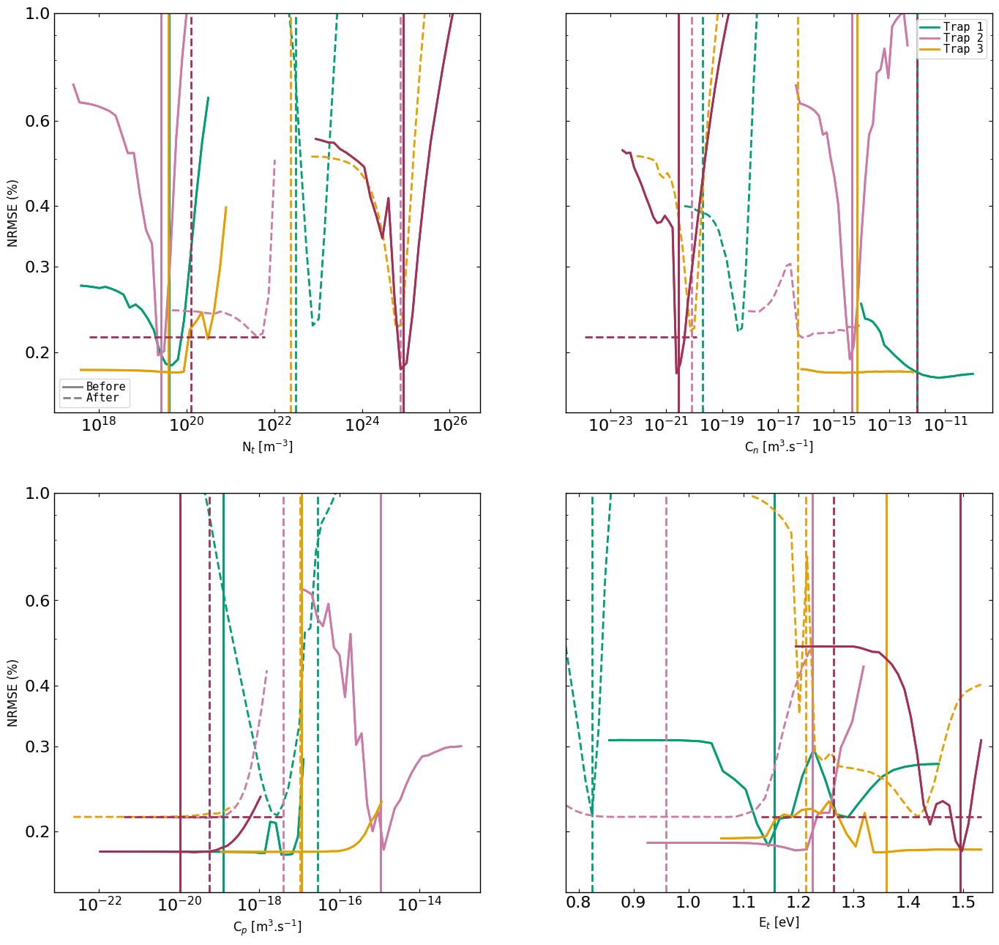

In [168]:
import matplotlib.ticker as mticker

fig, ax = plt.subplots(2,2, figsize=(2*A4_width, 2*A4_height/1.5))

color = ["red", "blue", "green"]
color = ["#009E73", "#CC79A7","#E69F00","#A42F54",]

for i, (vb, nb, va, na) in enumerate(zip(vals_2Q3before, nrmse_2Q3before, vals_2Q3after, nrmse_2Q3after)):
    if(i<3):
        continue
    count = (i-3)%4
    ax= ax.flatten()

    
    ax[(i-3)%4].plot(vb, 10*nb, color=color[int((i-3)/4)])
    ax[(i-3)%4].axvline(RateEq.params[i+4].value, color=color[int((i-3)/4)])

    ax[(i-3)%4].plot(vb, 10*nb, color=color[int((i-3)/4)])
    ax[(i-3)%4].plot(va, 10*na, color=color[int((i-3)/4)], linestyle = "--")

    ax[(i-3)%4].axvline(RateEq.params[i+4].value, color=color[int((i-3)/4)])
    ax[(i-3)%4].axvline(RateEq2.params[i+4].value, color=color[int((i-3)/4)], linestyle = "--")


ticks = [0.2, 0.3, 0.4, 0.6,1.0]
x_labs = [r'N$_{t}$ [m$^{-3}]$', r'C$_n$ [m$^{3}$.s$^{-1}$]', r'C$_p$ [m$^{3}$.s$^{-1}$]', r'E$_t$ [eV]']

#Legends Custom
from matplotlib.lines import Line2D
handles = [
    Line2D([0], [0], color="grey", lw=2, ls="-",  label="Before"),
    Line2D([0], [0], color="grey", lw=2, ls="--", label="After"),
]
leg = ax[0].legend(handles = handles, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'lower left', borderaxespad = 0.5, 
                        prop={'family': 'monospace', "size": 11})
handles = [
    Line2D([0], [0], color=color[0], lw=2, ls="-",  label="Trap 1"),
    Line2D([0], [0], color=color[1], lw=2, ls="-", label="Trap 2"),
    Line2D([0], [0], color=color[2], lw=2, ls="-", label="Trap 3"),
]
ax[1].legend(handles = handles, fontsize = 11, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'upper right', borderaxespad = 0.5, 
                prop={'family': 'monospace', "size": 11})

axisTicks_fontsize = 12
for i, a in enumerate(ax):
    a.set_xlabel(x_labs[i], fontsize = axisTicks_fontsize)
    if(i<3):
        a.set_xscale("log")
    a.set_yscale("log")
    a.set_yticks(ticks)
    a.yaxis.set_major_formatter(
        mticker.FuncFormatter(lambda y, _: f"{y:.1f}")
    )
    a.yaxis.set_minor_formatter(mticker.NullFormatter())
    if not(i%2):
        a.set_ylabel("NRMSE (%)", fontsize = axisTicks_fontsize)
    else:
        #a.set_yticks([])
        a.tick_params(axis="y", which="both", labelleft=False)

    a.set_ylim([0.15, 1.0])

#ax[0].set_xlim([8e19, 3e26])
#ax[1].set_xlim([2e-21, 3e-11])
#ax[2].set_xlim([1e-22, 3e-16])
ax[3].set_xlim([1.553/2, 1.553])

#export_svg(fig, "/media/qrb/0726-A615/LastVersion/Reviews/Graphs/SI_parameterVar_2Q3.svg", margin_mm = (20, 5, 5, 15), width_in = fig.get_figwidth(), height_in=fig.get_figheight(), wspace=0.07, hspace=0.2)#

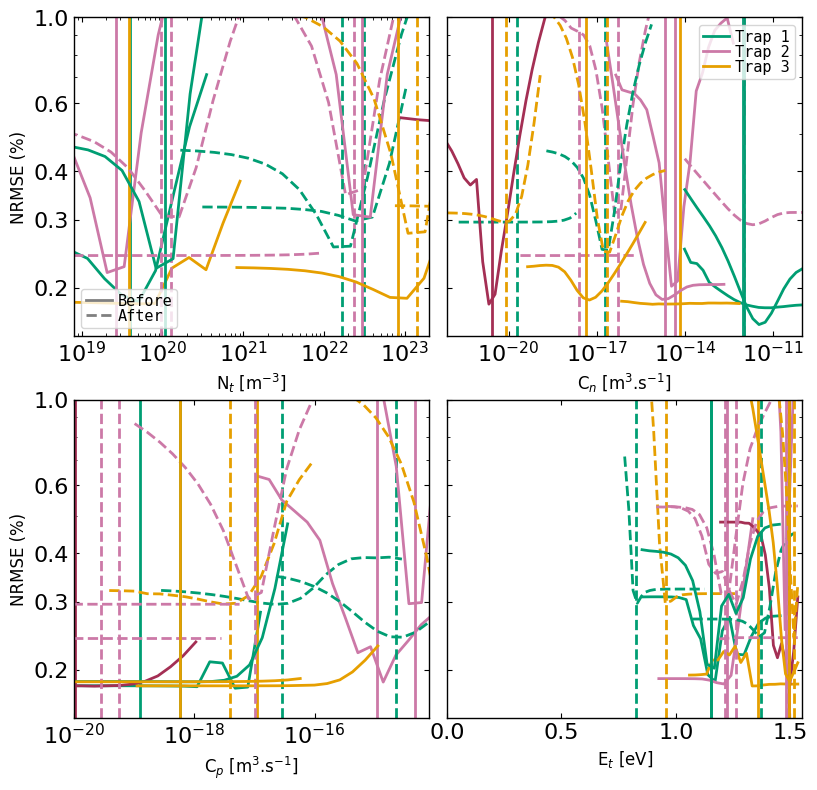

In [157]:
fig, ax = plt.subplots(2,2, figsize=(A4_width, A4_height/1.5))

for i, (vb, nb, va, na) in enumerate(zip(vals_2Q3before, nrmse_2Q3before, vals_2Q3after, nrmse_2Q3after)):
    if(i<3):
        continue
    count = (i-3)%4
    ax= ax.flatten()

    if(i>6):
        ax[(i-3)%4].plot(vb, 10*nb, color=color[int((i-3)/4)])
        ax[(i-3)%4].axvline(RateEq.params[i+4].value, color=color[int((i-3)/4)])
    else:
        ax[(i-3)%4].plot(vb, 10*nb, color=color[int((i-3)/4)])
        ax[(i-3)%4].plot(va, 10*na, color=color[int((i-3)/4)], linestyle = "--")

        ax[(i-3)%4].axvline(RateEq.params[i+4].value, color=color[int((i-3)/4)])
        ax[(i-3)%4].axvline(RateEq2.params[i+4].value, color=color[int((i-3)/4)], linestyle = "--")


for i, (va, na) in enumerate(zip(vals_2Q3after, nrmse_2Q3after)):
    if(i<7):
        continue

    if (i>6 and i<11):
        ax[(i-3)%4].plot(va, 10*na, color=color[2], linestyle = "--")
        ax[(i-3)%4].axvline(RateEq2.params[i+4].value, color=color[2], linestyle = "--")
    elif(i>10):
        ax[(i-3)%4].plot(va, 10*na, color=color[1], linestyle = "--")
        ax[(i-3)%4].axvline(RateEq2.params[i+4].value, color=color[1], linestyle = "--")

for i, (vb, nb, va, na) in enumerate(zip(vals_3Q2before, nrmse_3Q2before, vals_3Q2after, nrmse_3Q2after)):
    if(i<3):
        continue
    count = (i-3)%4
    ax= ax.flatten()

    ax[(i-3)%4].plot(vb, 10*nb, color=color[int((i-3)/4)])
    ax[(i-3)%4].plot(va, 10*na, color=color[int((i-3)/4)], linestyle = "--")

    ax[(i-3)%4].axvline(RateEq3.params[i+4].value, color=color[int((i-3)/4)])
    ax[(i-3)%4].axvline(RateEq4.params[i+4].value, color=color[int((i-3)/4)], linestyle = "--")

ticks = [0.2, 0.3, 0.4, 0.6,1.0]
x_labs = [r'N$_{t}$ [m$^{-3}]$', r'C$_n$ [m$^{3}$.s$^{-1}$]', r'C$_p$ [m$^{3}$.s$^{-1}$]', r'E$_t$ [eV]']

#Legends Custom
from matplotlib.lines import Line2D
handles = [
    Line2D([0], [0], color="grey", lw=2, ls="-",  label="Before"),
    Line2D([0], [0], color="grey", lw=2, ls="--", label="After"),
]
leg = ax[0].legend(handles = handles, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'lower left', borderaxespad = 0.5, 
                        prop={'family': 'monospace', "size": 11})
handles = [
    Line2D([0], [0], color=color[0], lw=2, ls="-",  label="Trap 1"),
    Line2D([0], [0], color=color[1], lw=2, ls="-", label="Trap 2"),
    Line2D([0], [0], color=color[2], lw=2, ls="-", label="Trap 3"),
]
ax[1].legend(handles = handles, fontsize = 11, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'upper right', borderaxespad = 0.5, 
                prop={'family': 'monospace', "size": 11})

axisTicks_fontsize = 12
for i, a in enumerate(ax):
    a.set_xlabel(x_labs[i], fontsize = axisTicks_fontsize)
    if(i<3):
        a.set_xscale("log")
    a.set_yscale("log")
    a.set_yticks(ticks)
    a.yaxis.set_major_formatter(
        mticker.FuncFormatter(lambda y, _: f"{y:.1f}")
    )
    a.yaxis.set_minor_formatter(mticker.NullFormatter())
    if not(i%2):
        a.set_ylabel("NRMSE (%)", fontsize = axisTicks_fontsize)
    else:
        #a.set_yticks([])
        a.tick_params(axis="y", which="both", labelleft=False)

    a.set_ylim([0.15, 1.0])

ax[0].set_xlim([8e18, 2e23])
ax[1].set_xlim([8e-23, 1e-10])
ax[2].set_xlim([1e-20, 8e-15])
ax[3].set_xlim([0, 1.553])

export_svg(fig, "/media/qrb/0726-A615/LastVersion/Reviews/Graphs/SI_parameterVar_3Q2.svg", margin_mm = (20, 5, 5, 15), width_in = fig.get_figwidth(), height_in=fig.get_figheight(), wspace=0.05, hspace=0.2)#

In [ ]:
def darken_hex(hex_color, factor=0.8):
    """
    factor < 1 makes it darker (e.g. 0.8 = 20% darker)
    factor > 1 makes it lighter
    """
    h = hex_color.lstrip("#")
    r, g, b = (int(h[i:i+2], 16) for i in (0, 2, 4))
    r = max(0, min(255, int(r * factor)))
    g = max(0, min(255, int(g * factor)))
    b = max(0, min(255, int(b * factor)))
    return f"#{r:02X}{g:02X}{b:02X}"

#Load nrmse, val couples:
filepath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/PramVariation/nrmses_vals_2Q3Before_fromBestFits_4traps_run8_30points.pickle"
with open(filepath, "rb") as file:
    nrmse_2Q3before, vals_2Q3before = pickle.load(file)

In [199]:
list(brun8_list.keys())[1]

'2Q3After'

C_n_1 C_p_1
C_n_1 C_p_1
C_n_2 C_p_2
C_n_2 C_p_2
C_n_3 C_p_3
C_n_3 C_p_3
C_n_4 C_p_4
C_n_4 C_p_4


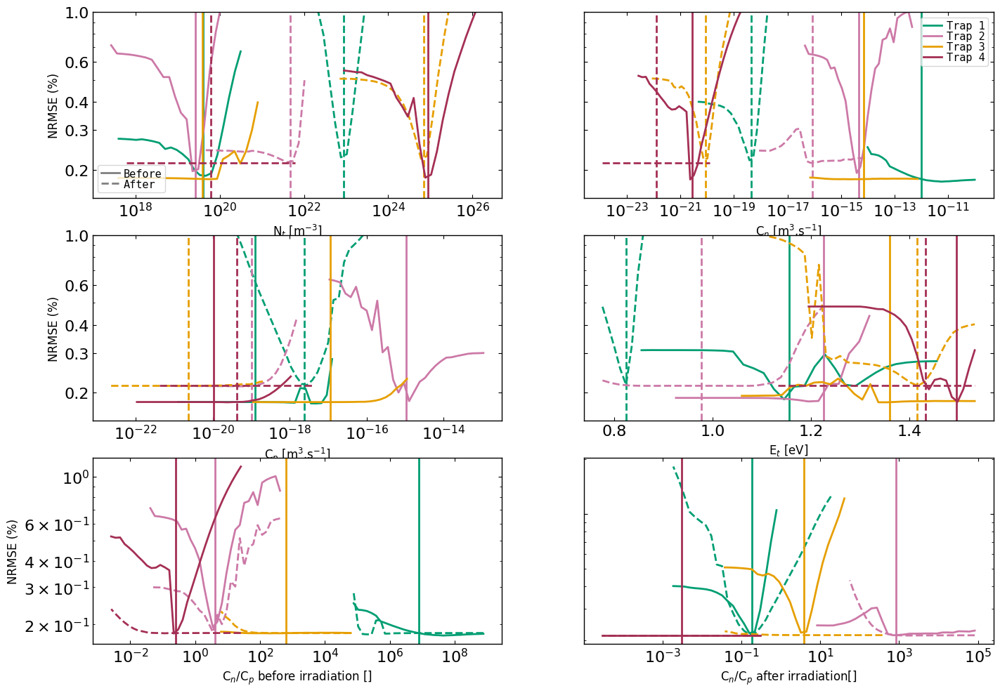

In [202]:
fig, ax = plt.subplots(3,2, figsize=(A4_width*2, A4_height))
color = ["#009E73", "#CC79A7","#E69F00","#A42F54",]

RateEq = brun8_list[list(brun8_list.keys())[0]][2]
RateEq2 = brun8_list[list(brun8_list.keys())[1]][2]
for i, (vb, nb, va, na) in enumerate(zip(vals_2Q3before, nrmse_2Q3before, vals_2Q3after, nrmse_2Q3after)):
    if(i<3):
        continue
    count = (i-3)/4
    ax= ax.flatten()
    ax[(i-3)%4].plot(vb, 10*nb, color=(color[int((i-3)/4)]))
    ax[(i-3)%4].plot(va, 10*na, color=(color[int((i-3)/4)]), linestyle = "--")
    ax[(i-3)%4].axvline(RateEq.params[i+4].value, color=(color[int((i-3)/4)]))
    ax[(i-3)%4].axvline(RateEq2.params[i+4].value, color=(color[int((i-3)/4)]), linestyle = "--")

    if ((i-3)%4 == 1):
        print(RateEq.params[i+4].name, RateEq.params[i+5].name)
        print(RateEq2.params[i+4].name, RateEq2.params[i+5].name)
        cns = vb
        cps = vals_2Q3before[i+1]
        nb_cns = nb
        nb_cps = nrmse_2Q3before[i+1]
        ax[4].axvline(RateEq.params[i+4].value/RateEq.params[i+5].value, color=(color[int((i-3)/4)]))
        ax[4].plot(cns/RateEq.params[i+5].value, 10*(nb_cns), color=(color[int((i-3)/4)]))
        ax[4].plot(RateEq.params[i+4].value/cps, 10*(nb_cps), color=(color[int((i-3)/4)]), linestyle = "--")

        cns = va
        cps = vals_2Q3after[i+1]
        nb_cns = na
        nb_cps = nrmse_2Q3after[i+1]
        ax[5].axvline(RateEq2.params[i+4].value/RateEq2.params[i+5].value, color=(color[int((i-3)/4)]))
        ax[5].plot(cns/RateEq2.params[i+5].value, 10*(nb_cns), color=(color[int((i-3)/4)]))
        ax[5].plot(RateEq2.params[i+4].value/cps, 10*(nb_cps), color=(color[int((i-3)/4)]), linestyle = "--")

ticks = [0.2, 0.3, 0.4, 0.6,1.0]
x_labs = [r'N$_{t}$ [m$^{-3}]$', r'C$_n$ [m$^{3}$.s$^{-1}$]', r'C$_p$ [m$^{3}$.s$^{-1}$]', r'E$_t$ [eV]', r'C$_n$/C$_p$ before irradiation []', r'C$_n$/C$_p$ after irradiation[]']

#Legends Custom
from matplotlib.lines import Line2D
handles = [
    Line2D([0], [0], color="grey", lw=2, ls="-",  label="Before"),
    Line2D([0], [0], color="grey", lw=2, ls="--", label="After"),
]
leg = ax[0].legend(handles = handles, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'lower left', borderaxespad = 0.5, 
                        prop={'family': 'monospace', "size": 11})
handles = [
    Line2D([0], [0], color=color[0], lw=2, ls="-",  label="Trap 1"),
    Line2D([0], [0], color=color[1], lw=2, ls="-", label="Trap 2"),
    Line2D([0], [0], color=color[2], lw=2, ls="-", label="Trap 3"),
    Line2D([0], [0], color=color[3], lw=2, ls="-", label="Trap 4"),
]
ax[1].legend(handles = handles, fontsize = 11, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'upper right', borderaxespad = 0.5, 
                prop={'family': 'monospace', "size": 11})

axisTicks_fontsize = 12
for i, a in enumerate(ax):
    a.set_xlabel(x_labs[i], fontsize = axisTicks_fontsize)
    if not(i==3):
        a.set_xscale("log")
    
    if not(i%2):
        a.set_ylabel("NRMSE (%)", fontsize = axisTicks_fontsize)
    else:
        #a.set_yticks([])
        a.tick_params(axis="y", which="both", labelleft=False)
    
    a.set_yscale("log")    
    if(i<4):
        a.set_ylim([0.15, 1.0])
        
        a.set_yticks(ticks)
        a.yaxis.set_major_formatter(
            mticker.FuncFormatter(lambda y, _: f"{y:.1f}")
        )
        a.yaxis.set_minor_formatter(mticker.NullFormatter())

# ax[0].set_xlim([8e18, 2e23])
# ax[1].set_xlim([8e-23, 1e-10])
# ax[2].set_xlim([1e-20, 8e-15])
# ax[3].set_xlim([0, 1.553])

#export_svg(fig, "/media/qrb/0726-A615/LastVersion/Reviews/Graphs/SI_parameterVar_all.svg", margin_mm = (20, 5, 5, 15), width_in = fig.get_figwidth(), height_in=fig.get_figheight(), wspace=0.05, hspace=0.2)#

C_n_1 C_p_1
C_n_2 C_p_2
C_n_3 C_p_3
C_n_4 C_p_4
C_n_1 C_p_1
C_n_1 C_p_1
C_n_2 C_p_2
C_n_2 C_p_2
C_n_3 C_p_3
C_n_3 C_p_3


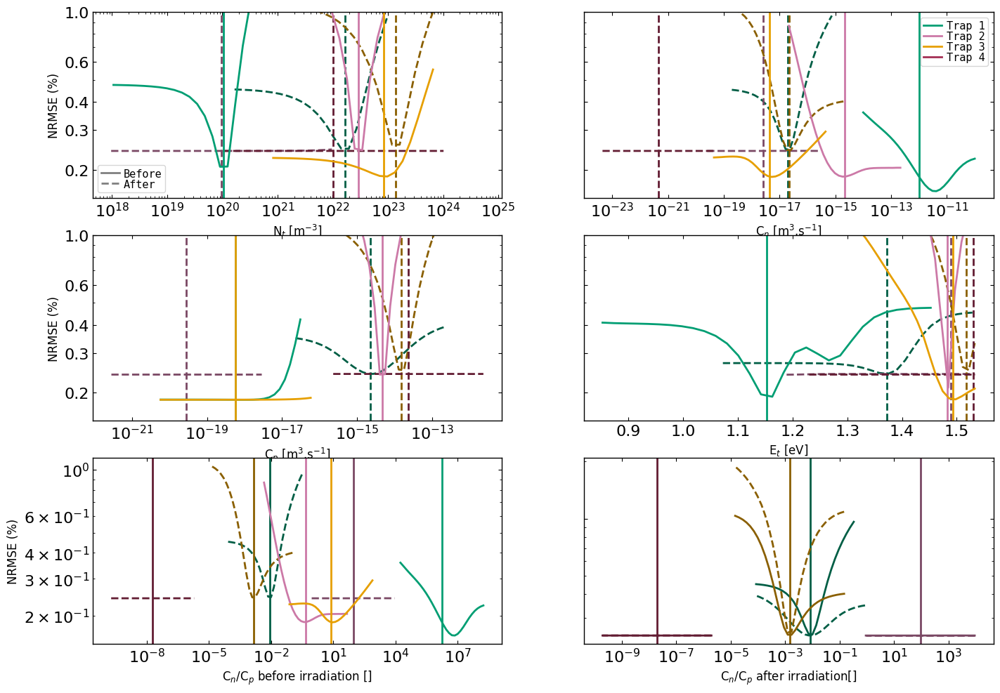

In [209]:
fig, ax = plt.subplots(3,2, figsize=(A4_width*2, A4_height))
color = ["#009E73", "#CC79A7","#E69F00","#A42F54",]

RateEq = brun8_list[list(brun8_list.keys())[2]][2]
RateEq2 = brun8_list[list(brun8_list.keys())[3]][2]
for i, (va, na) in enumerate(zip(vals_3Q2after, nrmse_3Q2after)):
    if(i<3):
        continue
    count = (i-3)/4
    ax= ax.flatten()
    ax[(i-3)%4].plot(va, 10*na, color=darken_hex(color[int((i-3)/4)], factor = 0.6), linestyle = "--")
    ax[(i-3)%4].axvline(RateEq2.params[i+4].value, color=darken_hex(color[int((i-3)/4)], factor = 0.6), linestyle = "--")

    if ((i-3)%4 == 1):
        #print(RateEq.params[i+4].name, RateEq.params[i+5].name)
        print(RateEq2.params[i+4].name, RateEq2.params[i+5].name)
        cns = va
        cps = vals_3Q2after[i+1]
        nb_cns = na
        nb_cps = nrmse_3Q2after[i+1]

        ax[4].axvline(RateEq2.params[i+4].value/RateEq2.params[i+5].value, color=darken_hex(color[int((i-3)/4)], factor = 0.6))
        ax[4].plot(cns/RateEq2.params[i+5].value, 10*(nb_cns), color=darken_hex(color[int((i-3)/4)], factor = 0.6), linestyle = "--")
        #ax[4].plot(RateEq2.params[i+4].value/cps, 10*(nb_cps), color=darken_hex(color[int((i-3)/4)], factor = 0.6), linestyle = "--")

        ax[5].axvline(RateEq2.params[i+4].value/RateEq2.params[i+5].value, color=darken_hex(color[int((i-3)/4)], factor = 0.6))
        ax[5].plot(cns/RateEq2.params[i+5].value, 10*(nb_cns), color=darken_hex(color[int((i-3)/4)], factor = 0.6))
        ax[5].plot(RateEq2.params[i+4].value/cps, 10*(nb_cps), color=darken_hex(color[int((i-3)/4)], factor = 0.6), linestyle = "--")


for i, (vb, nb) in enumerate(zip(vals_3Q2before, nrmse_3Q2before)):
    if(i<3):
        continue
    count = (i-3)/4
    ax= ax.flatten()
    ax[(i-3)%4].plot(vb, 10*nb, color=(color[int((i-3)/4)]))
    ax[(i-3)%4].axvline(RateEq.params[i+4].value, color=(color[int((i-3)/4)]))

    if ((i-3)%4 == 1):
        print(RateEq.params[i+4].name, RateEq.params[i+5].name)
        print(RateEq2.params[i+4].name, RateEq2.params[i+5].name)
        cns = vb
        cps = vals_3Q2before[i+1]
        nb_cns = nb
        nb_cps = nrmse_3Q2before[i+1]
        ax[4].axvline(RateEq.params[i+4].value/RateEq.params[i+5].value, color=(color[int((i-3)/4)]))
        ax[4].plot(cns/RateEq.params[i+5].value, 10*(nb_cns), color=(color[int((i-3)/4)]))
        #ax[4].plot(RateEq.params[i+4].value/cps, 10*(nb_cps), color=(color[int((i-3)/4)]), linestyle = "--")

ticks = [0.2, 0.3, 0.4, 0.6,1.0]
x_labs = [r'N$_{t}$ [m$^{-3}]$', r'C$_n$ [m$^{3}$.s$^{-1}$]', r'C$_p$ [m$^{3}$.s$^{-1}$]', r'E$_t$ [eV]', r'C$_n$/C$_p$ before irradiation []', r'C$_n$/C$_p$ after irradiation[]']

#Legends Custom
from matplotlib.lines import Line2D
handles = [
    Line2D([0], [0], color="grey", lw=2, ls="-",  label="Before"),
    Line2D([0], [0], color="grey", lw=2, ls="--", label="After"),
]
leg = ax[0].legend(handles = handles, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'lower left', borderaxespad = 0.5, 
                        prop={'family': 'monospace', "size": 11})
handles = [
    Line2D([0], [0], color=color[0], lw=2, ls="-",  label="Trap 1"),
    Line2D([0], [0], color=color[1], lw=2, ls="-", label="Trap 2"),
    Line2D([0], [0], color=color[2], lw=2, ls="-", label="Trap 3"),
    Line2D([0], [0], color=color[3], lw=2, ls="-", label="Trap 4"),
]
ax[1].legend(handles = handles, fontsize = 11, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'upper right', borderaxespad = 0.5, 
                prop={'family': 'monospace', "size": 11})

axisTicks_fontsize = 12
for i, a in enumerate(ax):
    a.set_xlabel(x_labs[i], fontsize = axisTicks_fontsize)
    if not(i==3):
        a.set_xscale("log")
    
    if not(i%2):
        a.set_ylabel("NRMSE (%)", fontsize = axisTicks_fontsize)
    else:
        #a.set_yticks([])
        a.tick_params(axis="y", which="both", labelleft=False)
    
    a.set_yscale("log")    
    if(i<4):
        a.set_ylim([0.15, 1.0])
        
        a.set_yticks(ticks)
        a.yaxis.set_major_formatter(
            mticker.FuncFormatter(lambda y, _: f"{y:.1f}")
        )
        a.yaxis.set_minor_formatter(mticker.NullFormatter())

In [172]:
folderpath = r"/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope"
samples_order     = ['2Q3Before', '2Q3After', '3Q2Before', '3Q2After']
run8, E8, P8, brun8_list = import_runs_andreturnBests(folderpath, samples_order)
brun8_list
run8, E8, P8, brun8_list_2tr = import_runs_andreturnBests(folderpath, samples_order, traps_sel=[2,2,2,2])

run8, E8, P8, brun8_list_34tr = import_runs_andreturnBests(folderpath, samples_order, traps_sel=[3,3,4,3])

(brun8_list, brun8_list_2tr, brun8_list_34tr)

Failed for 2Q3Before 5 2
Failed for 2Q3Before 5 3
Failed for 2Q3Before 5 4
Failed for 2Q3After 5 2
Failed for 2Q3After 5 3
Failed for 2Q3After 5 4
Failed for 3Q2Before 5 2
Failed for 3Q2Before 5 3
Failed for 3Q2Before 5 4
Failed for 3Q2After 5 2
Failed for 3Q2After 5 3
Failed for 3Q2After 5 4
Failed for 2Q3Before 5 2
Failed for 2Q3Before 5 3
Failed for 2Q3Before 5 4
Failed for 2Q3After 5 2
Failed for 2Q3After 5 3
Failed for 2Q3After 5 4
Failed for 3Q2Before 5 2
Failed for 3Q2Before 5 3
Failed for 3Q2Before 5 4
Failed for 3Q2After 5 2
Failed for 3Q2After 5 3
Failed for 3Q2After 5 4
Failed for 2Q3Before 5 2
Failed for 2Q3Before 5 3
Failed for 2Q3Before 5 4
Failed for 2Q3After 5 2
Failed for 2Q3After 5 3
Failed for 2Q3After 5 4
Failed for 3Q2Before 5 2
Failed for 3Q2Before 5 3
Failed for 3Q2Before 5 4
Failed for 3Q2After 5 2
Failed for 3Q2After 5 3
Failed for 3Q2After 5 4


({'2Q3Before': (0.0182,
   '/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/00-2Q3Before-4traps-nrmse00182-RateEqAgent.pickle',
   4),
  '2Q3After': (0.0215,
   '/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/00-2Q3Before-5traps-nrmse00215-RateEqAgent.pickle',
   4),
  '3Q2Before': (0.0186,
   '/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/03-3Q2Before-3traps-nrmse00186-RateEqAgent.pickle',
   3),
  '3Q2After': (0.0242,
   '/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/01-3Q2After-4traps-nrmse00242-RateEqAgent.pickle',
   4)},
 {'2Q3Before': (0.0209,
   '/home/qrb/Documents/PhD/Scripts/Chapter1/CsFAPI-Review/Results_allData_RUN8_BDF_5tries_3245TrapsComparison_ExcludeSlope/01-2Q3Before-2traps-nrmse0

In [186]:
list(brun8_list_2tr.keys())[0]
list(brun8_list_2tr.keys())[1]

'2Q3After'

In [184]:
brun8_list_2tr[list(brun8_list_2tr.keys())[0]][2]

0
0
C_n_1 C_p_1
C_n_1 C_p_1
0
0
1
1
C_n_2 C_p_2
C_n_2 C_p_2
1
1


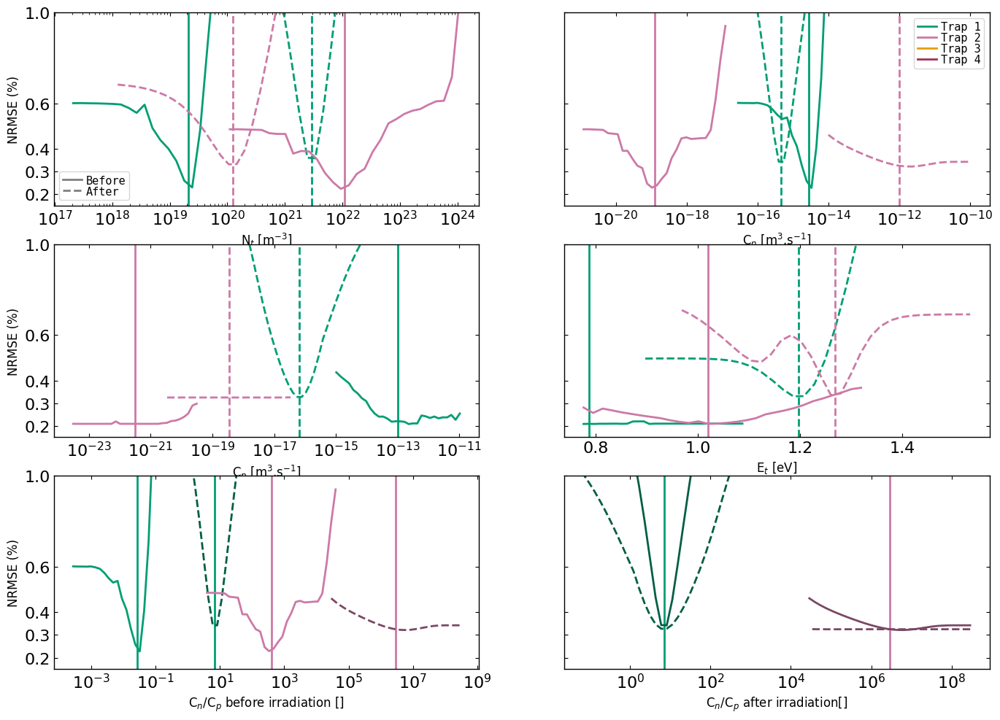

In [211]:
fig, ax = plt.subplots(3,2, figsize=(A4_width*2, A4_height))
color = ["#009E73", "#CC79A7","#E69F00","#A42F54",]

RateEq = brun8_list_2tr[list(brun8_list_2tr.keys())[0]][2]
RateEq2 = brun8_list_2tr[list(brun8_list_2tr.keys())[1]][2]

for i, (vb, nb, va, na) in enumerate(zip(vals_2Traps_2Q3before, nrmse_2Traps_2Q3before, vals_2Traps_2Q3after, nrmse_2Traps_2Q3after)):
    if(i<3):
        continue
    count = (i-3)/4
    ax= ax.flatten()
    print(int((i-3)/4))
    ax[(i-3)%4].plot(vb, 10*nb, color=(color[int((i-3)/4)]))
    ax[(i-3)%4].plot(va, 10*na, color=(color[int((i-3)/4)]), linestyle = "--")
    ax[(i-3)%4].axvline(RateEq.params[i+4].value, color=(color[int((i-3)/4)]))
    ax[(i-3)%4].axvline(RateEq2.params[i+4].value, color=(color[int((i-3)/4)]), linestyle = "--")

    if ((i-3)%4 == 1):
        print(RateEq.params[i+4].name, RateEq.params[i+5].name)
        print(RateEq2.params[i+4].name, RateEq2.params[i+5].name)
        cns = vb
        cps = vals_2Traps_2Q3before[i+1]
        nb_cns = nb
        nb_cps = nrmse_2Traps_2Q3before[i+1]
        ax[4].axvline(RateEq.params[i+4].value/RateEq.params[i+5].value, color=(color[int((i-3)/4)]))
        ax[4].plot(cns/RateEq.params[i+5].value, 10*(nb_cns), color=(color[int((i-3)/4)]))
        #ax[4].plot(RateEq.params[i+4].value/cps, 10*(nb_cps), color=(color[int((i-3)/4)]), linestyle = "--")

        cns = va
        cps = vals_2Traps_2Q3after[i+1]
        nb_cns = na
        nb_cps = nrmse_2Traps_2Q3after[i+1]
        ax[4].axvline(RateEq2.params[i+4].value/RateEq2.params[i+5].value, color=(color[int((i-3)/4)]))
        ax[4].plot(cns/RateEq2.params[i+5].value, 10*(nb_cns), color=darken_hex(color[int((i-3)/4)], factor = 0.6), linestyle = "--")
        #ax[4].plot(RateEq2.params[i+4].value/cps, 10*(nb_cps), color=(color[int((i-3)/4)]), linestyle = "--")

        ax[5].axvline(RateEq2.params[i+4].value/RateEq2.params[i+5].value, color=(color[int((i-3)/4)]))
        ax[5].plot(cns/RateEq2.params[i+5].value, 10*(nb_cns), color=darken_hex(color[int((i-3)/4)], factor = 0.6))
        ax[5].plot(RateEq2.params[i+4].value/cps, 10*(nb_cps), color=darken_hex(color[int((i-3)/4)], factor = 0.6), linestyle = "--")

ticks = [0.2, 0.3, 0.4, 0.6,1.0]
x_labs = [r'N$_{t}$ [m$^{-3}]$', r'C$_n$ [m$^{3}$.s$^{-1}$]', r'C$_p$ [m$^{3}$.s$^{-1}$]', r'E$_t$ [eV]', r'C$_n$/C$_p$ before irradiation []', r'C$_n$/C$_p$ after irradiation[]']

#Legends Custom
from matplotlib.lines import Line2D
handles = [
    Line2D([0], [0], color="grey", lw=2, ls="-",  label="Before"),
    Line2D([0], [0], color="grey", lw=2, ls="--", label="After"),
]
leg = ax[0].legend(handles = handles, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'lower left', borderaxespad = 0.5, 
                        prop={'family': 'monospace', "size": 11})
handles = [
    Line2D([0], [0], color=color[0], lw=2, ls="-",  label="Trap 1"),
    Line2D([0], [0], color=color[1], lw=2, ls="-", label="Trap 2"),
    Line2D([0], [0], color=color[2], lw=2, ls="-", label="Trap 3"),
    Line2D([0], [0], color=color[3], lw=2, ls="-", label="Trap 4"),
]
ax[1].legend(handles = handles, fontsize = 11, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'upper right', borderaxespad = 0.5, 
                prop={'family': 'monospace', "size": 11})

axisTicks_fontsize = 12
for i, a in enumerate(ax):
    a.set_xlabel(x_labs[i], fontsize = axisTicks_fontsize)
    if not(i==3):
        a.set_xscale("log")
    
    if not(i%2):
        a.set_ylabel("NRMSE (%)", fontsize = axisTicks_fontsize)
    else:
        #a.set_yticks([])
        a.tick_params(axis="y", which="both", labelleft=False)
    
    a.set_yscale("linear")
    if(i<6):
        a.set_ylim([0.15, 1.0])
        
        a.set_yticks(ticks)
        a.yaxis.set_major_formatter(
            mticker.FuncFormatter(lambda y, _: f"{y:.1f}")
        )
        a.yaxis.set_minor_formatter(mticker.NullFormatter())

# ax[0].set_xlim([8e18, 2e23])
# ax[1].set_xlim([8e-23, 1e-10])
# ax[2].set_xlim([1e-20, 8e-15])
# ax[3].set_xlim([0, 1.553])

#export_svg(fig, "/media/qrb/0726-A615/LastVersion/Reviews/Graphs/SI_parameterVar_all.svg", margin_mm = (20, 5, 5, 15), width_in = fig.get_figwidth(), height_in=fig.get_figheight(), wspace=0.05, hspace=0.2)#

0
0
C_n_1 C_p_1
C_n_1 C_p_1
0
0
1
1
C_n_2 C_p_2
C_n_2 C_p_2
1
1


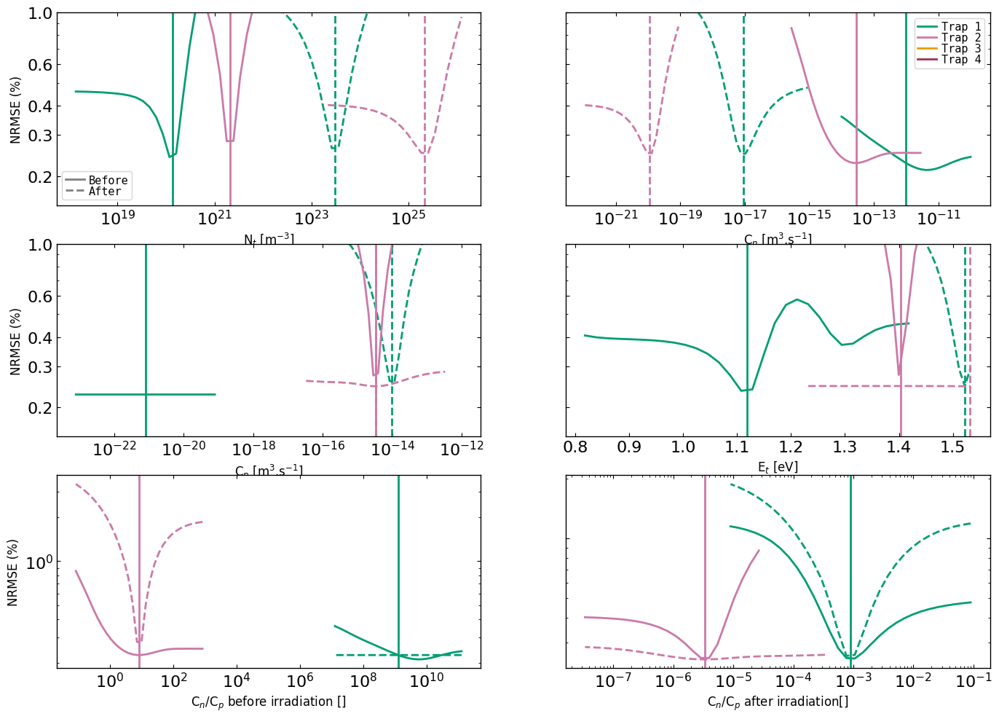

In [195]:
fig, ax = plt.subplots(3,2, figsize=(A4_width*2, A4_height))
color = ["#009E73", "#CC79A7","#E69F00","#A42F54",]

RateEq = brun8_list_2tr[list(brun8_list_2tr.keys())[2]][2]
RateEq2 = brun8_list_2tr[list(brun8_list_2tr.keys())[3]][2]

for i, (vb, nb, va, na) in enumerate(zip(vals_2Traps_3Q2before, nrmse_2Traps_3Q2before, vals_2Traps_3Q2after, nrmse_2Traps_3Q2after)):
    if(i<3):
        continue
    count = (i-3)/4
    ax= ax.flatten()
    print(int((i-3)/4))
    ax[(i-3)%4].plot(vb, 10*nb, color=(color[int((i-3)/4)]))
    ax[(i-3)%4].plot(va, 10*na, color=(color[int((i-3)/4)]), linestyle = "--")
    ax[(i-3)%4].axvline(RateEq.params[i+4].value, color=(color[int((i-3)/4)]))
    ax[(i-3)%4].axvline(RateEq2.params[i+4].value, color=(color[int((i-3)/4)]), linestyle = "--")

    if ((i-3)%4 == 1):
        print(RateEq.params[i+4].name, RateEq.params[i+5].name)
        print(RateEq2.params[i+4].name, RateEq2.params[i+5].name)
        cns = vb
        cps = vals_2Traps_3Q2before[i+1]
        nb_cns = nb
        nb_cps = nrmse_2Traps_3Q2before[i+1]
        ax[4].axvline(RateEq.params[i+4].value/RateEq.params[i+5].value, color=(color[int((i-3)/4)]))
        ax[4].plot(cns/RateEq.params[i+5].value, 10*(nb_cns), color=(color[int((i-3)/4)]))
        ax[4].plot(RateEq.params[i+4].value/cps, 10*(nb_cps), color=(color[int((i-3)/4)]), linestyle = "--")

        cns = va
        cps = vals_2Traps_3Q2after[i+1]
        nb_cns = na
        nb_cps = nrmse_2Traps_3Q2after[i+1]
        ax[5].axvline(RateEq2.params[i+4].value/RateEq2.params[i+5].value, color=(color[int((i-3)/4)]))
        ax[5].plot(cns/RateEq2.params[i+5].value, 10*(nb_cns), color=(color[int((i-3)/4)]))
        ax[5].plot(RateEq2.params[i+4].value/cps, 10*(nb_cps), color=(color[int((i-3)/4)]), linestyle = "--")

ticks = [0.2, 0.3, 0.4, 0.6,1.0]
x_labs = [r'N$_{t}$ [m$^{-3}]$', r'C$_n$ [m$^{3}$.s$^{-1}$]', r'C$_p$ [m$^{3}$.s$^{-1}$]', r'E$_t$ [eV]', r'C$_n$/C$_p$ before irradiation []', r'C$_n$/C$_p$ after irradiation[]']

#Legends Custom
from matplotlib.lines import Line2D
handles = [
    Line2D([0], [0], color="grey", lw=2, ls="-",  label="Before"),
    Line2D([0], [0], color="grey", lw=2, ls="--", label="After"),
]
leg = ax[0].legend(handles = handles, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'lower left', borderaxespad = 0.5, 
                        prop={'family': 'monospace', "size": 11})
handles = [
    Line2D([0], [0], color=color[0], lw=2, ls="-",  label="Trap 1"),
    Line2D([0], [0], color=color[1], lw=2, ls="-", label="Trap 2"),
    Line2D([0], [0], color=color[2], lw=2, ls="-", label="Trap 3"),
    Line2D([0], [0], color=color[3], lw=2, ls="-", label="Trap 4"),
]
ax[1].legend(handles = handles, fontsize = 11, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'upper right', borderaxespad = 0.5, 
                prop={'family': 'monospace', "size": 11})

axisTicks_fontsize = 12
for i, a in enumerate(ax):
    a.set_xlabel(x_labs[i], fontsize = axisTicks_fontsize)
    if not(i==3):
        a.set_xscale("log")
    
    if not(i%2):
        a.set_ylabel("NRMSE (%)", fontsize = axisTicks_fontsize)
    else:
        #a.set_yticks([])
        a.tick_params(axis="y", which="both", labelleft=False)
    
    a.set_yscale("log")    
    if(i<4):
        a.set_ylim([0.15, 1.0])
        
        a.set_yticks(ticks)
        a.yaxis.set_major_formatter(
            mticker.FuncFormatter(lambda y, _: f"{y:.1f}")
        )
        a.yaxis.set_minor_formatter(mticker.NullFormatter())

0
0
C_n_1 C_p_1
C_n_1 C_p_1
0
0
1
1
C_n_2 C_p_2
C_n_2 C_p_2
1
1
0
0
C_n_1 C_p_1
C_n_1 C_p_1
0
0
1
1
C_n_2 C_p_2
C_n_2 C_p_2
1
1


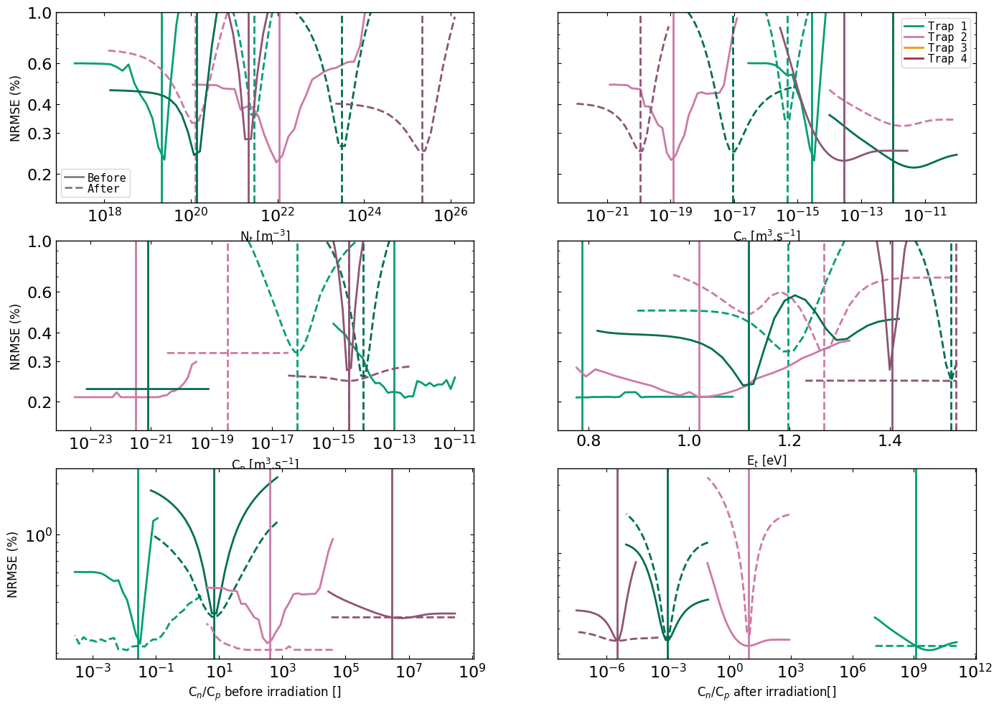

In [197]:
fig, ax = plt.subplots(3,2, figsize=(A4_width*2, A4_height))
color = ["#009E73", "#CC79A7","#E69F00","#A42F54",]

RateEq = brun8_list_2tr[list(brun8_list_2tr.keys())[0]][2]
RateEq2 = brun8_list_2tr[list(brun8_list_2tr.keys())[1]][2]
for i, (vb, nb, va, na) in enumerate(zip(vals_2Traps_2Q3before, nrmse_2Traps_2Q3before, vals_2Traps_2Q3after, nrmse_2Traps_2Q3after)):
    if(i<3):
        continue
    count = (i-3)/4
    ax= ax.flatten()
    print(int((i-3)/4))
    ax[(i-3)%4].plot(vb, 10*nb, color=(color[int((i-3)/4)]))
    ax[(i-3)%4].plot(va, 10*na, color=(color[int((i-3)/4)]), linestyle = "--")
    ax[(i-3)%4].axvline(RateEq.params[i+4].value, color=(color[int((i-3)/4)]))
    ax[(i-3)%4].axvline(RateEq2.params[i+4].value, color=(color[int((i-3)/4)]), linestyle = "--")

    if ((i-3)%4 == 1):
        print(RateEq.params[i+4].name, RateEq.params[i+5].name)
        print(RateEq2.params[i+4].name, RateEq2.params[i+5].name)
        cns = vb
        cps = vals_2Traps_2Q3before[i+1]
        nb_cns = nb
        nb_cps = nrmse_2Traps_2Q3before[i+1]
        ax[4].axvline(RateEq.params[i+4].value/RateEq.params[i+5].value, color=(color[int((i-3)/4)]))
        ax[4].plot(cns/RateEq.params[i+5].value, 10*(nb_cns), color=(color[int((i-3)/4)]))
        ax[4].plot(RateEq.params[i+4].value/cps, 10*(nb_cps), color=(color[int((i-3)/4)]), linestyle = "--")

        cns = va
        cps = vals_2Traps_2Q3after[i+1]
        nb_cns = na
        nb_cps = nrmse_2Traps_2Q3after[i+1]
        ax[4].axvline(RateEq2.params[i+4].value/RateEq2.params[i+5].value, color=darken_hex(color[int((i-3)/4)], factor=0.7))
        ax[4].plot(cns/RateEq2.params[i+5].value, 10*(nb_cns), color=darken_hex(color[int((i-3)/4)], factor=0.7))
        ax[4].plot(RateEq2.params[i+4].value/cps, 10*(nb_cps), color=darken_hex(color[int((i-3)/4)], factor=0.7), linestyle = "--")


RateEq = brun8_list_2tr[list(brun8_list_2tr.keys())[2]][2]
RateEq2 = brun8_list_2tr[list(brun8_list_2tr.keys())[3]][2]
for i, (vb, nb, va, na) in enumerate(zip(vals_2Traps_3Q2before, nrmse_2Traps_3Q2before, vals_2Traps_3Q2after, nrmse_2Traps_3Q2after)):
    if(i<3):
        continue
    count = (i-3)/4
    ax= ax.flatten()
    print(int((i-3)/4))
    ax[(i-3)%4].plot(vb, 10*nb, color=darken_hex(color[int((i-3)/4)], factor=0.7))
    ax[(i-3)%4].plot(va, 10*na, color=darken_hex(color[int((i-3)/4)], factor=0.7), linestyle = "--")
    ax[(i-3)%4].axvline(RateEq.params[i+4].value, color=darken_hex(color[int((i-3)/4)], factor=0.7))
    ax[(i-3)%4].axvline(RateEq2.params[i+4].value, color=darken_hex(color[int((i-3)/4)], factor=0.7), linestyle = "--")

    if ((i-3)%4 == 1):
        print(RateEq.params[i+4].name, RateEq.params[i+5].name)
        print(RateEq2.params[i+4].name, RateEq2.params[i+5].name)
        cns = vb
        cps = vals_2Traps_3Q2before[i+1]
        nb_cns = nb
        nb_cps = nrmse_2Traps_3Q2before[i+1]
        ax[5].axvline(RateEq.params[i+4].value/RateEq.params[i+5].value, color=(color[int((i-3)/4)]))
        ax[5].plot(cns/RateEq.params[i+5].value, 10*(nb_cns), color=(color[int((i-3)/4)]))
        ax[5].plot(RateEq.params[i+4].value/cps, 10*(nb_cps), color=(color[int((i-3)/4)]), linestyle = "--")

        cns = va
        cps = vals_2Traps_3Q2after[i+1]
        nb_cns = na
        nb_cps = nrmse_2Traps_3Q2after[i+1]
        ax[5].axvline(RateEq2.params[i+4].value/RateEq2.params[i+5].value, color=darken_hex(color[int((i-3)/4)], factor = 0.7))
        ax[5].plot(cns/RateEq2.params[i+5].value, 10*(nb_cns), color=darken_hex(color[int((i-3)/4)], factor = 0.7))
        ax[5].plot(RateEq2.params[i+4].value/cps, 10*(nb_cps), color=darken_hex(color[int((i-3)/4)], factor = 0.7), linestyle = "--")

ticks = [0.2, 0.3, 0.4, 0.6,1.0]
x_labs = [r'N$_{t}$ [m$^{-3}]$', r'C$_n$ [m$^{3}$.s$^{-1}$]', r'C$_p$ [m$^{3}$.s$^{-1}$]', r'E$_t$ [eV]', r'C$_n$/C$_p$ before irradiation []', r'C$_n$/C$_p$ after irradiation[]']

#Legends Custom
from matplotlib.lines import Line2D
handles = [
    Line2D([0], [0], color="grey", lw=2, ls="-",  label="Before"),
    Line2D([0], [0], color="grey", lw=2, ls="--", label="After"),
]
leg = ax[0].legend(handles = handles, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'lower left', borderaxespad = 0.5, 
                        prop={'family': 'monospace', "size": 11})
handles = [
    Line2D([0], [0], color=color[0], lw=2, ls="-",  label="Trap 1"),
    Line2D([0], [0], color=color[1], lw=2, ls="-", label="Trap 2"),
    Line2D([0], [0], color=color[2], lw=2, ls="-", label="Trap 3"),
    Line2D([0], [0], color=color[3], lw=2, ls="-", label="Trap 4"),
]
ax[1].legend(handles = handles, fontsize = 11, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'upper right', borderaxespad = 0.5, 
                prop={'family': 'monospace', "size": 11})

axisTicks_fontsize = 12
for i, a in enumerate(ax):
    a.set_xlabel(x_labs[i], fontsize = axisTicks_fontsize)
    if not(i==3):
        a.set_xscale("log")
    
    if not(i%2):
        a.set_ylabel("NRMSE (%)", fontsize = axisTicks_fontsize)
    else:
        #a.set_yticks([])
        a.tick_params(axis="y", which="both", labelleft=False)
    
    a.set_yscale("log")    
    if(i<4):
        a.set_ylim([0.15, 1.0])
        
        a.set_yticks(ticks)
        a.yaxis.set_major_formatter(
            mticker.FuncFormatter(lambda y, _: f"{y:.1f}")
        )
        a.yaxis.set_minor_formatter(mticker.NullFormatter())

# ax[0].set_xlim([8e18, 2e23])
# ax[1].set_xlim([8e-23, 1e-10])
# ax[2].set_xlim([1e-20, 8e-15])
# ax[3].set_xlim([0, 1.553])

#export_svg(fig, "/media/qrb/0726-A615/LastVersion/Reviews/Graphs/SI_parameterVar_all.svg", margin_mm = (20, 5, 5, 15), width_in = fig.get_figwidth(), height_in=fig.get_figheight(), wspace=0.05, hspace=0.2)#

C_n_1 C_p_1
C_n_2 C_p_2
C_n_3 C_p_3
4
8
12
C_n_1 C_p_1
C_n_2 C_p_2
C_n_3 C_p_3


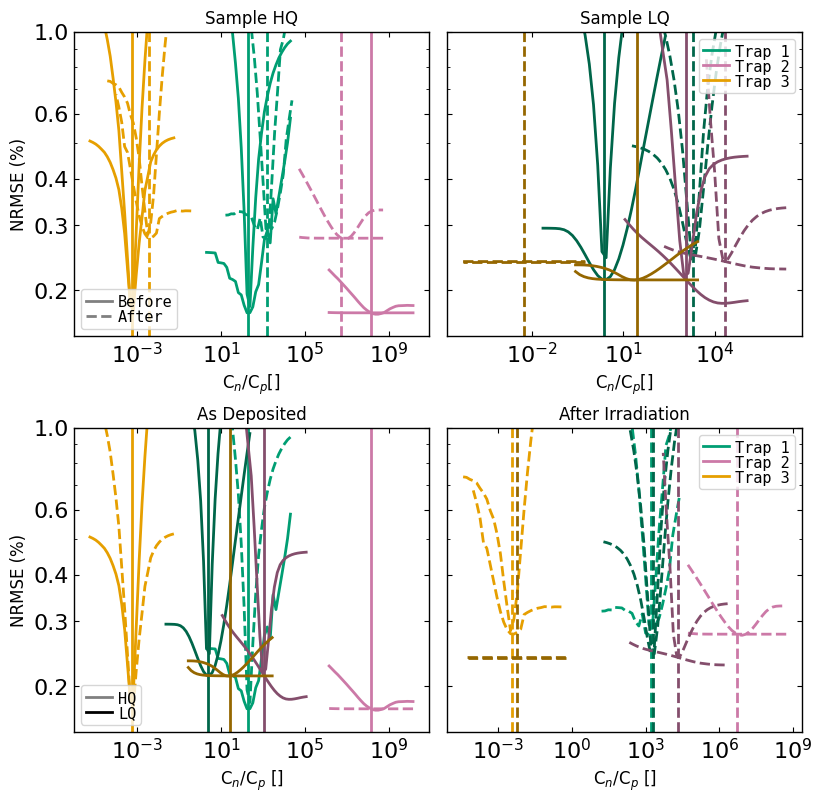

In [912]:
fig, ax = plt.subplots(2,2, figsize=(A4_width, A4_height/1.5))

for i, (vb, nb, va, na) in enumerate(zip(vals_2Q3before, nrmse_2Q3before, vals_2Q3after, nrmse_2Q3after)):
    if(i<3):
        continue
    ax= ax.flatten()

    if ((i-3)%4 == 1):
        print(RateEq.params[i+4].name, RateEq.params[i+5].name)
        cns = vb
        cps = vals_2Q3before[i+1]
        nb_cns = nb
        nb_cps = nrmse_2Q3before[i+1]
        ax[0].axvline(RateEq.params[i+4].value/RateEq.params[i+5].value, color=color[int((i-3)/4)])
        ax[0].plot(cns/RateEq.params[i+5].value, 10*(nb_cns), color=color[int((i-3)/4)])
        ax[0].plot(RateEq.params[i+4].value/cps, 10*(nb_cps), color=color[int((i-3)/4)])

        ax[2].axvline(RateEq.params[i+4].value/RateEq.params[i+5].value, color=color[int((i-3)/4)])
        ax[2].plot(cns/RateEq.params[i+5].value, 10*(nb_cns), color=color[int((i-3)/4)])
        ax[2].plot(RateEq.params[i+4].value/cps, 10*(nb_cps), color=color[int((i-3)/4)], linestyle = "--")

for i, (va, na) in enumerate(zip(vals_2Q3after, nrmse_2Q3after)):
    if(i<3):
        continue
    color_switch = [color[0], color[2], color[1]]
    if ((i-3)%4 == 1):
        print(i)
        cns = va
        cps = vals_2Q3after[i+1]
        nb_cns = na
        nb_cps = nrmse_2Q3after[i+1]
        ax[0].axvline(RateEq2.params[i+4].value/RateEq2.params[i+5].value, color=color_switch[int((i-3)/4)], linestyle = "--")
        ax[0].plot(cns/RateEq2.params[i+5].value, 10*(nb_cns), color=color_switch[int((i-3)/4)], linestyle = "--")
        ax[0].plot(RateEq2.params[i+4].value/cps, 10*(nb_cps), color=color_switch[int((i-3)/4)], linestyle = "--")

        ax[3].axvline(RateEq2.params[i+4].value/RateEq2.params[i+5].value, color=color_switch[int((i-3)/4)], linestyle = "--")
        ax[3].plot(cns/RateEq2.params[i+5].value, 10*(nb_cns), color=color_switch[int((i-3)/4)], linestyle = "--")
        ax[3].plot(RateEq2.params[i+4].value/cps, 10*(nb_cps), color=color_switch[int((i-3)/4)], linestyle = "--")

factor_col = 0.65
for i, (vb, nb, va, na) in enumerate(zip(vals_3Q2before, nrmse_3Q2before, vals_3Q2after, nrmse_3Q2after)):
    if(i<3):
        continue
    ax= ax.flatten()
    if ((i-3)%4 == 1):
        print(RateEq3.params[i+4].name, RateEq3.params[i+5].name)
        cns = vb
        cps = vals_3Q2before[i+1]
        nb_cns = nb
        nb_cps = nrmse_3Q2before[i+1]
        ax[1].axvline(RateEq3.params[i+4].value/RateEq3.params[i+5].value, color=darken_hex(color[int((i-3)/4)], factor = factor_col))
        ax[1].plot(cns/RateEq3.params[i+5].value, 10*(nb_cns), color=darken_hex(color[int((i-3)/4)], factor = factor_col))
        ax[1].plot(RateEq3.params[i+4].value/cps, 10*(nb_cps), color=darken_hex(color[int((i-3)/4)], factor = factor_col))

        ax[2].axvline(RateEq3.params[i+4].value/RateEq3.params[i+5].value, color=darken_hex(color[int((i-3)/4)], factor = factor_col))
        ax[2].plot(cns/RateEq3.params[i+5].value, 10*(nb_cns), color=darken_hex(color[int((i-3)/4)], factor = factor_col))
        ax[2].plot(RateEq3.params[i+4].value/cps, 10*(nb_cps), color=darken_hex(color[int((i-3)/4)], factor = factor_col))

        cns = va
        cps = vals_3Q2after[i+1]
        nb_cns = na
        nb_cps = nrmse_3Q2after[i+1]
        ax[1].axvline(RateEq4.params[i+4].value/RateEq4.params[i+5].value, color=darken_hex(color[int((i-3)/4)], factor = factor_col), linestyle = "--")
        ax[1].plot(cns/RateEq4.params[i+5].value, 10*(nb_cns), color=darken_hex(color[int((i-3)/4)], factor = factor_col), linestyle = "--")
        ax[1].plot(RateEq4.params[i+4].value/cps, 10*(nb_cps), color=darken_hex(color[int((i-3)/4)], factor = factor_col), linestyle = "--")

        ax[3].axvline(RateEq4.params[i+4].value/RateEq4.params[i+5].value, color=darken_hex(color[int((i-3)/4)], factor = factor_col), linestyle = "--")
        ax[3].plot(cns/RateEq4.params[i+5].value, 10*(nb_cns), color=darken_hex(color[int((i-3)/4)], factor = factor_col), linestyle = "--")
        ax[3].plot(RateEq4.params[i+4].value/cps, 10*(nb_cps), color=darken_hex(color[int((i-3)/4)], factor = factor_col), linestyle = "--")

ticks = [0.2, 0.3, 0.4, 0.6,1.0]
x_labs = [r'C$_n$/C$_p$[]', r'C$_n$/C$_p$[]', r'C$_n$/C$_p$ []', r'C$_n$/C$_p$ []']

#Legends Custom
from matplotlib.lines import Line2D
handles = [
    Line2D([0], [0], color="grey", lw=2, ls="-",  label="Before"),
    Line2D([0], [0], color="grey", lw=2, ls="--", label="After"),
]
leg = ax[0].legend(handles = handles, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'lower left', borderaxespad = 0.5, 
                        prop={'family': 'monospace', "size": 11})
handles = [
    Line2D([0], [0], color=color[0], lw=2, ls="-",  label="Trap 1"),
    Line2D([0], [0], color=color[1], lw=2, ls="-", label="Trap 2"),
    Line2D([0], [0], color=color[2], lw=2, ls="-", label="Trap 3"),
]
ax[1].legend(handles = handles, fontsize = 11, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'upper right', borderaxespad = 0.5, 
                prop={'family': 'monospace', "size": 11})


#Legends Custom
from matplotlib.lines import Line2D
handles = [
    Line2D([0], [0], color="grey", lw=2, ls="-",  label="HQ"),
    Line2D([0], [0], color="black", lw=2, ls="-", label="LQ"),
]
leg = ax[2].legend(handles = handles, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'lower left', borderaxespad = 0.5, 
                        prop={'family': 'monospace', "size": 11})
handles = [
    Line2D([0], [0], color=color[0], lw=2, ls="-",  label="Trap 1"),
    Line2D([0], [0], color=color[1], lw=2, ls="-", label="Trap 2"),
    Line2D([0], [0], color=color[2], lw=2, ls="-", label="Trap 3"),
]
ax[3].legend(handles = handles, fontsize = 11, borderpad=0.3, labelspacing=0.0, handletextpad=0.4, handlelength=1.7, markerscale=0.5, loc = 'upper right', borderaxespad = 0.5, 
                prop={'family': 'monospace', "size": 11})

axisTicks_fontsize = 12
for i, a in enumerate(ax):
    a.set_xlabel(x_labs[i], fontsize = axisTicks_fontsize)
    # if not(i==3):
    #     a.set_xscale("log")

    if not(i%2):
        a.set_ylabel("NRMSE (%)", fontsize = axisTicks_fontsize)
    else:
        #a.set_yticks([])
        a.tick_params(axis="y", which="both", labelleft=False)
    a.set_xscale("log")
    a.set_yscale("log")    
    if(i<4):
        a.set_ylim([0.15, 1.0])
        
        a.set_yticks(ticks)
        a.yaxis.set_major_formatter(
            mticker.FuncFormatter(lambda y, _: f"{y:.1f}")
        )
        a.yaxis.set_minor_formatter(mticker.NullFormatter())

ax[0].set_title("Sample HQ", fontsize = axisTicks_fontsize)
ax[1].set_title("Sample LQ", fontsize = axisTicks_fontsize)

ax[2].set_title("As Deposited", fontsize = axisTicks_fontsize)
ax[3].set_title("After Irradiation", fontsize = axisTicks_fontsize)
# ax[1].set_xlim([8e-23, 1e-10])
# ax[2].set_xlim([1e-20, 8e-15])
# ax[3].set_xlim([0, 1.553])

export_svg(fig, "/media/qrb/0726-A615/LastVersion/Reviews/Graphs/SI_parameterVar_CnOverCP.png", margin_mm = (20, 5, 5, 15), width_in = fig.get_figwidth(), height_in=fig.get_figheight(), wspace=0.05, hspace=0.3)#